In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay,f1_score,recall_score,precision_score

# Dictionary

*ID* ; Customer ID of Applicant

*year* ; Year of Application

*loan limit* ; maximum avaliable amount of the loan allowed to be taken

*Gender* ; sex type

*approv_in_adv* ; Is loan pre-approved or not

*loan_type* ; Type of loan

*loan_purpose* ; the reason you want to borrow money

*Credit_Worthiness* ; is how a lender determines that you will default on your debt obligations, or how worthy you are to receive new credit.

*open_credit* ; is a pre-approved loan between a lender and a borrower. It allows the borrower to make repeated withdrawals up to a certain limit.

*business_or_commercial* ; Usage type of the loan amount

*loan_amount* ; The exact loan amount

*rate_of_interest* ; is the amount a lender charges a borrower and is a percentage of the principal—the amount loaned.

*Interest_rate_spread* ; the difference between the interest rate a financial institution pays to depositors and the interest rate it receives from loans

*Upfront_charges* ; Fee paid to a lender by a borrower as consideration for making a new loan

*term* ; the loan's repayment period

*Neg_ammortization* ; refers to a situation when a loan borrower makes a payment less than the standard installment set by the bank.

*interest_only* ; amount of interest only without principles

*lump_sum_payment* ; is an amount of money that is paid in one single payment rather than in installments.

*property_value* ; the present worth of future benefits arising from the ownership of the property

*construction_type* ; Collateral construction type

*occupancy_type* ; classifications refer to categorizing structures based on their usage

*Secured_by* ; Type of Collatoral

*total_units* ; number of unites

*income* ; refers to the amount of money, property, and other transfers of value received over a set period of time

*credit_type* ; type of credit

*co-applicant_credit_type* ; is an additional person involved in the loan application process. Both applicant and co-applicant apply and sign for the loan

*age* ; applicant's age

*submission_of_application* ; Ensure the application is complete or not

*LTV* ; life-time value (LTV) is a prognostication of the net profit

*Region* ; applicant's place

*Security_Type* ; Type of Collatoral

*status* ; Loan status (Approved/Declined)

*dtir1* ; debt-to-income ratio

# Import Dataset

In [ ]:
df = pd.read_csv('Loan_Default12345.csv')
df.head()

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,...,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,...,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,...,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,...,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0


In [ ]:
#df = pd.read_csv("Loan_Default12345.csv")

In [ ]:
print(df.shape)
df.head()

(148670, 34)


,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,...,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,...,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,...,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,...,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0


**INTERPRETATION**

1) from the dataset we can understand that there are 1.48 lakhs of rows and 34 columns

2) Data has the both numerical and categrocial columns

3) some of the columns we have to do type conversion

4) data has the null values from the head sections it self



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 34 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ID                         148670 non-null  int64  
 1   year                       148670 non-null  int64  
 2   loan_limit                 145326 non-null  object 
 3   Gender                     148670 non-null  object 
 4   approv_in_adv              147762 non-null  object 
 5   loan_type                  148670 non-null  object 
 6   loan_purpose               148536 non-null  object 
 7   Credit_Worthiness          148670 non-null  object 
 8   open_credit                148670 non-null  object 
 9   business_or_commercial     148670 non-null  object 
 10  loan_amount                148670 non-null  int64  
 11  rate_of_interest           112231 non-null  float64
 12  Interest_rate_spread       112031 non-null  float64
 13  Upfront_charges            10

**Interpretaion**

1) data set has the mix of numerical and categorical carrying int,float,object data types 

2) for some of the columns the data type is properly set but for few columns the data type is not proper

3) from the dataset we can say term can be a categorical column but it is mentioned in numerical

4) our target columns in Status we can see that our target column is also numerical where as it should be in categorcial


In [ ]:
df.describe()

,ID,year,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,property_value,income,Credit_Score,LTV,Status,dtir1
count,148670.000000,148670.0,1.486700e+05,112231.000000,112031.000000,109028.000000,148629.000000,1.335720e+05,139520.000000,148670.000000,133572.000000,148670.000000,124549.000000
mean,99224.500000,2019.0,3.311177e+05,4.045476,0.441656,3224.996127,335.136582,4.978935e+05,6957.338876,699.789103,72.746457,0.246445,37.732932
std,42917.476598,0.0,1.839093e+05,0.561391,0.513043,3251.121510,58.409084,3.599353e+05,6496.586382,115.875857,39.967603,0.430942,10.545435
min,24890.000000,2019.0,1.650000e+04,0.000000,-3.638000,0.000000,96.000000,8.000000e+03,0.000000,500.000000,0.967478,0.000000,5.000000
25%,62057.250000,2019.0,1.965000e+05,3.625000,0.076000,581.490000,360.000000,2.680000e+05,3720.000000,599.000000,60.474860,0.000000,31.000000
50%,99224.500000,2019.0,2.965000e+05,3.990000,0.390400,2596.450000,360.000000,4.180000e+05,5760.000000,699.000000,75.135870,0.000000,39.000000
75%,136391.750000,2019.0,4.365000e+05,4.375000,0.775400,4812.500000,360.000000,6.280000e+05,8520.000000,800.000000,86.184211,0.000000,45.000000
max,173559.000000,2019.0,3.576500e+06,8.000000,3.357000,60000.000000,360.000000,1.650800e+07,578580.000000,900.000000,7831.250000,1.000000,61.000000


**Interpretaion**

1) we can see the describe function and it explianing us that data is spread randomly for different columns 

2) the min and max value for the term  is 90 to 360 and similary credit score has min of 500 and max 900

3) by looking at the count of each columns we can say it is different for column to columns so there are outliers prasent in 
   this data set
    
    
4) looking at the columns income the data is not normally distributed as min income is 0  and max income is 578580. so for 
   these columns we have to scaling as well.
   
5) we can see the Min, Max, Median and quantiles for the each Numerical columns. the mean value for the income is 5760,
   for property value mean is 418000.
   
6) bank is getting applicants for the min loan amount of 16500 and up to max loan amount 35,76500 Lakhs and we can see the 
   average loan amount 2,96,500.00. and the average credit score of the applicants 699.0
   
7) most of the bank applicants are seeking an average term period as 360 months and average dtir1 for them applcants are 
   39, the average LTV(life time value) of a applicant is 75.15
   
   
8) The Minimum rate of intrest is 0 and max is 8 with an average intrest rate is 3.99 and mean of upfront charges is 2596
    
    



In [ ]:
num_col = df.select_dtypes(include=np.number)
print(num_col.shape)
num_col.head()

(148670, 13)


,ID,year,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,property_value,income,Credit_Score,LTV,Status,dtir1
0,24890,2019,116500,NaN,NaN,NaN,360.0,118000.0,1740.0,758,98.728814,1,45.0
1,24891,2019,206500,NaN,NaN,NaN,360.0,NaN,4980.0,552,NaN,1,NaN
2,24892,2019,406500,4.56,0.2000,595.0,360.0,508000.0,9480.0,834,80.019685,0,46.0
3,24893,2019,456500,4.25,0.6810,NaN,360.0,658000.0,11880.0,587,69.376900,0,42.0
4,24894,2019,696500,4.00,0.3042,0.0,360.0,758000.0,10440.0,602,91.886544,0,39.0


In [ ]:
cat_col = df.select_dtypes(include="object")
print(cat_col.shape)
cat_col.head()

(148670, 21)


,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,Neg_ammortization,interest_only,...,construction_type,occupancy_type,Secured_by,total_units,credit_type,co-applicant_credit_type,age,submission_of_application,Region,Security_Type
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,not_neg,not_int,...,sb,pr,home,1U,EXP,CIB,25-34,to_inst,south,direct
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,not_neg,not_int,...,sb,pr,home,1U,EQUI,EXP,55-64,to_inst,North,direct
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,neg_amm,not_int,...,sb,pr,home,1U,EXP,CIB,35-44,to_inst,south,direct
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,not_neg,not_int,...,sb,pr,home,1U,EXP,CIB,45-54,not_inst,North,direct
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,not_neg,not_int,...,sb,pr,home,1U,CRIF,EXP,25-34,not_inst,North,direct


In [ ]:
df1 = df.copy()

# Removing Insignificant columns

# Imported Required library

**In this section we are deleting the columns that are insignificant for our further analysis**

In [ ]:
df[df["rate_of_interest"].isnull()]["Status"]
df[df["Interest_rate_spread"].isnull()]["Status"]
df[df["Upfront_charges"].isnull()]["Status"]
df[df["Upfront_charges"].isnull()].shape


(39642, 34)

**interpretaions**


1) where rate of interest columns is having null values for all of the applicants loan is approved it is same for other 2 columns

2) we see that there are 39642 null values with multiple discussion we can these columns are not effective for model 
   building considering this we are deleting few columns

In [ ]:
cat_col.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'construction_type', 'occupancy_type', 'Secured_by', 'total_units',
       'credit_type', 'co-applicant_credit_type', 'age',
       'submission_of_application', 'Region', 'Security_Type'],
      dtype='object')

In [ ]:
df = df.drop(["ID", "year","rate_of_interest","Interest_rate_spread","Upfront_charges", "Secured_by", "construction_type",
             "co-applicant_credit_type", "Security_Type"], axis=1)

#  Dropping "rate_of_interest","Interest_rate_spread","Upfront_charges" because the position these columns 

In [ ]:
df.shape

(148670, 25)

In [ ]:
df["term"].quantile(0.75)

360.0

# Converting The Data Types For The Columns

**From The Above analysis we can see that there are some columns which are data types not alligned properly we will do 
data type conversion in this section**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 25 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   loan_limit                 145326 non-null  object 
 1   Gender                     148670 non-null  object 
 2   approv_in_adv              147762 non-null  object 
 3   loan_type                  148670 non-null  object 
 4   loan_purpose               148536 non-null  object 
 5   Credit_Worthiness          148670 non-null  object 
 6   open_credit                148670 non-null  object 
 7   business_or_commercial     148670 non-null  object 
 8   loan_amount                148670 non-null  int64  
 9   term                       148629 non-null  float64
 10  Neg_ammortization          148549 non-null  object 
 11  interest_only              148670 non-null  object 
 12  lump_sum_payment           148670 non-null  object 
 13  property_value             13

In [ ]:
df['Status'] = df.Status.astype('object')
df['term'] = df.term.astype('object')

In [ ]:
df['Status'].value_counts()

0    112031
1     36639
Name: Status, dtype: int64

In [ ]:
print("data type of the column term is ",df["term"].dtype)
print("data type of the column status is ",df["Status"].dtype)

data type of the column term is  object
data type of the column status is  object


# Bucketing The columns Term

In [ ]:
#We are creating a new column called no_of_year where we are dividing month by 12
# we are roudning up the output of the years in two dicemal points
df["no_of_years"] = (df["term"]/12)


In [ ]:
df["no_of_years"].value_counts()/df.shape[0]*100

30.000000    81.849062
15.000000     8.731419
20.000000     3.940943
25.000000     1.898164
27.000000     1.860496
10.000000     0.343042
12.000000     0.176902
29.000000     0.174884
28.000000     0.143270
8.000000      0.130490
26.000000     0.124437
13.000000     0.117038
18.000000     0.077353
23.000000     0.067263
11.000000     0.062555
24.000000     0.060537
14.000000     0.055156
19.000000     0.049775
17.000000     0.039685
22.000000     0.028923
9.000000      0.022197
16.000000     0.011435
21.000000     0.005381
13.750000     0.000673
23.333333     0.000673
26.833333     0.000673
Name: no_of_years, dtype: float64

In [ ]:
q3= df["no_of_years"].quantile(0.75)
q3

30.0

In [ ]:
q1= df.quantile(0.75)
q1

loan_amount       436500.000000
property_value    628000.000000
income              8520.000000
Credit_Score         800.000000
LTV                   86.184211
dtir1                 45.000000
Name: 0.75, dtype: float64

In [ ]:
def term_period(x):
    if x < 30:
        return "<30 years"
    else:
        return ">=30 years"

In [ ]:
# we are again creating a new columns for the no_of years called term_period as applicants will take term in years
# we are assigning <10 years, >20 years and 10-20 years of range
df["term_period"] = df["no_of_years"].apply(term_period)
df.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,term,...,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,no_of_years,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,360.0,...,EXP,758,25-34,to_inst,98.728814,south,1,45.0,30.0,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,360.0,...,EQUI,552,55-64,to_inst,NaN,North,1,NaN,30.0,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,360.0,...,EXP,834,35-44,to_inst,80.019685,south,0,46.0,30.0,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,360.0,...,EXP,587,45-54,not_inst,69.376900,North,0,42.0,30.0,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,360.0,...,CRIF,602,25-34,not_inst,91.886544,North,0,39.0,30.0,>=30 years


**From The above dataset we can drop no of years, and term column from the dataset and use term_period**

In [ ]:
df = df.drop(["term", "no_of_years"], axis=1)
df.head(2)

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,income,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,not_neg,...,1740.0,EXP,758,25-34,to_inst,98.728814,south,1,45.0,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,not_neg,...,4980.0,EQUI,552,55-64,to_inst,NaN,North,1,NaN,>=30 years


#  Seperating Categorical And Numerical Columns

In [ ]:
df_num=df.select_dtypes(include=np.number)
df_num.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1'],
      dtype='object')

In [ ]:
df_cat=df.select_dtypes(include='object')
df_cat.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'occupancy_type', 'total_units', 'credit_type', 'age',
       'submission_of_application', 'Region', 'Status', 'term_period'],
      dtype='object')

In [ ]:
df1 = df.copy()

In [ ]:
df1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,income,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,not_neg,...,1740.0,EXP,758,25-34,to_inst,98.728814,south,1,45.0,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,not_neg,...,4980.0,EQUI,552,55-64,to_inst,NaN,North,1,NaN,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,neg_amm,...,9480.0,EXP,834,35-44,to_inst,80.019685,south,0,46.0,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,not_neg,...,11880.0,EXP,587,45-54,not_inst,69.376900,North,0,42.0,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,not_neg,...,10440.0,CRIF,602,25-34,not_inst,91.886544,North,0,39.0,>=30 years


# Univariant Analysis  For Numerical Columns

**Loan Amount** 

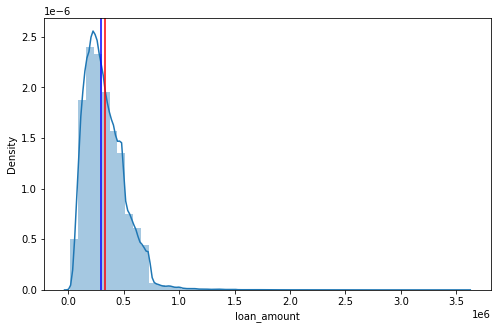

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(df1["loan_amount"]) 
plt.axvline(x=df1.loan_amount.mean(),
            color='red')
plt.axvline(x=df1.loan_amount.median(),color='blue')

mean of the loan amount 331117.7439967714
the min loan amount 16500
the max loan amount 3576500


<AxesSubplot:xlabel='loan_amount'>

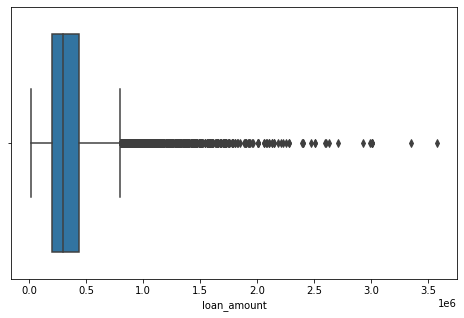

In [ ]:
print("mean of the loan amount", df1["loan_amount"].mean())
print("the min loan amount", df1["loan_amount"].min())
print("the max loan amount", df1["loan_amount"].max())
plt.figure(figsize=(8,5))
sns.boxplot(df1["loan_amount"])

In [ ]:
print("percentage of applicants for loan amount less than 3.3 Lakhs",df1[df1["loan_amount"]<df1["loan_amount"].mean()].shape[0]/df1.shape[0]*100)
print("percentage of applicants for loan amount more than 3.3 Lakhs ",df1[df1["loan_amount"]>df1["loan_amount"].mean()].shape[0]/df1.shape[0]*100)

percentage of applicants for loan amount less than 3.3 Lakhs 57.15813546781462
percentage of applicants for loan amount more than 3.3 Lakhs  42.841864532185376


**Interpretation**;

1) With this graph we can see that more number of applicants are applying for the loan from the range of 16500 upto 3576500        lakhs the average loan amount is less than 3.3Lakhs
   
2) from the above graph we can say that 57 percent of applicants are applying for the loan amount less than 3.3Lakhs

3) 15% of applicants are applying for the above 3.3 Lakhs

**property_value**

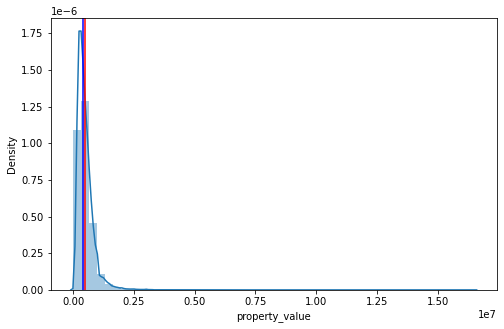

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(df1["property_value"])
plt.axvline(x=df1.property_value.mean(),
            color='red')
plt.axvline(x=df1.property_value.median(),color='blue')

mean of the property value 497893.46569640347
the min property_value 8000.0
the max property_value 16508000.0


<AxesSubplot:xlabel='property_value'>

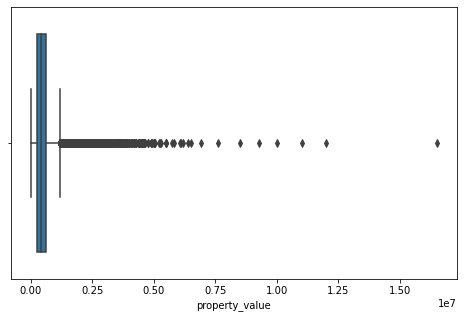

In [ ]:
print("mean of the property value", df1["property_value"].mean())
print("the min property_value", df1["property_value"].min())
print("the max property_value", df1["property_value"].max())
plt.figure(figsize=(8,5))
sns.boxplot(df1["property_value"])

In [ ]:
print("percentage of applicants whose property value less than 4.9 Lakhs",df1[df1["property_value"]<df1["property_value"].mean()].shape[0]/df1.shape[0]*100)
print("percentage of applicants whose property value more than 4.9 Lakhs ",df1[df1["property_value"]>df1["property_value"].mean()].shape[0]/df1.shape[0]*100)

percentage of applicants whose property value less than 4.9 Lakhs 54.05192708683661
percentage of applicants whose property value more than 4.9 Lakhs  35.79269523104863


**Interpretations**


1) For most of the applicants the property value is lies between 8000 to 1.6cr with average property value is 4.9 Lakhs

2) 54% of the aplicants are having less than 4.9 Lakhs property value and 34% of the applicants are having more
   than 4.9 Lakhs of property value

3) banks should consider the high propery applicants to approve the loan


**income**

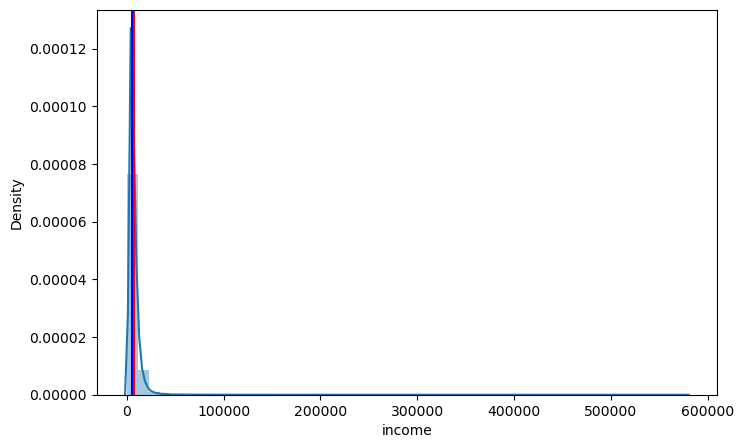

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(df1["income"])
plt.axvline(x=df1.income.mean(),
            color='red')
plt.axvline(x=df1.income.median(),color='blue')

mean of the income 6957.338876146789
the min income 0.0
the max income 578580.0


<AxesSubplot:xlabel='income'>

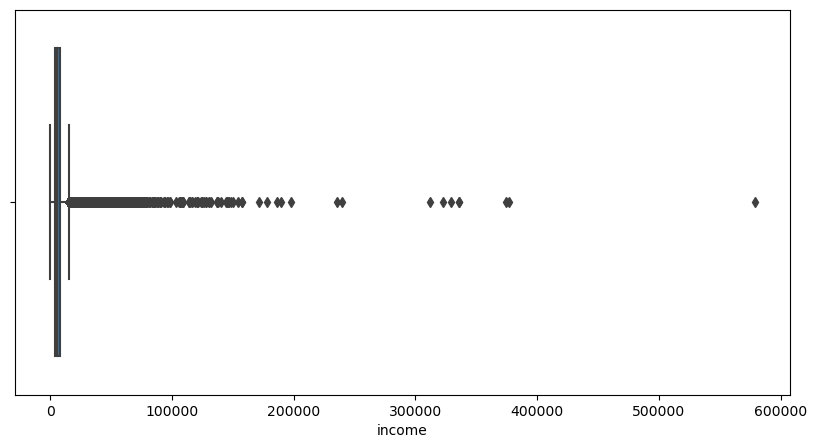

In [ ]:
print("mean of the income", df1["income"].mean())
print("the min income", df1["income"].min())
print("the max income", df1["income"].max())
plt.figure(figsize=(10,5))
sns.boxplot(df1["income"])

In [ ]:
print("percentage of income for  less than 6.9k",df1[df1["loan_amount"]<df1["loan_amount"].mean()].shape[0]/df1.shape[0]*100)
print("percentage of income for more than 6.9k ",df1[df1["loan_amount"]>df1["loan_amount"].mean()].shape[0]/df1.shape[0]*100)

percentage of income for  less than 6.9k 57.15813546781462
percentage of income for more than 6.9k  42.841864532185376


In [ ]:
df1[df1["income"]<6957]["loan_amount"].max()

1906500

In [ ]:
print("applicant who has income less than 6.9k and applying for the loan of 19Lakh for them loan is approved")
df1[(df1["income"]<6900) & (df1["loan_amount"]==1906500)]["Status"]

applicant who has income less than 6.9k and applying for the loan of 19Lakh for them loan is approved


101313    1
Name: Status, dtype: object

**Interpretations**

1) some of the loan applciants has the min income has 0. bank should be careful while consider such applicants for approving loan.

2) The min income of the applicants is 0 and max income is 578580. 

3) applicant who has income less than 6.9k and applying for the loan of 19Lakh for them loan is approved

4) 57% of the applicants are having less then 6.9k income and only 42% of the applciants are earning more than 6.9k
   





**Credit_Score**

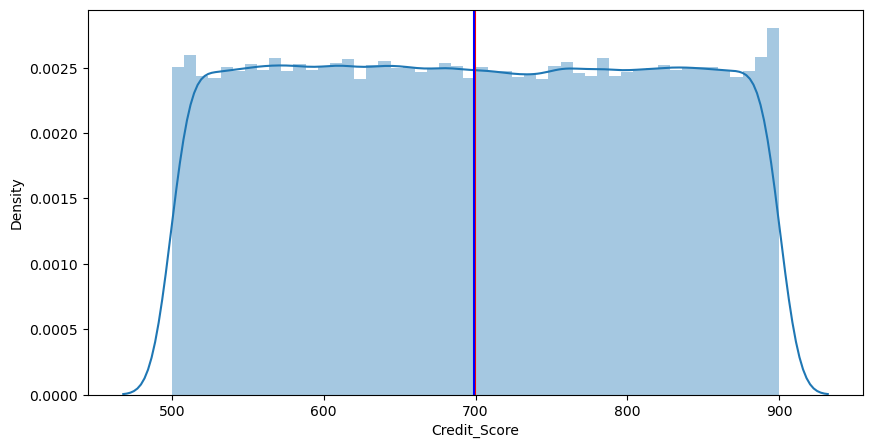

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df1["Credit_Score"])
plt.axvline(x=df1.Credit_Score.mean(),
            color='red')
plt.axvline(x=df1.Credit_Score.median(),color='blue')

mean of the credit score 699.7891033833322
the min Credit_score 500
the max credit_score 900


<AxesSubplot:xlabel='Credit_Score'>

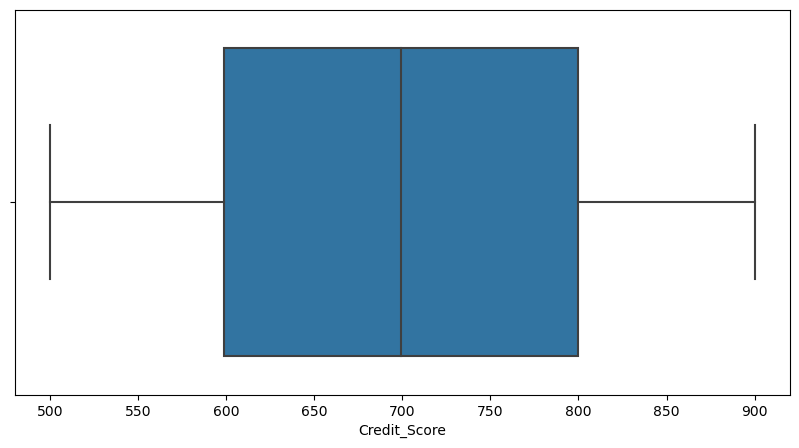

In [ ]:
print("mean of the credit score", df1["Credit_Score"].mean())
print("the min Credit_score", df1["Credit_Score"].min())
print("the max credit_score", df1["Credit_Score"].max())
plt.figure(figsize=(10,5))
sns.boxplot(df1["Credit_Score"])

In [ ]:
df1["Credit_Score"].quantile(0.75)

800.0

In [ ]:
print("applicants who are having credit score less than 699 ")
df1[df1["Credit_Score"]<699].shape[0]/df1.shape[0]*100

applicants who are having credit score less than 699 


49.78072240532723

In [ ]:
df1[df1["Credit_Score"]>800].shape[0]/df1.shape[0]*100

24.970740566355015

In [ ]:
df1[(df1["Credit_Score"]>699) & (df1["Credit_Score"]<800)].shape[0]/df1.shape[0]*100

24.760207170242822

**Interpretations**


2) the min credit score is 500 and highest credit score is 900 with average score of 700

3) banks shodul consider the applicants that have good credit score

4) Applicants who are having credit score more than 699 and less than 800 has 24%

5) Applicants who are having credit score more than 800 has 24.97%.

6) Applicants who are having credit score less than 600 has 49%.

**LTV**

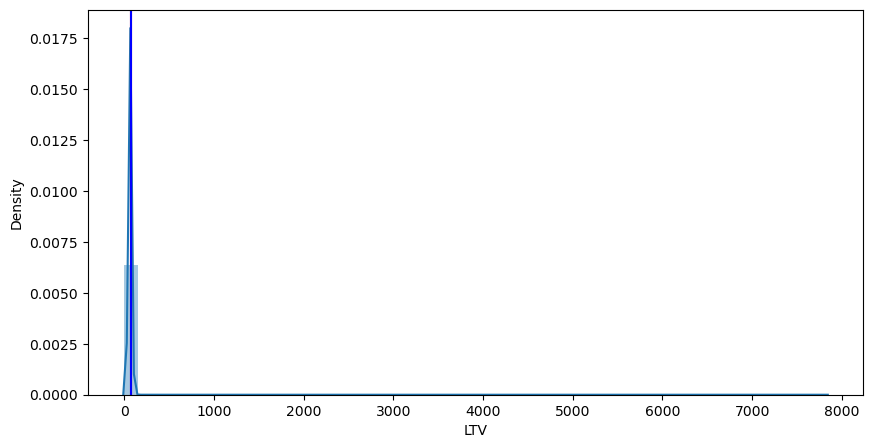

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df1["LTV"])
plt.axvline(x=df1.LTV.mean(),
            color='red')
plt.axvline(x=df1.LTV.median(),color='blue')

mean of the LTV 72.74645733386802
the min LTV 0.967478198
the max LTV 7831.25


<AxesSubplot:xlabel='LTV'>

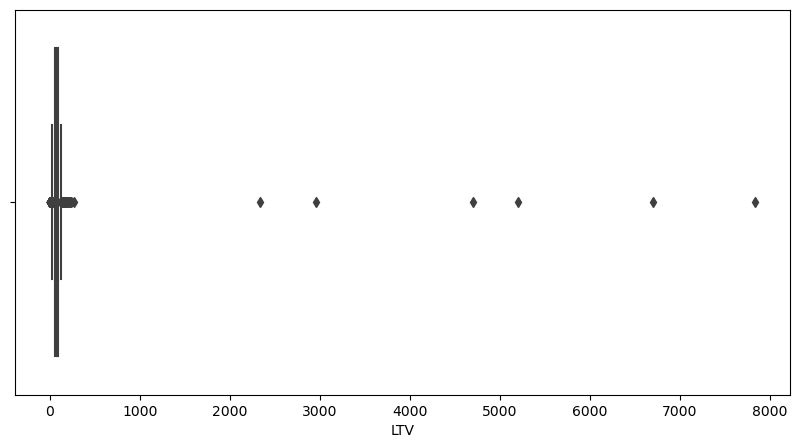

In [ ]:
print("mean of the LTV", df1["LTV"].mean())
print("the min LTV", df1["LTV"].min())
print("the max LTV", df1["LTV"].max())
plt.figure(figsize=(10,5))
sns.boxplot(df1["LTV"])

In [ ]:
df1[df1["LTV"]<72.74].shape[0]/df1.shape[0]*100

39.41279343512477

In [ ]:
df1[df1["LTV"]>72.74].shape[0]/df1.shape[0]*100

50.43182888276048

**Interpretations**

1) there are some loan applicants whose Life time values is less then 1 most of the applicnats are habing LTV of min 1 to max
   7831

2) some applicants who are having high LTV can be considered for approving loans.


3) Applicants who are having life time value has more than 72.74 has 50.43% of applicants.


4) Applicants who are having life time value has less than 72 has 39.4% of applicants.


**dtir1**

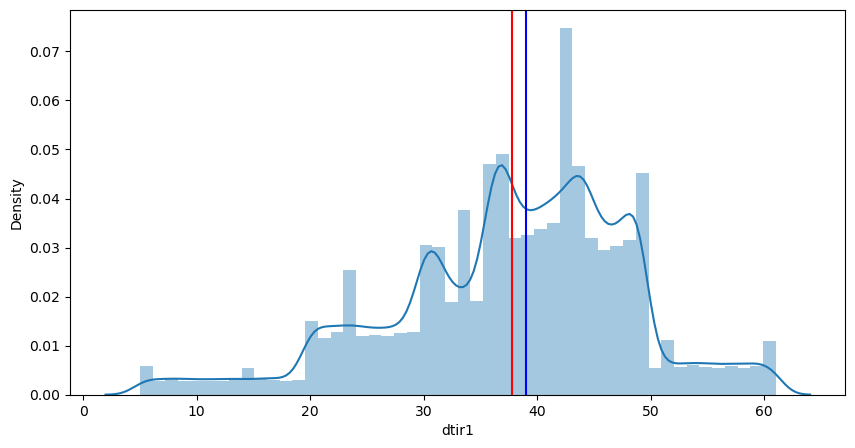

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df1["dtir1"])
plt.axvline(x=df1.dtir1.mean(),
            color='red')
plt.axvline(x=df1.dtir1.median(),color='blue')

mean od the dtir1 37.73293242017198
the min dtir1 5.0
the max dtir1 61.0


<AxesSubplot:xlabel='dtir1'>

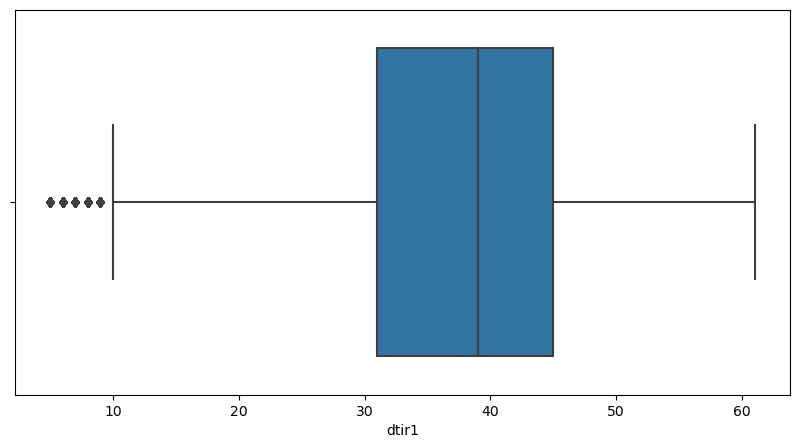

In [ ]:
print("mean od the dtir1", df1["dtir1"].mean())
print("the min dtir1", df1["dtir1"].min())
print("the max dtir1", df1["dtir1"].max())
plt.figure(figsize=(10,5))
sns.boxplot(df1["dtir1"])

In [ ]:
df1[df1["dtir1"]<37.3].shape[0]/df1.shape[0]*100

37.75543149256743

In [ ]:
df1[df1["dtir1"]>37.3].shape[0]/df1.shape[0]*100

46.02004439362346

**Interpretations**

1) there are applicants who are having very low DTIR banks should consider such applicants to approve loans

2) appliants thar are having DTIR high should be check properly before approving. as higher the DTIR higher the risk

3) the min dtir for few applicants is 5 and max dtir1 is 61. so banks should consider whcih are are having low Dtir1


5) this column dtir1 is neagtively skewed we have to perform the appropriate transfomration techinque before building the model

6) Applicants who are having debt to ratio has less than 37.3 has 37.5% applicants.

7) Applicants who are having debt to ratio has more than 37.3 has 46% applicants.



# Univariant Analysis For Categorical Columns

In [ ]:
df1.select_dtypes(include="object").columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'occupancy_type', 'total_units', 'credit_type', 'age',
       'submission_of_application', 'Region', 'Status', 'term_period'],
      dtype='object')

In [ ]:
np.unique(df1["loan_limit"].value_counts().values)[1]

135348

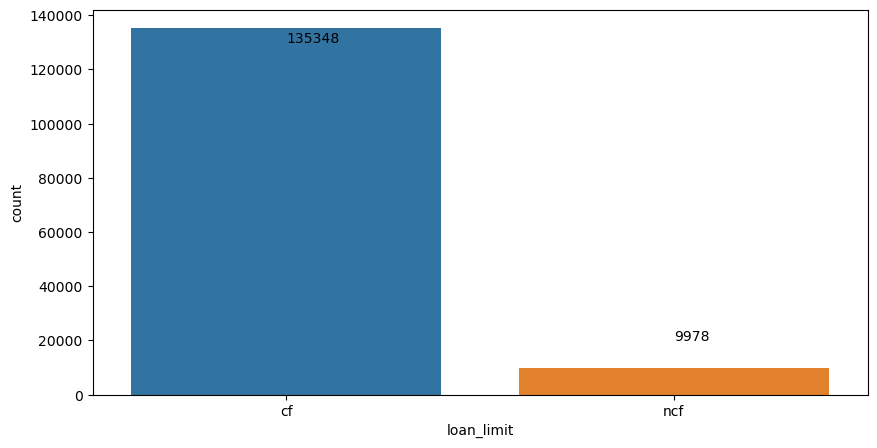

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["loan_limit"])
plt.text(x = 0, y =130000, s = np.unique(df1["loan_limit"].value_counts().values)[1])
plt.text(x = 1, y =20000, s = np.unique(df1["loan_limit"].value_counts().values)[0])
plt.show()

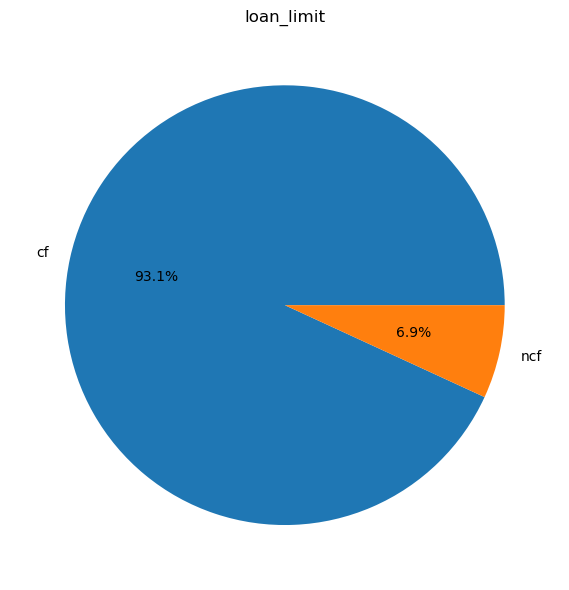

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["loan_limit"].value_counts(), labels=df1["loan_limit"].value_counts().index, autopct='%.1f%%')
ax.set_title('loan_limit')
plt.tight_layout()

**Interpretations**

1) Bank is getting more applicants for credit facitlity than non-credit facility

2) Bank is getting "CF" 93.1% applicants are from who has "Credit facility" 

3) And Remaining 6.9% applicants are from "Non-credit facility"


# gender

Text(3, 28000, '27266')

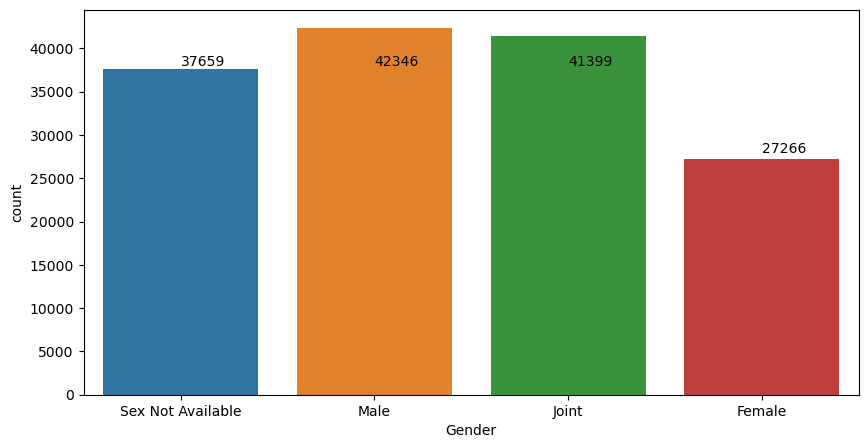

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["Gender"])
plt.text(x = 0, y =38000, s = np.unique(df1["Gender"].value_counts().values)[1])
plt.text(x = 1, y =38000, s = np.unique(df1["Gender"].value_counts().values)[3])
plt.text(x = 2, y =38000, s = np.unique(df1["Gender"].value_counts().values)[2])
plt.text(x = 3, y =28000, s = np.unique(df1["Gender"].value_counts().values)[0])

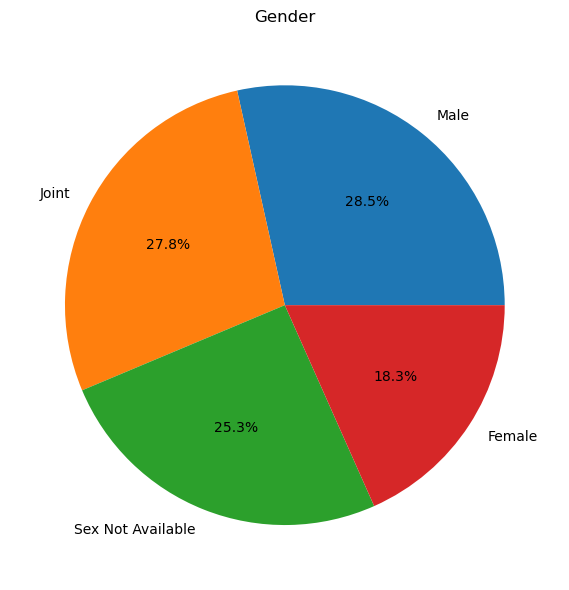

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["Gender"].value_counts(), labels=df1["Gender"].value_counts().index, autopct='%.1f%%')
ax.set_title('Gender')
plt.tight_layout()

**Interpretations**

1) Bank is getting 28.5% applicants from Male gender and 27.8% from Joint applicants (male and female)

2) Other 25.3% applicants is getting from Which not stated gender proprely.And 18.3% applicants are from Female gender.



# Approv_in_adv

Text(1, 25000, '23141')

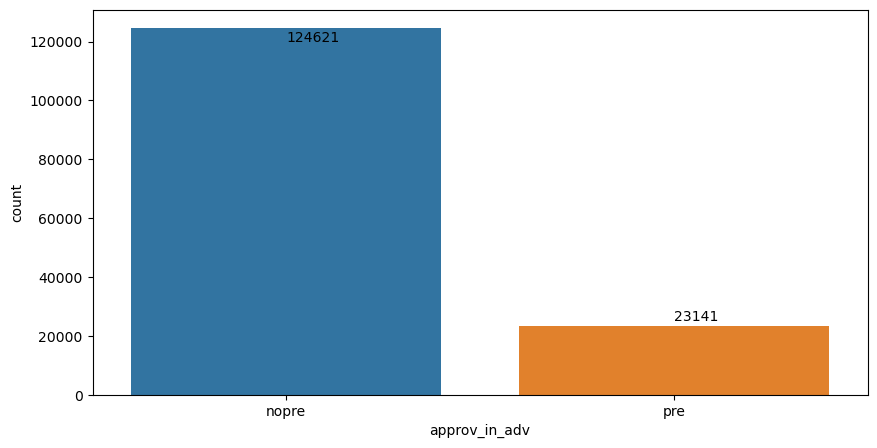

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["approv_in_adv"])
plt.text(x = 0, y =120000, s = np.unique(df1["approv_in_adv"].value_counts().values)[1])
plt.text(x = 1, y =25000, s = np.unique(df1["approv_in_adv"].value_counts().values)[0])

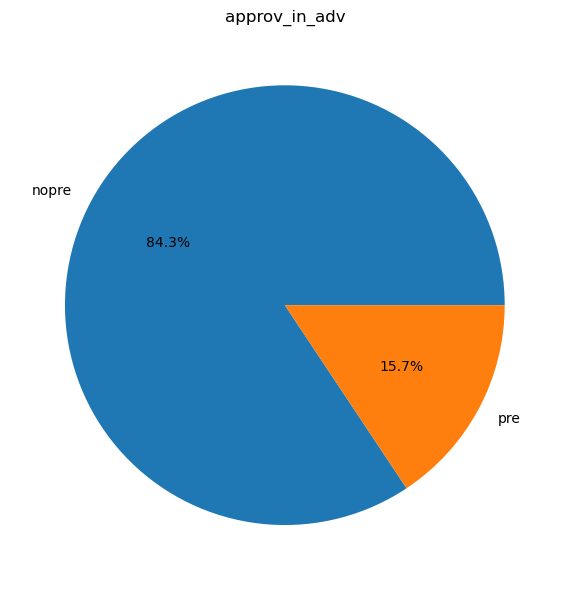

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["approv_in_adv"].value_counts(), labels=df1["approv_in_adv"].value_counts().index, autopct='%.1f%%')
ax.set_title('approv_in_adv')
plt.tight_layout()

**Interpretations**

1) There are applicants whose loan is Not Pre Approved 84.3% applicants got Pre approved.

2) When we compared to "Not Pre Aproved", Pre approve loan has 15.7% applicants which means very less applicants.


# Loan_type

Text(2, 25000, '14735')

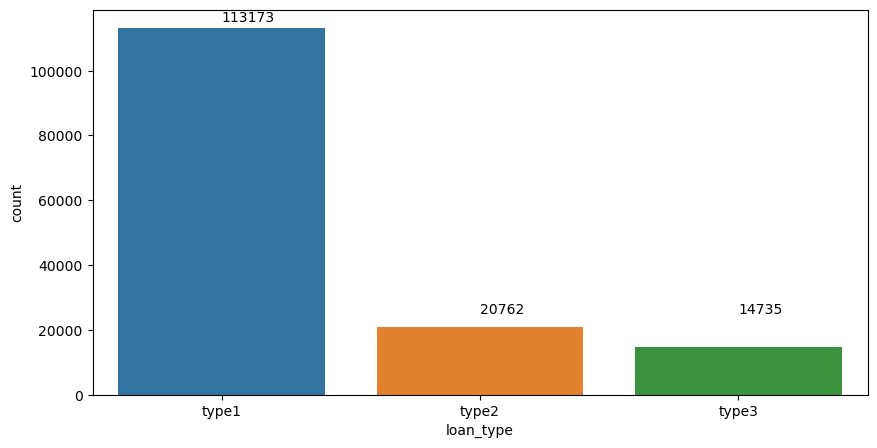

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["loan_type"])
plt.text(x = 0, y =115000, s = df1['loan_type'].value_counts()[0])
plt.text(x = 1, y =25000, s = df1['loan_type'].value_counts()[1])
plt.text(x = 2, y =25000, s = df1['loan_type'].value_counts()[2])


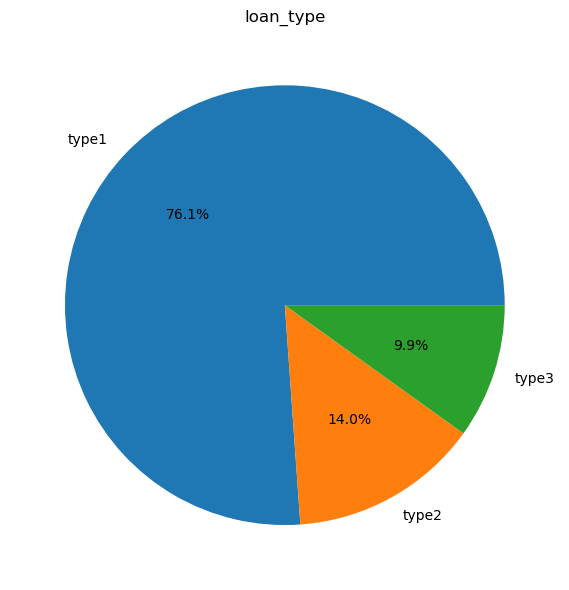

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["loan_type"].value_counts(), labels=df1["loan_type"].value_counts().index, autopct='%.1f%%')
ax.set_title('loan_type')
plt.tight_layout()

In [ ]:
df1.loan_type.value_counts()

type1    113173
type2     20762
type3     14735
Name: loan_type, dtype: int64

**Interpretations**

1) Bank is getting more applicants from the P3 has 37.7%

2) Loan_Purpose with P4 is having second highest 36.9% applicants and p1 has very less than compare to p3 and p4 which is 23.2% applicants.

3) And remaing 2.2% applicants from p2 loan type.

# Loan_purpose

Text(3, 5000, '3274')

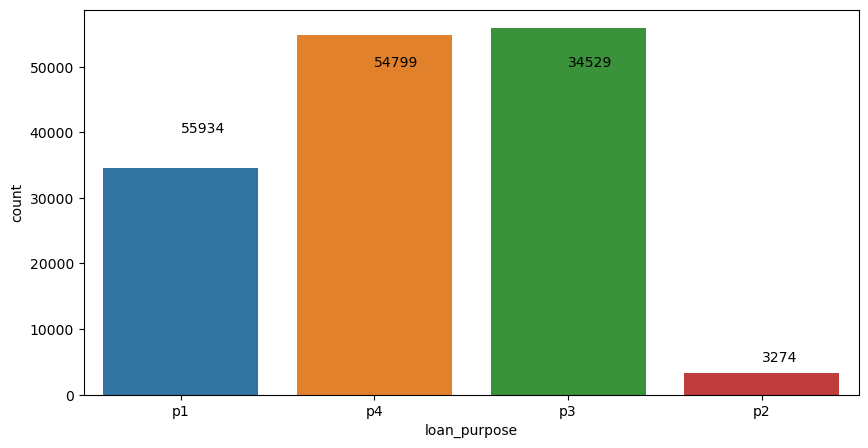

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["loan_purpose"])
plt.text(x = 0, y =40000, s = df1['loan_purpose'].value_counts()[0])
plt.text(x = 1, y =50000, s = df1['loan_purpose'].value_counts()[1])
plt.text(x = 2, y =50000, s = df1['loan_purpose'].value_counts()[2])
plt.text(x = 3, y =5000, s = df1['loan_purpose'].value_counts()[3])

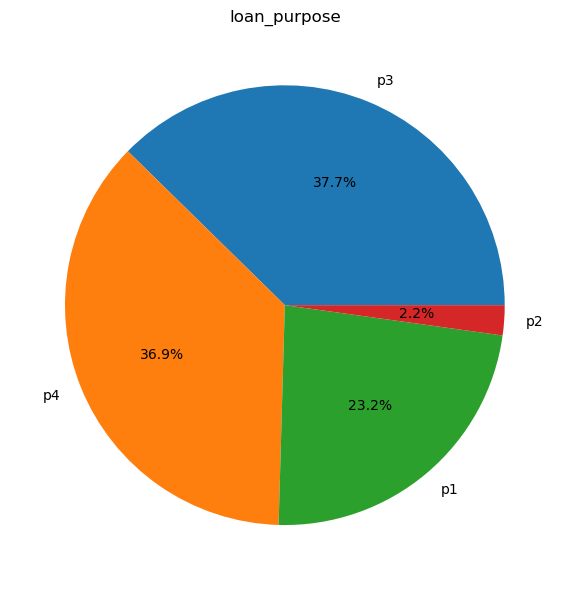

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["loan_purpose"].value_counts(), labels=df1["loan_purpose"].value_counts().index, autopct='%.1f%%')
ax.set_title('loan_purpose')
plt.tight_layout()

In [ ]:
df1.loan_purpose.value_counts()

p3    55934
p4    54799
p1    34529
p2     3274
Name: loan_purpose, dtype: int64

**Interpretations**

1) Bank is getting more applicants from the P3 has 37.7%

2) Loan_Purpose with P4 is having second highest 36.9% applicants and p1 has very less than compare to p3 and p4 which is 23.2% applicants.

3) And remaing 2.2% applicants from p2 loan purpose.

# Credit_worthiness

Text(1, 10000, '6326')

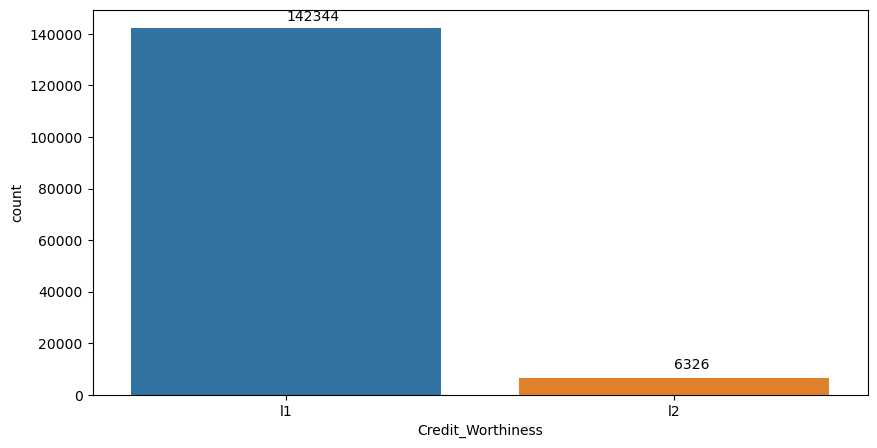

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["Credit_Worthiness"])
plt.text(x = 0, y =145000, s = df1['Credit_Worthiness'].value_counts()[0])
plt.text(x = 1, y =10000, s = df1['Credit_Worthiness'].value_counts()[1])

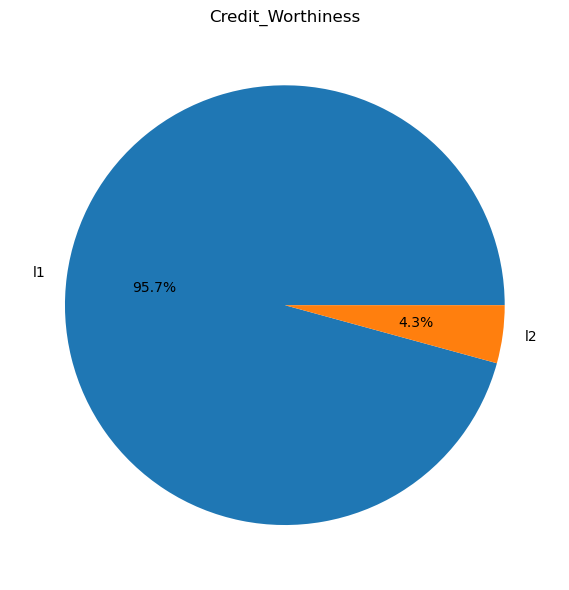

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["Credit_Worthiness"].value_counts(), labels=df1["Credit_Worthiness"].value_counts().index, autopct='%.1f%%')
ax.set_title('Credit_Worthiness')
plt.tight_layout()

**Interpretations**

1) Bank is getting more applicants from L1 credit worthiness has 95.7% and when compare with l2 has very less applicants 4.3% only 


# Open_credit

Text(1, 2000, '556')

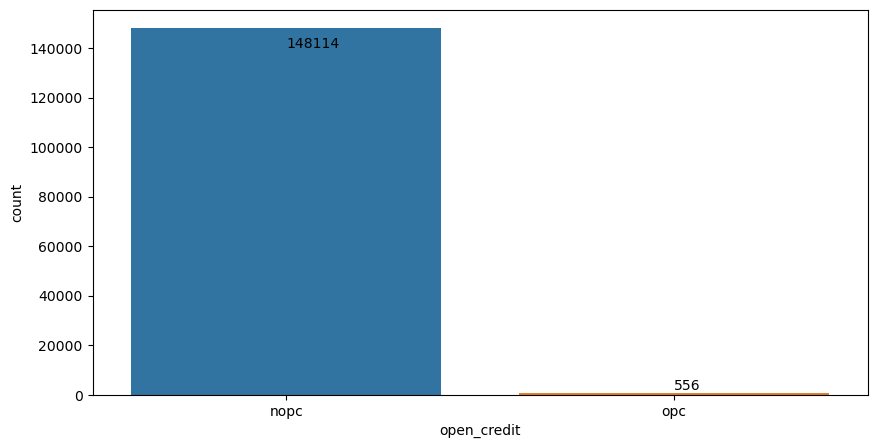

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["open_credit"])
plt.text(x = 0, y =140000, s = df1['open_credit'].value_counts()[0])
plt.text(x = 1, y =2000, s = df1['open_credit'].value_counts()[1])

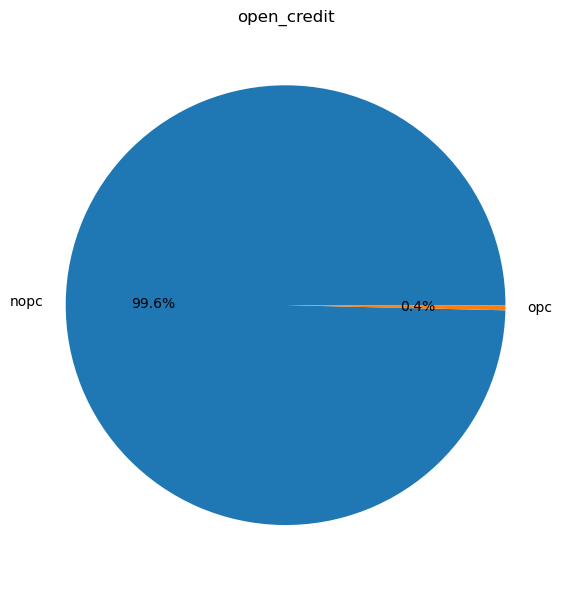

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["open_credit"].value_counts(), labels=df1["open_credit"].value_counts().index, autopct='%.1f%%')
ax.set_title('open_credit')
plt.tight_layout()

In [ ]:
df1.open_credit.value_counts()

nopc    148114
opc        556
Name: open_credit, dtype: int64

# **Interpretations**

1) No Open Credit are appliying for more loan has 99.6% 

2) Applicants who need Open Credit is very less has 0.4% only.

# buseiness_or_commercial

Text(1, 20000, '20762')

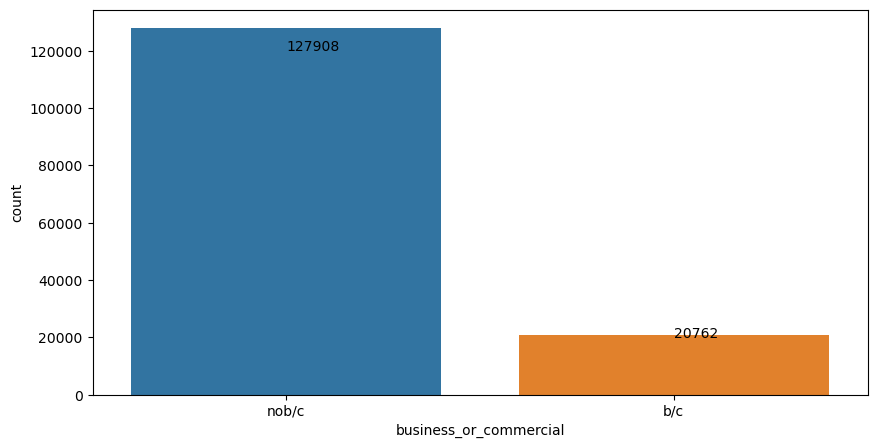

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["business_or_commercial"])
plt.text(x = 0, y =120000, s = df1['business_or_commercial'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['business_or_commercial'].value_counts()[1])


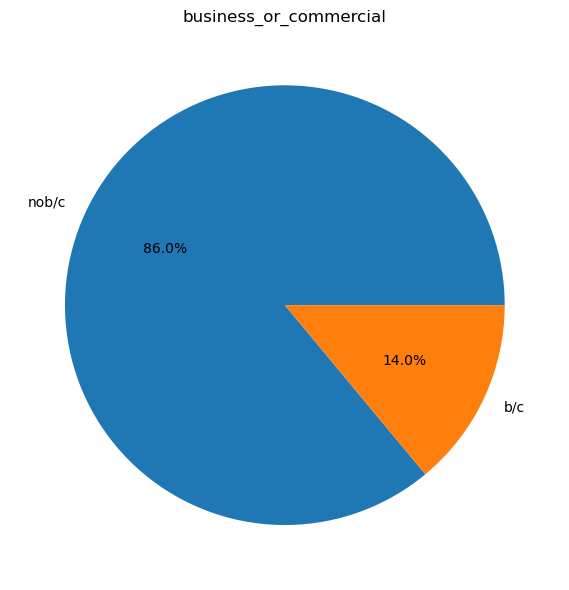

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["business_or_commercial"].value_counts(), labels=df1["business_or_commercial"].value_counts().index, autopct='%.1f%%')
ax.set_title('business_or_commercial')
plt.tight_layout()

**Interpretations**

1) Bank is getting more applicants from Non_Business_Comercial applicants has 86.0%.
2) And remaining 14.0% applicants from b/c.

# neg_ammortization

Text(1, 20000, '15129')

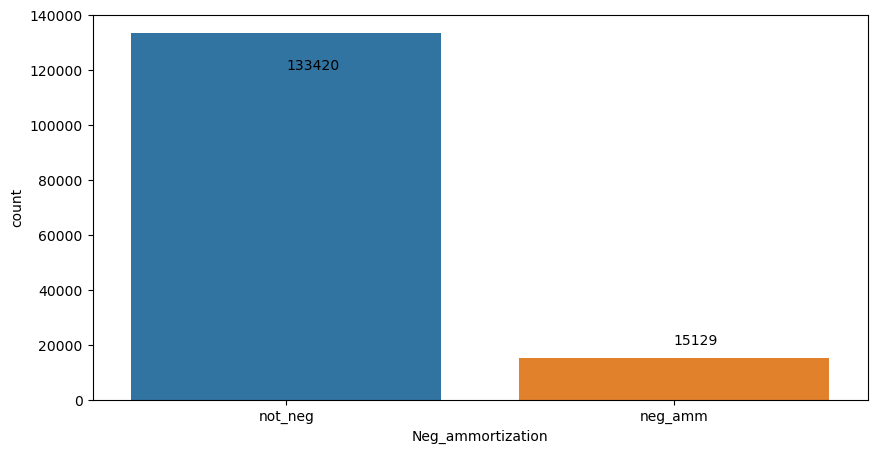

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["Neg_ammortization"])
plt.text(x = 0, y =120000, s = df1['Neg_ammortization'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['Neg_ammortization'].value_counts()[1])

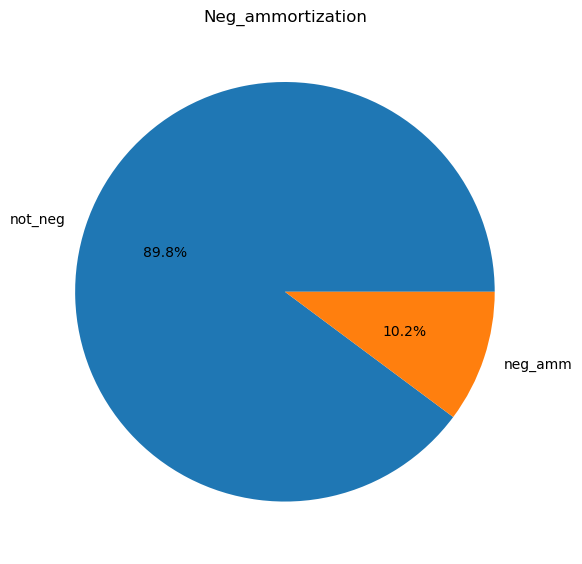

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["Neg_ammortization"].value_counts(), labels=df1["Neg_ammortization"].value_counts().index, autopct='%.1f%%')
ax.set_title('Neg_ammortization')
plt.tight_layout()

**Interpretations**

1) Bank is having more applicants from Not_Neg_Ammortization and less applicants from Neg_Ammortization

# interest_only

Text(1, 20000, '7110')

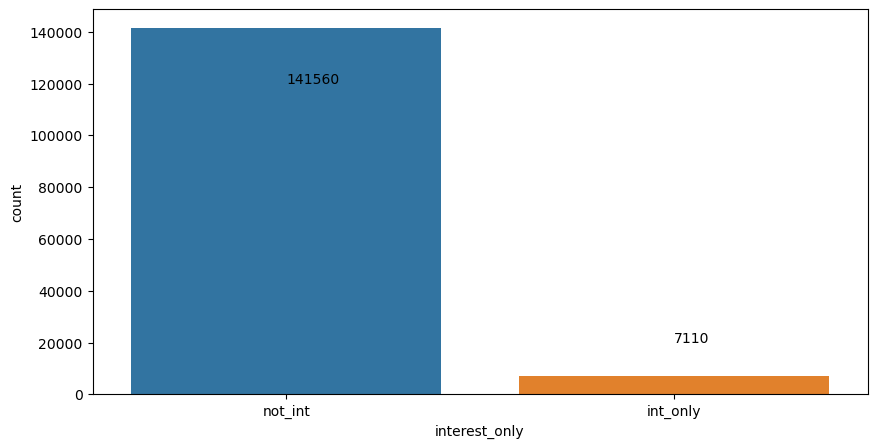

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["interest_only"])
plt.text(x = 0, y =120000, s = df1['interest_only'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['interest_only'].value_counts()[1])

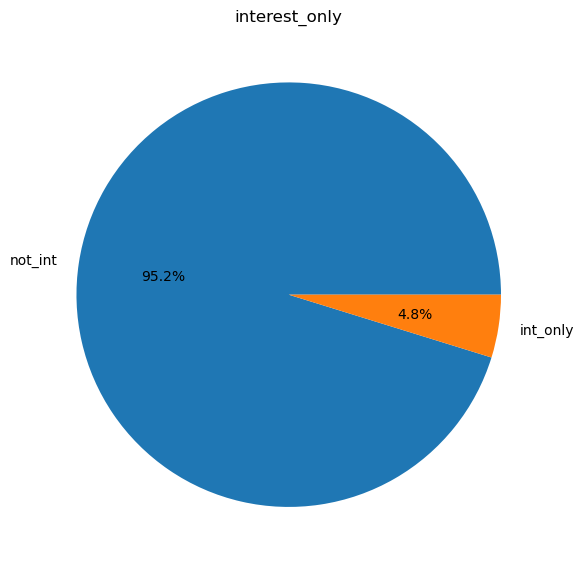

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["interest_only"].value_counts(), labels=df1["interest_only"].value_counts().index, autopct='%.1f%%')
ax.set_title('interest_only')
plt.tight_layout()

**Interpretations**

1) Bank has more applicants from the Not_int_Only has 95.2% and remaining 4.8% form int_only applicants.

# lump_sum_payment

Text(1, 20000, '3384')

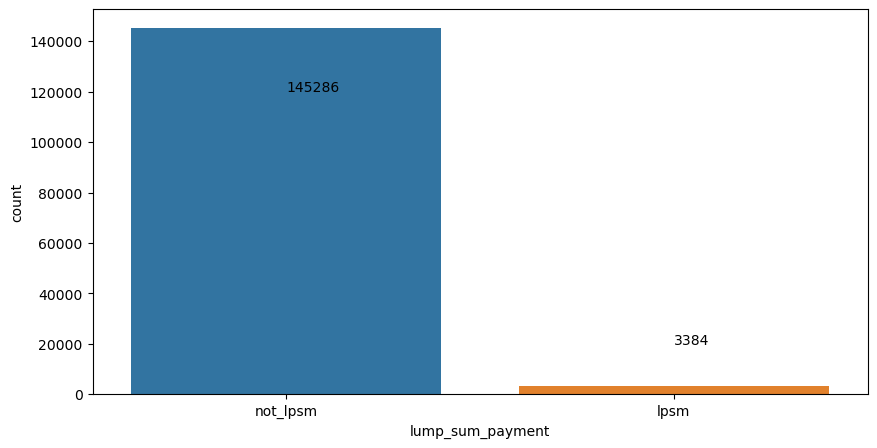

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["lump_sum_payment"])
plt.text(x = 0, y =120000, s = df1['lump_sum_payment'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['lump_sum_payment'].value_counts()[1])


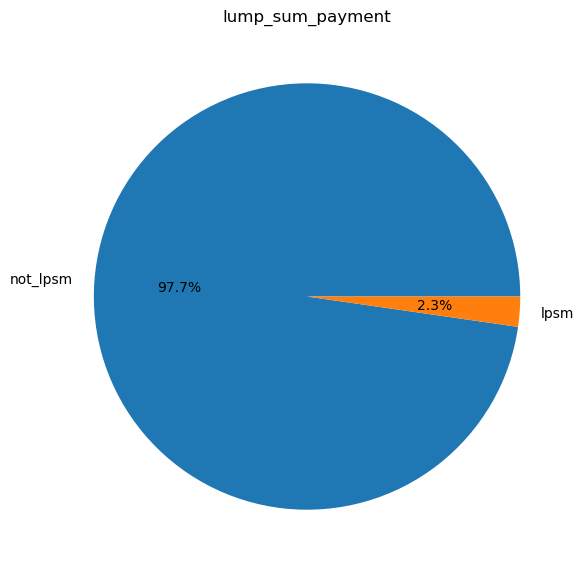

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["lump_sum_payment"].value_counts(), labels=df1["lump_sum_payment"].value_counts().index, autopct='%.1f%%')
ax.set_title('lump_sum_payment')
plt.tight_layout()

**Interpretations**

1) Bank is getting applicants for Not_Lump_Sum_Payment than Lump_sum

2) "Not_Lump_Sum_Payment" has 97.7% and remaining 2.3% from Lump_sum

# occupancy_type

Text(2, 20000, '3129')

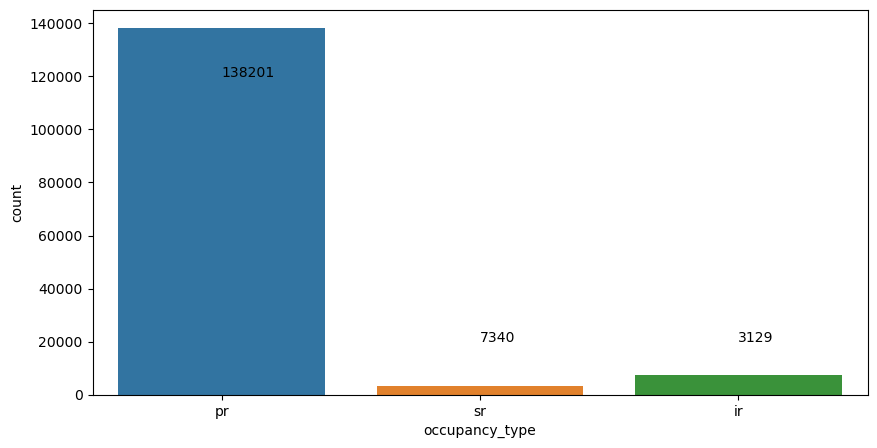

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["occupancy_type"])
plt.text(x = 0, y =120000, s = df1['occupancy_type'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['occupancy_type'].value_counts()[1])
plt.text(x = 2, y =20000, s = df1['occupancy_type'].value_counts()[2])

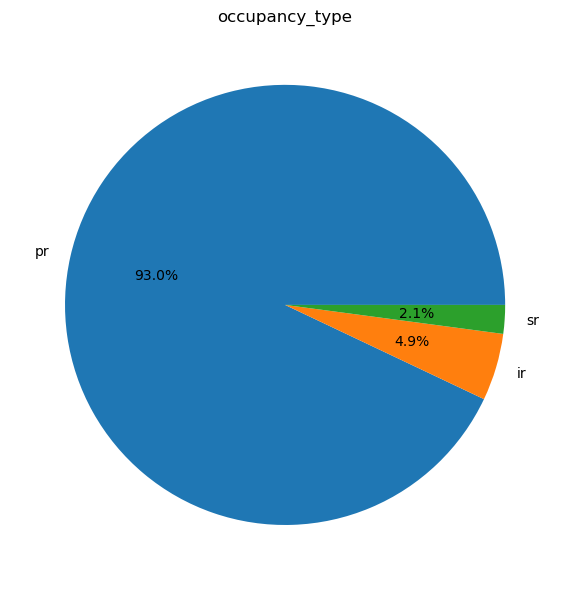

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["occupancy_type"].value_counts(), labels=df1["occupancy_type"].value_counts().index, autopct='%.1f%%')
ax.set_title('occupancy_type')
plt.tight_layout()

**Interpretations**

1) PR Occupancy is applying for loan bank has 93.0% of applicants

2) IR Occupancy is applying for loan bank has 4.9% of applicants

3) SR Occupancy is applying for loan bank has 2.1% of applicants

# total_units

Text(3, 20000, '320')

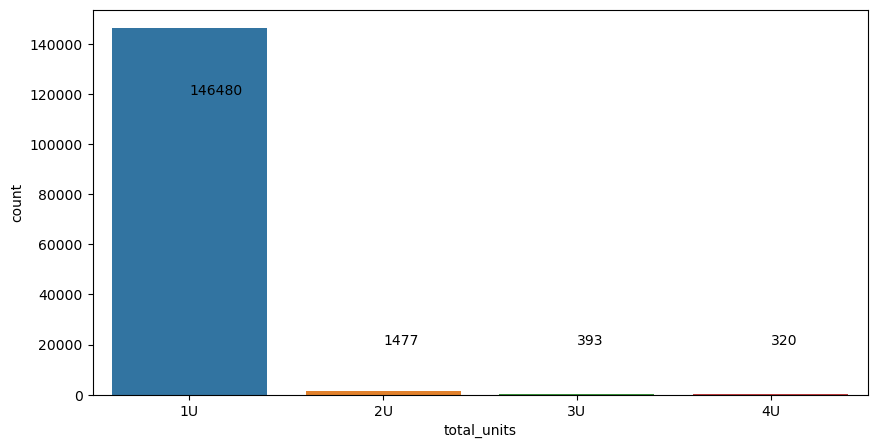

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["total_units"])
plt.text(x = 0, y =120000, s = df1['total_units'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['total_units'].value_counts()[1])
plt.text(x = 2, y =20000, s = df1['total_units'].value_counts()[2])
plt.text(x = 3, y =20000, s = df1['total_units'].value_counts()[3])

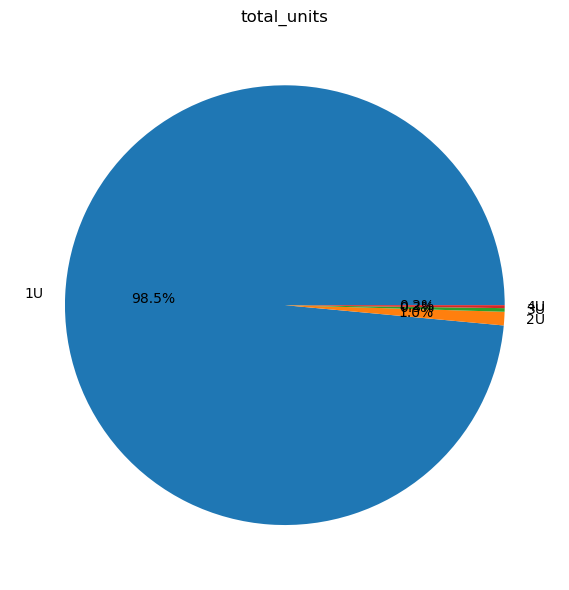

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.pie(df1["total_units"].value_counts(), labels=df1["total_units"].value_counts().index, autopct='%.1f%%')
ax.set_title('total_units')
plt.tight_layout()

**Interpretations**

1) More applicants are from 1U has 98.5% and 2U has 1.0% has very least applicants.

2) And remaining are from 3U and 4U are 0.2% and 0.1% has very minimal applicants.

# credit_type

Text(3, 45000, '15298')

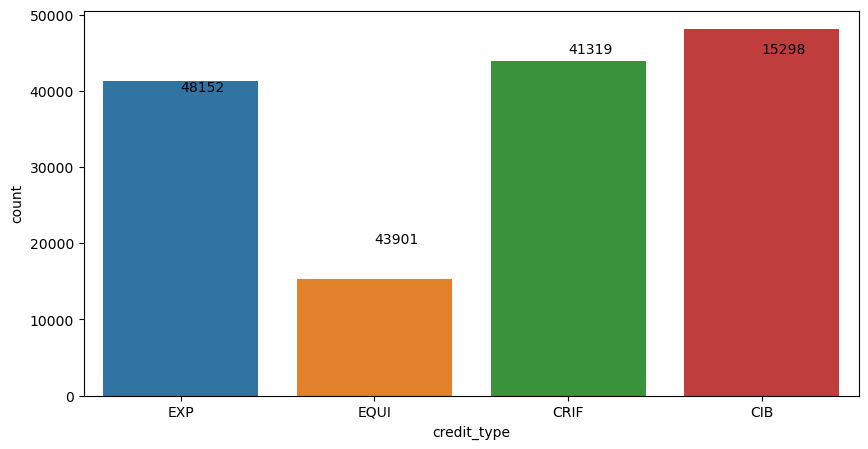

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["credit_type"])
plt.text(x = 0, y =40000, s = df1['credit_type'].value_counts()[0])
plt.text(x = 1, y =20000, s = df1['credit_type'].value_counts()[1])
plt.text(x = 2, y =45000, s = df1['credit_type'].value_counts()[2])
plt.text(x = 3, y =45000, s = df1['credit_type'].value_counts()[3])


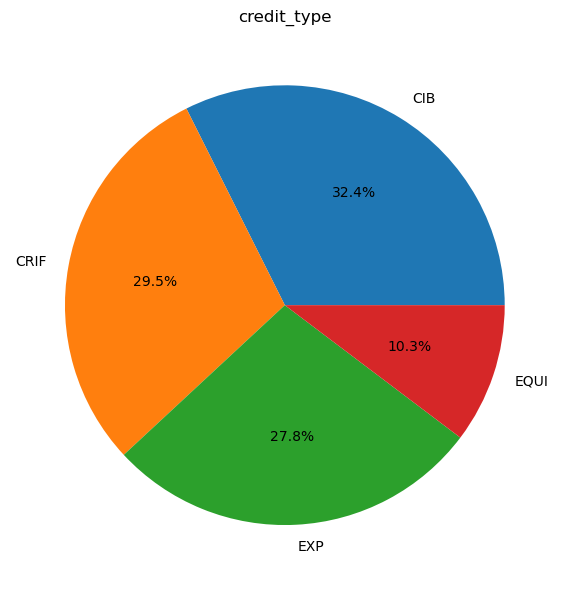

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(df1["credit_type"].value_counts(), labels=df1["credit_type"].value_counts().index, autopct='%.1f%%')
ax.set_title('credit_type')
plt.tight_layout()

**Interpretations**

1) Bank is getting 29.5% of  applicants from "CRIF" credit_type and 32.4% of applicants form  "CIB" credit_typ. And 27.8% from      "EXP" credit_type.

2) Credit_type "EQUI" has 10.3% very less applicants occured.

# age

Text(6, 5000, '1337')

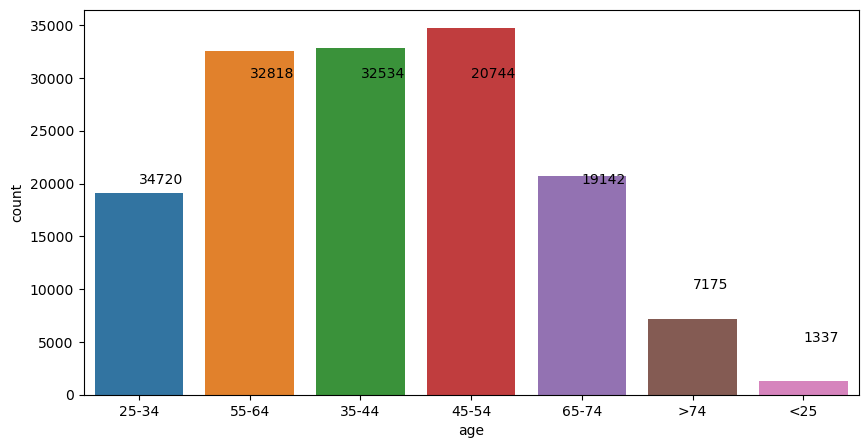

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["age"])
plt.text(x = 0, y =20000, s = df1['age'].value_counts()[0])
plt.text(x = 1, y =30000, s = df1['age'].value_counts()[1])
plt.text(x = 2, y =30000, s = df1['age'].value_counts()[2])
plt.text(x = 3, y =30000, s = df1['age'].value_counts()[3])
plt.text(x = 4, y =20000, s = df1['age'].value_counts()[4])
plt.text(x = 5, y =10000, s = df1['age'].value_counts()[5])
plt.text(x = 6, y =5000, s = df1['age'].value_counts()[6])

In [ ]:
print("applicants less then age 25 loan status in percentage")
df1[df1["age"]== "<25"]["Status"].value_counts(normalize=True)*100

applicants less then age 25 loan status in percentage


0    71.0546
1    28.9454
Name: Status, dtype: float64

In [ ]:
print("applicants less then age 25 loan status in percentage")
df1[df1["age"]== ">74"]["Status"].value_counts(normalize=True)*100

applicants less then age 25 loan status in percentage


0    69.993031
1    30.006969
Name: Status, dtype: float64

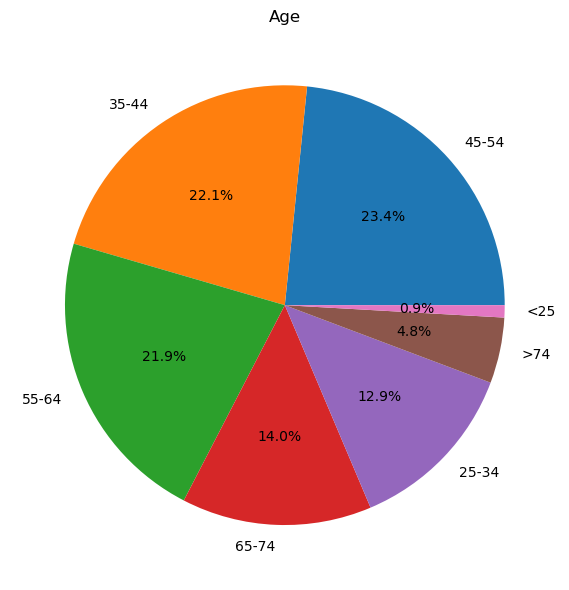

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(df1["age"].value_counts(), labels=df1["age"].value_counts().index, autopct='%.1f%%')
ax.set_title('Age')
plt.tight_layout()

In [ ]:
df1.groupby('age')['Status'].value_counts().to_frame()

Status
age   Status        
25-34 0        14894
      1         4248
35-44 0        25509
      1         7309
45-54 0        26371
      1         8349
55-64 0        24112
      1         8422
65-74 0        15173
      1         5571
<25   0          950
      1          387
>74   0         5022
      1         2153

**Interpretations**

1) Bank is getting 23.4% of applicants from the age group of above 45 to 54 and from that bank approved loan of '8349'   applicants and declined '26371' applicants.

2) And 22.1% of applicants from the age group of above 35 to 44 and from that bank approved loan of '7309' applicants and declined '25509' applicants.

3) For age group of 55-64 getting 21.9% of applicants and from that bank approved loan of '8422' applicants and declined '24112'        applicants.

4) For age group of 65-74 getting 14.0% of applicants and from that bank approved loan of '5571' applicants and declined '15173'        applicants.

5) For age group of 25-34 getting 12.9% of applicants and from that bank approved loan of '4248' applicants and declined '14894'        applicants.

6) For age group above > 74 getting 4.8% of applicants and from that bank approved loan of '2153' applicants and declined '5022'       applicants.

7) For age group above < 25 getting 0.9% of applicants and from that bank approved loan of '387' applicants and declined '950'       applicants

**submission_of_application**

Text(1, 90000, '52656')

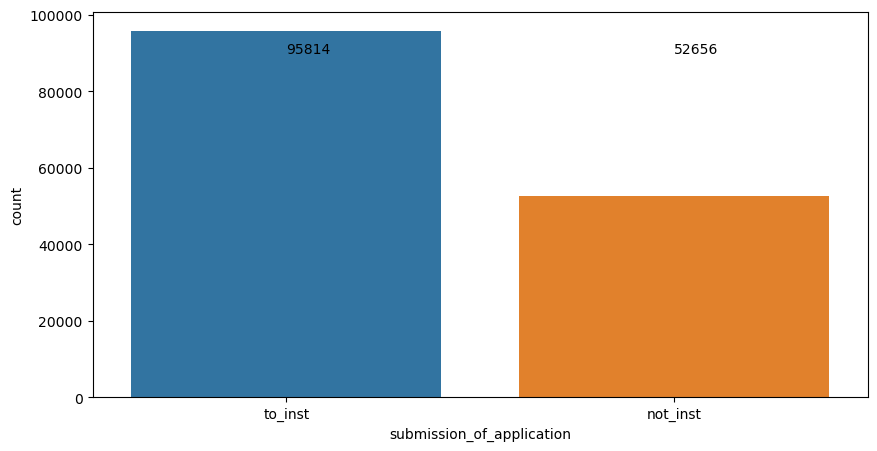

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["submission_of_application"])
plt.text(x = 0, y =90000, s = df1['submission_of_application'].value_counts()[0])
plt.text(x = 1, y =90000, s = df1['submission_of_application'].value_counts()[1])

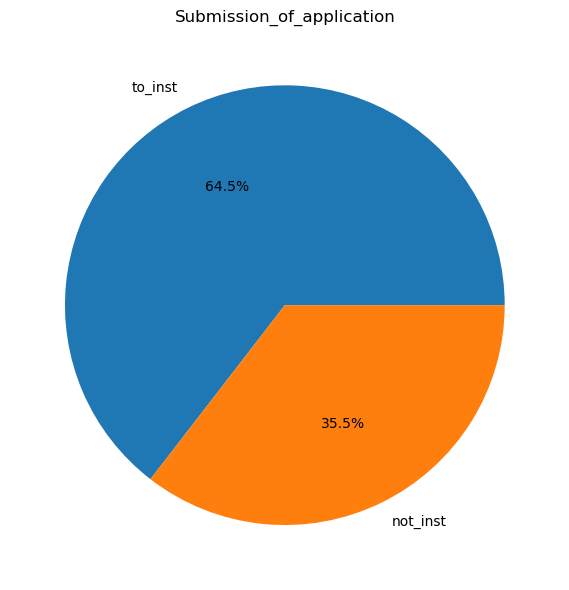

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(df1["submission_of_application"].value_counts(), labels=df1["submission_of_application"].value_counts().index, autopct='%.1f%%')
ax.set_title('Submission_of_application')
plt.tight_layout()

**Interpretations**

1) There are 64.5% of applicants are instantly_submitting_applications.

2) Close to 50000 applicants are not_instantly_submitting applications.



**Region**

Text(3, 20000, '1235')

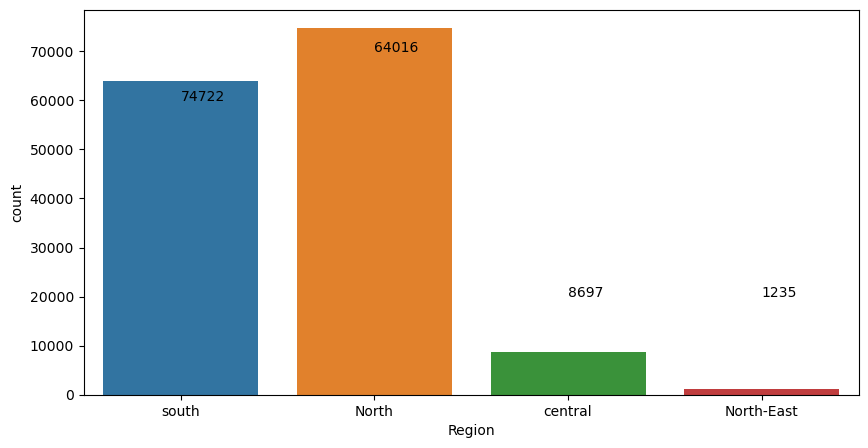

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["Region"])
plt.text(x = 0, y =60000, s = df1['Region'].value_counts()[0])
plt.text(x = 1, y =70000, s = df1['Region'].value_counts()[1])
plt.text(x = 2, y =20000, s = df1['Region'].value_counts()[2])
plt.text(x = 3, y =20000, s = df1['Region'].value_counts()[3])


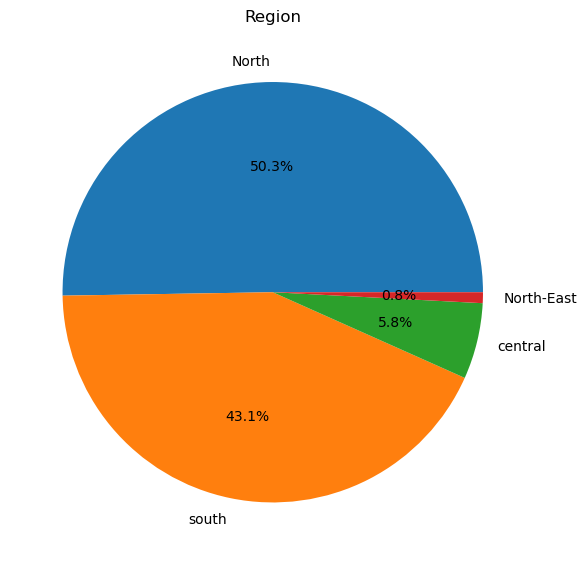

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(df1["Region"].value_counts(), labels=df1["Region"].value_counts().index, autopct='%.1f%%')
ax.set_title('Region')
plt.tight_layout()

**Interpretations**

1) Bank is getting 50.3% applicants from the North Region.

2) In South Region is getting 43.1% applicants.

3) Which means major part of applicants are from North and South Regions.

3) For North-East 0.8 % applicants and Cenrral region got 5.8% applicants only, very less applicants.

# status

Text(1, 40000, '36639')

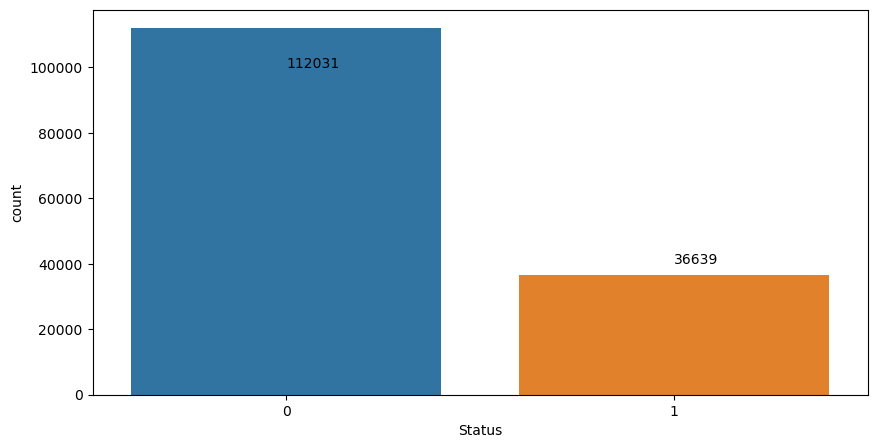

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df1["Status"])
plt.text(x = 0, y =100000, s = df1['Status'].value_counts()[0])
plt.text(x = 1, y =40000, s = df1['Status'].value_counts()[1])

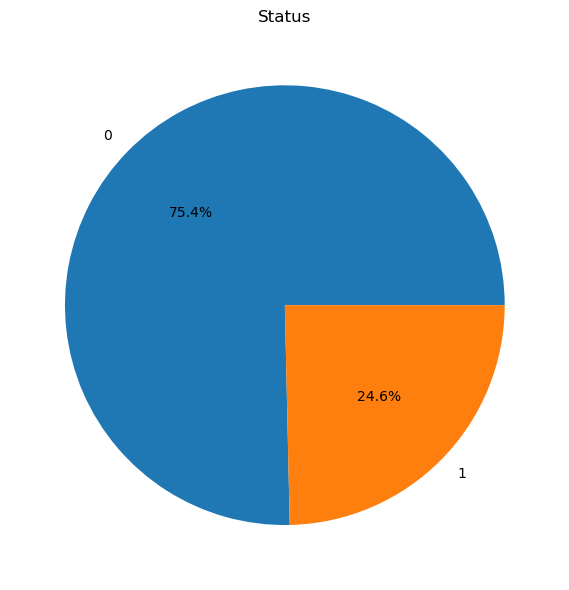

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(df1["Status"].value_counts(), labels=df1["Status"].value_counts().index, autopct='%.1f%%')
ax.set_title('Status')
plt.tight_layout()

**Interpretations**

1) We can see that 75.4% loan not got approved, which means it got decline according bank terms and conditions.


2) For approved loan status has 24.6%

# Bivariant Analysis 

In [ ]:
df1_num = df1.select_dtypes(include=np.number)

In [ ]:
df1_num.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1'],
      dtype='object')

In [ ]:
df1_num = ['property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1']

**loan_amount**

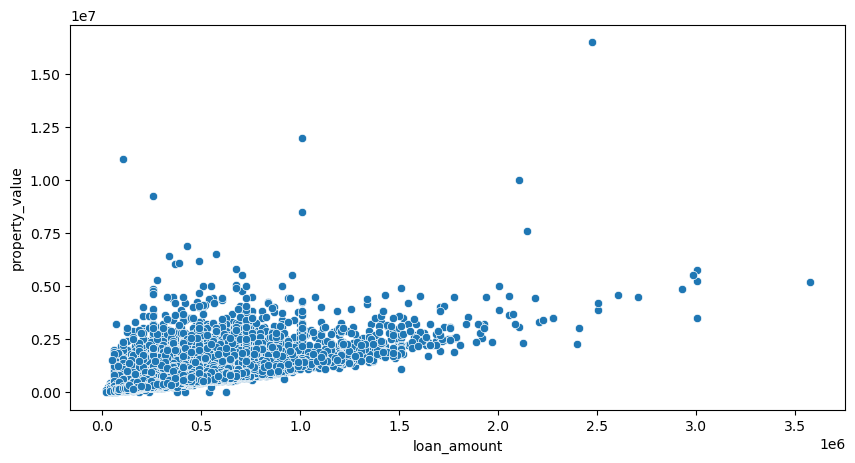

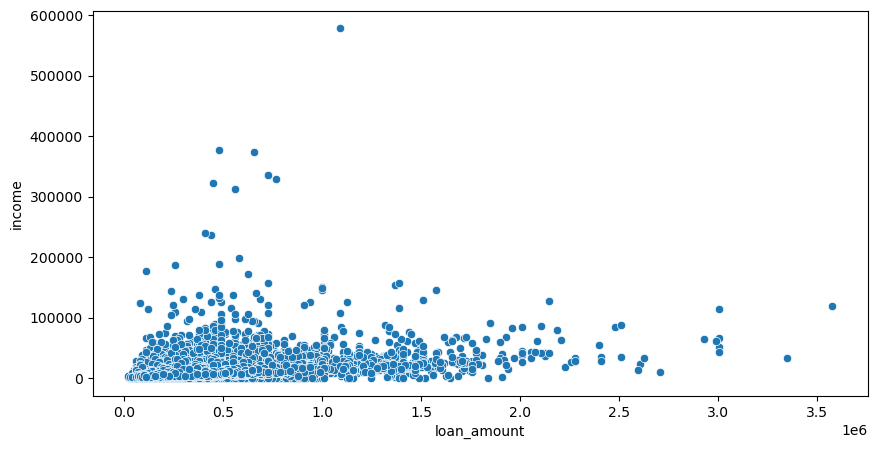

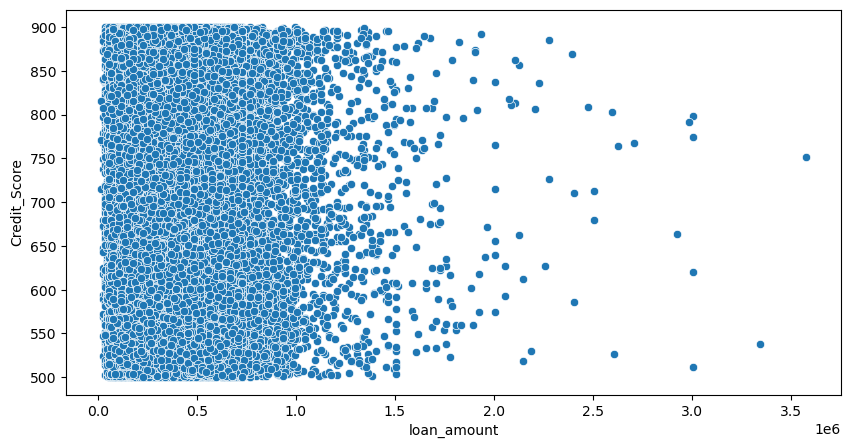

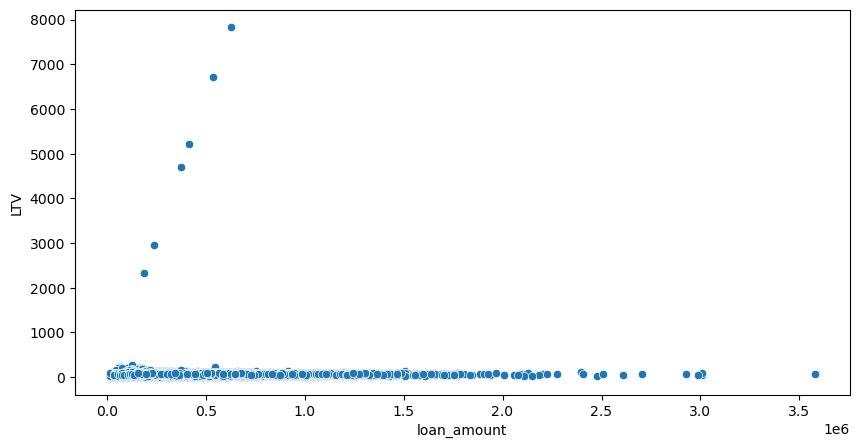

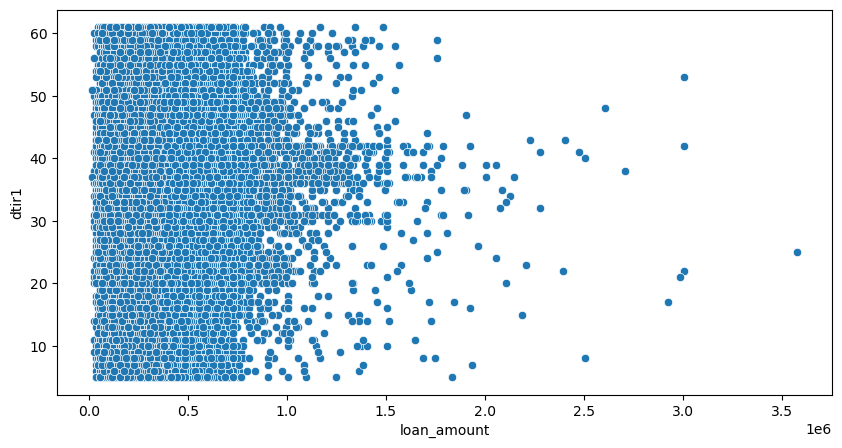

In [ ]:
for i in df1_num:
    plt.figure(figsize=(10,5))
    sns.scatterplot(x=df1["loan_amount"], y=df1[i])
    plt.show()

**Interpretations**


1) Where there is loan_amount less term is also less as loan_amount is increasing term is also increasing.

2) the minimum term is less then 100 and the maximum term period is above 350

3) The property value and loan amount are corelated to each other. as proeprty value is increasing loan amount also increasing

4) Loan amount and income both are each other corelated to each other. as income increase loan amount is also increasing

5) Loan is getting approved for applicants who are having low credit score. and for some applicants loan ampunt is also high
   even when they having less credit score.
    
6) From LTV and loan amount we can say that for few applicants loan not approved where LTV is more then 1000.

7) where there is high Debt to income ratio laon is getting approved for them in huge quantity. 



In [ ]:
df1_num = ['loan_amount', 'property_value', 'income', 'LTV',
       'dtir1']

**Credit_Score**

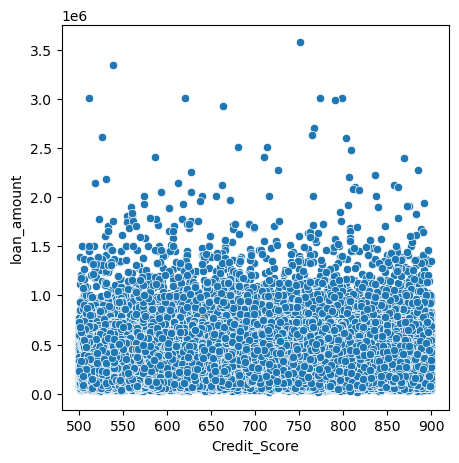

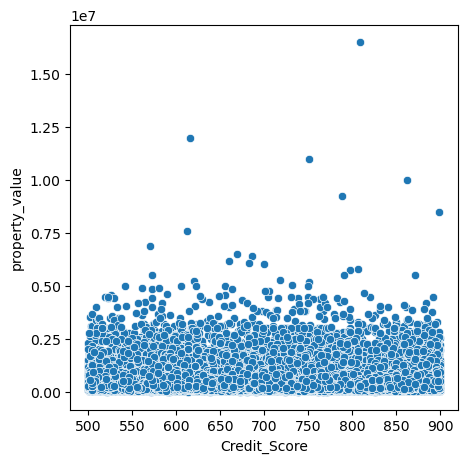

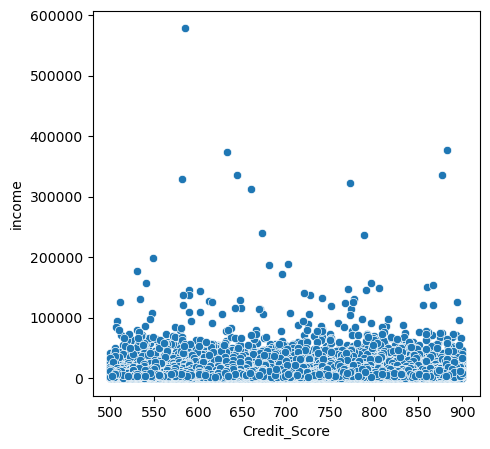

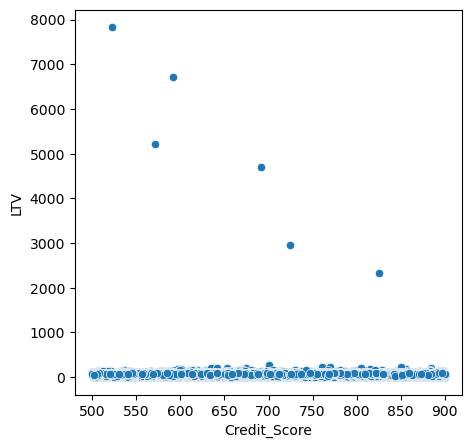

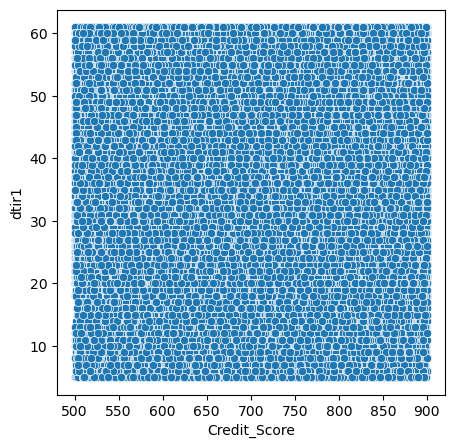

In [ ]:
for i in df1_num:
    plt.figure(figsize=(5,5))
    sns.scatterplot(x=df1["Credit_Score"], y=df1[i])
    plt.show()

interpretations;

1) bank is giving loan for applicants who are having low income and low credit score.


In [ ]:
df1_num = ['loan_amount', 'property_value', 'income', 'Credit_Score', 
       'dtir1']

**LTV**

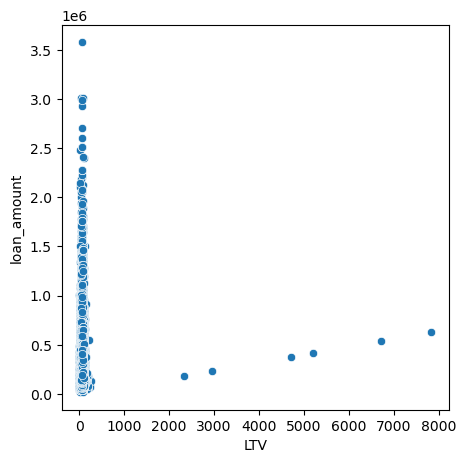

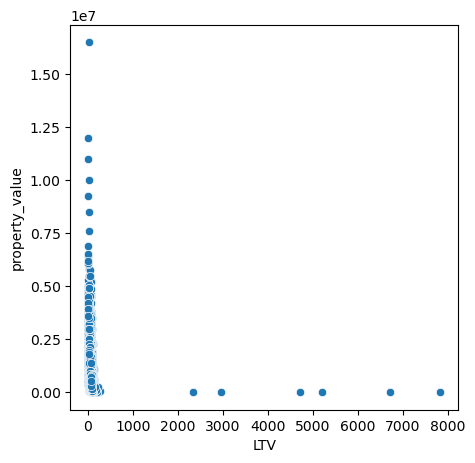

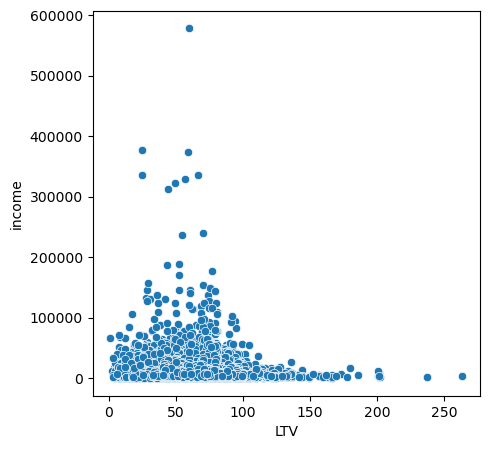

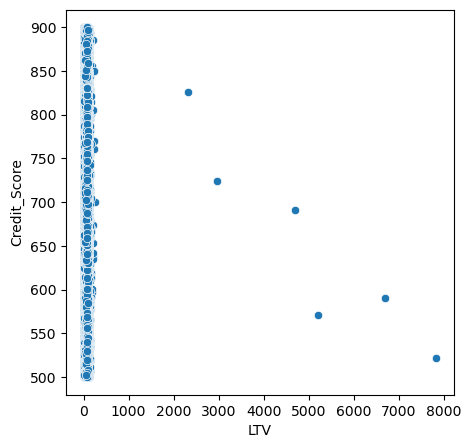

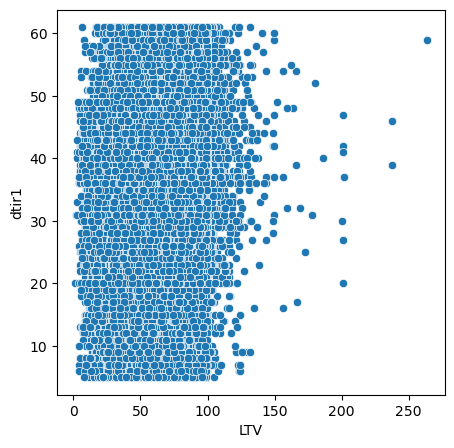

In [ ]:
for i in df1_num:
    plt.figure(figsize=(5,5))
    sns.scatterplot(x=df1["LTV"], y=df1[i])
    plt.show()

**Interpretations**


1) loan amount is getting approved where LTV is more than 100.

2) where loan amount is in range of 2 to 5 lacs with LTV is above 100 loan is getting approved for them.

3) where property value is high and and LTV is also above 100 those applicants are approved for loan

4) income and LTV says that where LTV is low few applicants got approved of loan. banks should look into it.

5) where credit score is high LTV is above 100 they are aproved for loan


6) where there is high debt to income ratio with low LTV value bank approved loan for few applicants** 

**dtir1**

In [ ]:
df1_num = ['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV']

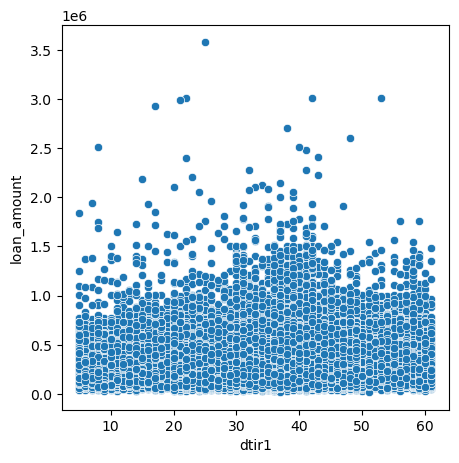

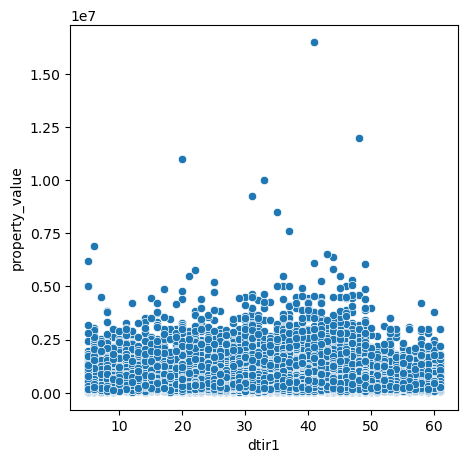

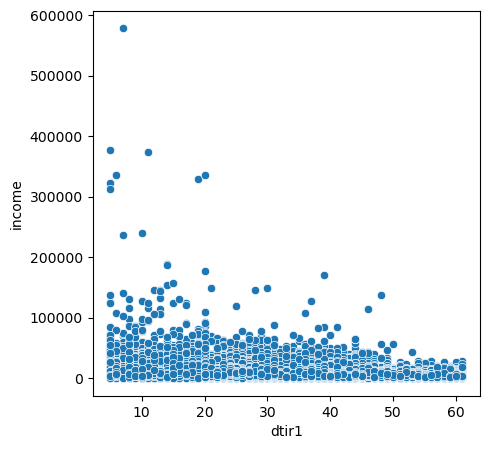

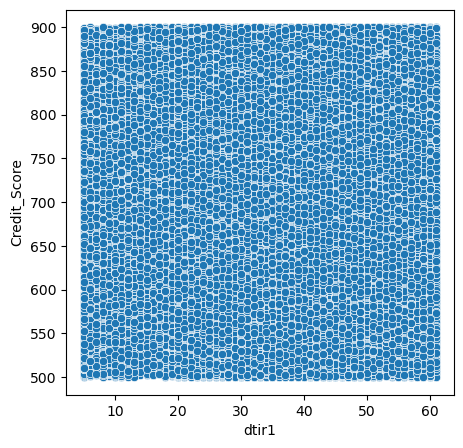

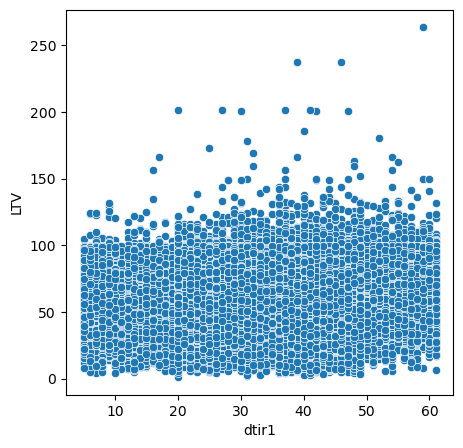

In [ ]:
for i in df1_num:
    plt.figure(figsize=(5,5))
    sns.scatterplot(x=df1["dtir1"], y=df1[i])
    plt.show()

**Interpretations**

1) where there is high loan amount with high Debt to income ration the bank is aproved loan for them**. 

2) high Debt to income ratio applicants are got approved loan with high term period.**

3) where average propety value is 4.9Lac with high Debt to income ration bank is aproved loan for them.

4) low income with high Debt to income ratio bank aproved loan for them.

5) where LTV is high with high Debt to income ratio also they aproved loan.

# Bivariant for categorical columns

In [ ]:
df1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,income,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,not_neg,...,1740.0,EXP,758,25-34,to_inst,98.728814,south,1,45.0,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,not_neg,...,4980.0,EQUI,552,55-64,to_inst,NaN,North,1,NaN,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,neg_amm,...,9480.0,EXP,834,35-44,to_inst,80.019685,south,0,46.0,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,not_neg,...,11880.0,EXP,587,45-54,not_inst,69.376900,North,0,42.0,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,not_neg,...,10440.0,CRIF,602,25-34,not_inst,91.886544,North,0,39.0,>=30 years


In [ ]:
df1_cat = df1.select_dtypes(include="object")
df1_cat.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'occupancy_type', 'total_units', 'credit_type', 'age',
       'submission_of_application', 'Region', 'Status', 'term_period'],
      dtype='object')

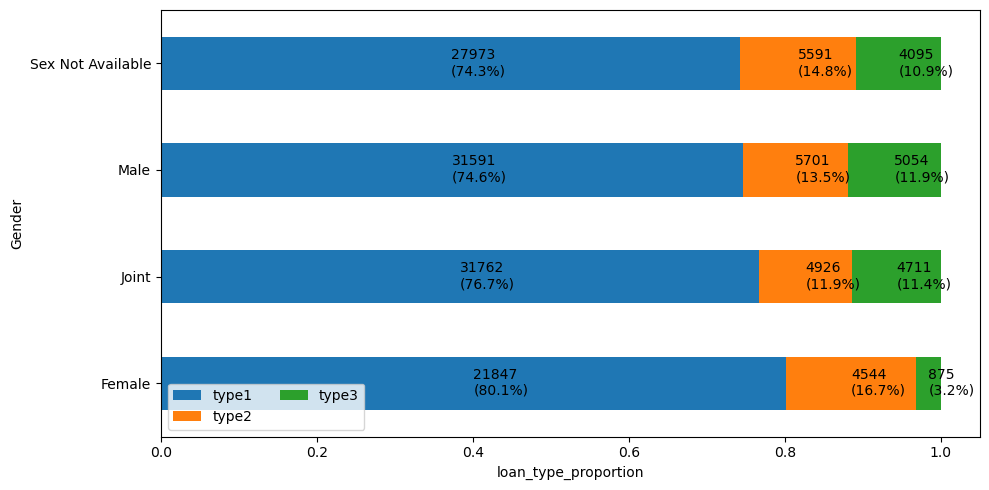

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["Gender"], df1_cat["loan_type"],normalize="index")
cross_tab = pd.crosstab(df1_cat["Gender"], df1_cat["loan_type"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Gender")
plt.xlabel("loan_type_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

**Interpretation**


1.  For "Sex_Not_Available(Ungendered)" has 37,659 applicants in that 74.3% (36722) has "Type1" loan, "Type2" has 14.8% (5591) and "type3" has 2.5% (937).


2.  For "Male_Gender" has 42,346 applicants in that 97.7% (31591) has "Type1" loan, "Type2" has 13.5% (5701) and "Type3" has        11.9% (5054).


3.  For "Joint (Male & Female)" has 41,399 applicants in that 76.7.0% (31762) has "Type1"loan,"Type2" has 11.9% (4926) and             "Type3" has 11.4% (822).


4.  For "Female_Gender" has 27,266 applicants in that 80.1% (21847) has "Type1" loan, "Type2" has 16.7% (4544) and                 "Type3" has 3.2% (875).


5.  By looking into graph we can understand that all gender applicants are primarily looking for "Type1" loan and secondary for     "Type2" and "Type3" loans.

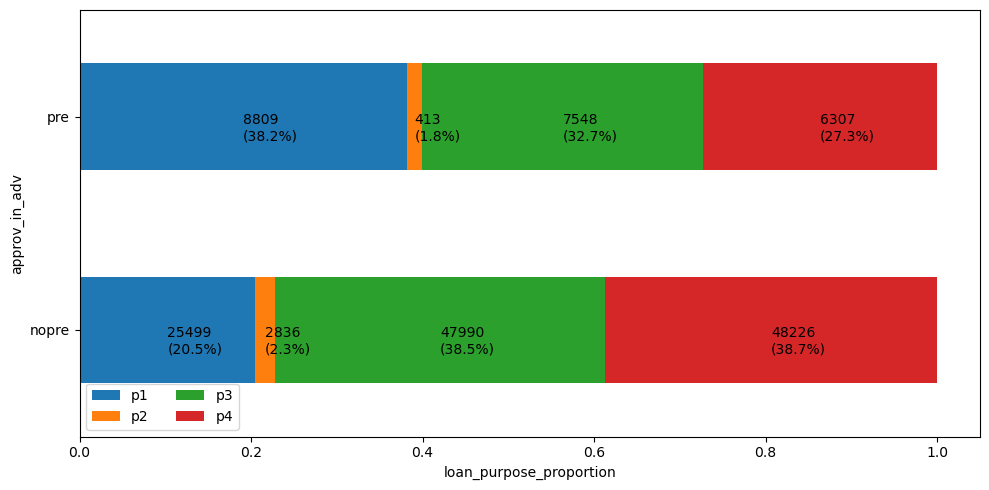

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["approv_in_adv"], df1_cat["loan_purpose"],normalize="index")
cross_tab = pd.crosstab(df1_cat["approv_in_adv"], df1_cat["loan_purpose"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("approv_in_adv")
plt.xlabel("loan_purpose_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

**Interpretations**

1. For "Pre" of approve_in_adv has 23,077 applicants in that "p1" loan purpose has 38.2% (8809), "p3" loan purpose has 32.7% (7548), "p4" loan purpose has27.3% (6307) and  "p2" loan purpose has 1.8%(413).



2. For "NoPre" of approve_in_adv has 1,47,628 applicants in that "p4" loan purpose has 38.7% (48226), "p3" loan purpose has 38.5% (47990), "p2" loan purpose has 2.3% (2836) and  "p1" loan purpose has 20.5% (25499).



3. By looking into graph we can understand that applicants are primarily pre approval loan purpose are [p1 , p3 and p4],           secondary for No pre approval are for [p4,p3 and p1] loan purpose.




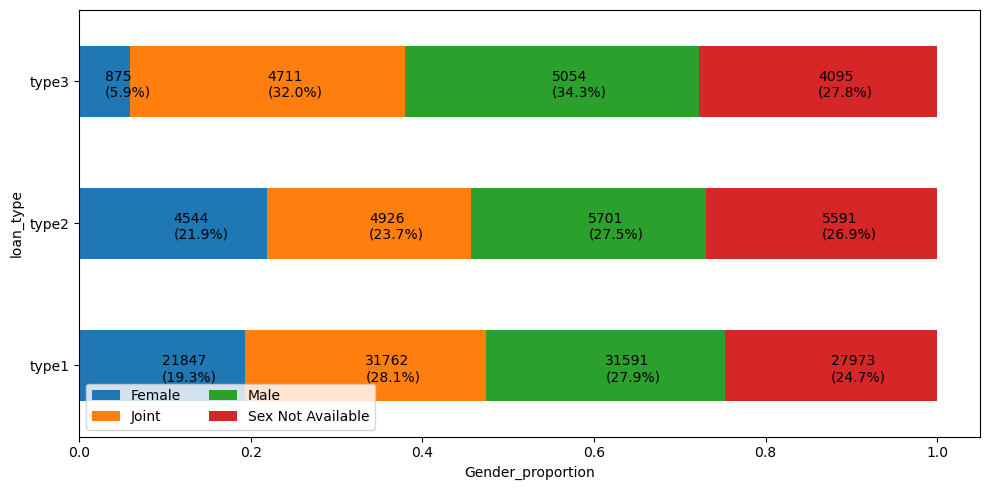

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["loan_type"], df1_cat["Gender"],normalize="index")
cross_tab = pd.crosstab(df1_cat["loan_type"], df1_cat["Gender"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("loan_type")
plt.xlabel("Gender_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

**Interpretations**

1) Loan_type 1 has more than 1.1 lakhs applicants and close to 20000 to loan_type 2 and for Type 3 has 14k

2)  Type 2 and Type 3 are getting close to 5000 applicants for all the gender and above 20000 applicants for Type 1 applicants

3) 76% of the applicants are from loan type1

4) higest appliccants are form the male which is 28% and followed by joint 27%




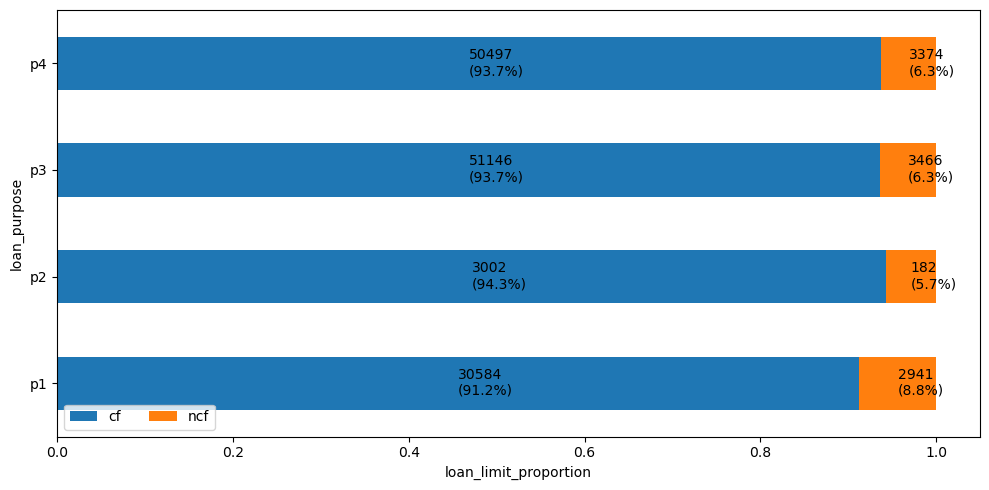

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["loan_purpose"], df1_cat["loan_limit"],normalize="index")
cross_tab = pd.crosstab(df1_cat["loan_purpose"], df1_cat["loan_limit"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("loan_purpose")
plt.xlabel("loan_limit_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
print("percentage of the applicants from loan purpose p1 is",df1_cat[df1_cat["loan_purpose"] == "p1"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan purpose p2 is",df1_cat[df1_cat["loan_purpose"] == "p2"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan purpose p3 is",df1_cat[df1_cat["loan_purpose"] == "p3"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan purpose p4 is",df1_cat[df1_cat["loan_purpose"] == "p4"].shape[0]/df1_cat.shape[0]*100)

percentage of the applicants from loan purpose p1 is 23.225264007533465
percentage of the applicants from loan purpose p2 is 2.202192775946728
percentage of the applicants from loan purpose p3 is 37.622923252841865
percentage of the applicants from loan purpose p4 is 36.85948745543822


In [ ]:
df1_cat["loan_purpose"].value_counts()

p3    55934
p4    54799
p1    34529
p2     3274
Name: loan_purpose, dtype: int64

**Interpretations**

    
1. For "P4" of loan purpose has 53,871 applicants in that "credit facility" has 93.7% (50497) and "Non-credit facility" has 6.3% (3374).



2. For "P3" of loan purpose has 54,612 applicants in that "credit facility" has 93.7% (51146) and "Non-credit facility" has 6.3% (3466).




3. For "P2" of loan purpose has 3274 applicants in that "credit facility" has 94.3% (3002) and "Non-credit facility" has 5.7% (182).




4. For "P1" of loan purpose has 34,529 applicants in that "credit facility" has 91.2%  (30584)and "Non-credit facility" has 8.8% (2941).




5.  By looking into graph we can understand that applicants are primarily looking for loan purpose for "credit facility".



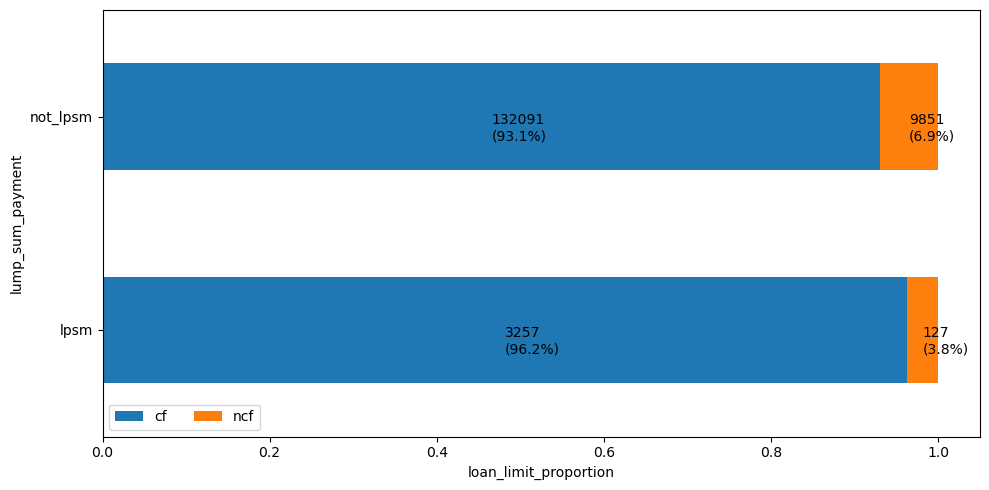

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["lump_sum_payment"], df1_cat["loan_limit"],normalize="index")
cross_tab = pd.crosstab(df1_cat["lump_sum_payment"], df1_cat["loan_limit"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("lump_sum_payment")
plt.xlabel("loan_limit_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
print("percentage of the applicants from lumpsum p1 is",df1_cat[df1_cat["lump_sum_payment"] == "lpsm"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from not lumpsum is",df1_cat[df1_cat["lump_sum_payment"] == "not_lpsm"].shape[0]/df1_cat.shape[0]*100)


percentage of the applicants from lumpsum p1 is 2.2761821483823232
percentage of the applicants from not lumpsum is 97.72381785161768


**Interpretations**

1.  For "lspm" of "lump_sum_payment" has 3,384 applicants in that 96.2% (3257) has "Credit facility" loan_limit and "Non-Credit      facility" has 3.8% (127).



2.  For "no_lspm" of "lump_sum_payment" has 1,41,942 applicants in that 93.1% (132091) has "Credit facility" loan_limit and         "Non-Credit facility" has 6.9% (9851).


3.  By looking into graph we can understand that applicants whose amount of money that is paid in one single payment are have       good "Credit facility".







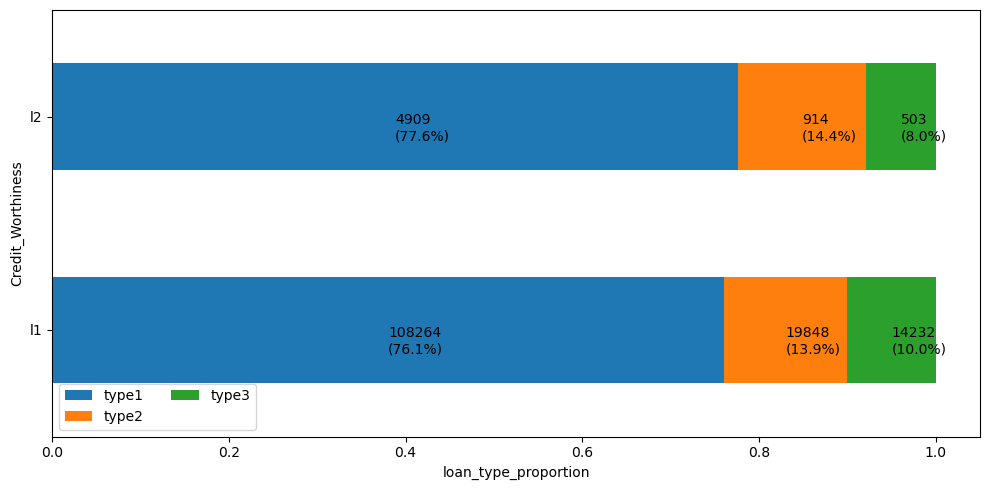

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["Credit_Worthiness"], df1_cat["loan_type"],normalize="index")
cross_tab = pd.crosstab(df1_cat["Credit_Worthiness"], df1_cat["loan_type"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Credit_Worthiness")
plt.xlabel("loan_type_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
print("percentage of the applicants from credit worthness l1 is",df1_cat[df1_cat["Credit_Worthiness"] == "l1"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from credit worthines l2 is",df1_cat[df1_cat["Credit_Worthiness"] == "l2"].shape[0]/df1_cat.shape[0]*100)


percentage of the applicants from credit worthness l1 is 95.74493845429475
percentage of the applicants from credit worthines l2 is 4.255061545705254


**Interpretation**:

1.  For "L1" of "Credit_Worthiness" has 1,42,344 applicants in that 76.1% (108264) has "type 1" loan, "type 2" has 13.9%               (19848) and "type 3" has 10.0% (14232).



2.  For "L2" of "Credit_Worthiness"  has 6,326 applicants in that 77.6% (4909) has "type 1" loan, "type 2" has 14.4%                   (914) and "type 3" has 8.0% (503).



3.  Creditworthiness is how a lender determines that applicants will default on your debt obligations, or how worthy applicants     are to receive new credit. creditworthiness is what creditors look at before they approve any new credit to applicants.




4.  By looking into graph we can understand that applicants who had "L1 Credit_Worthiness" or "L2                                   Credit_Worthiness" has applying primarily for "type 1" loan and secondary essential for "type 2" loan.



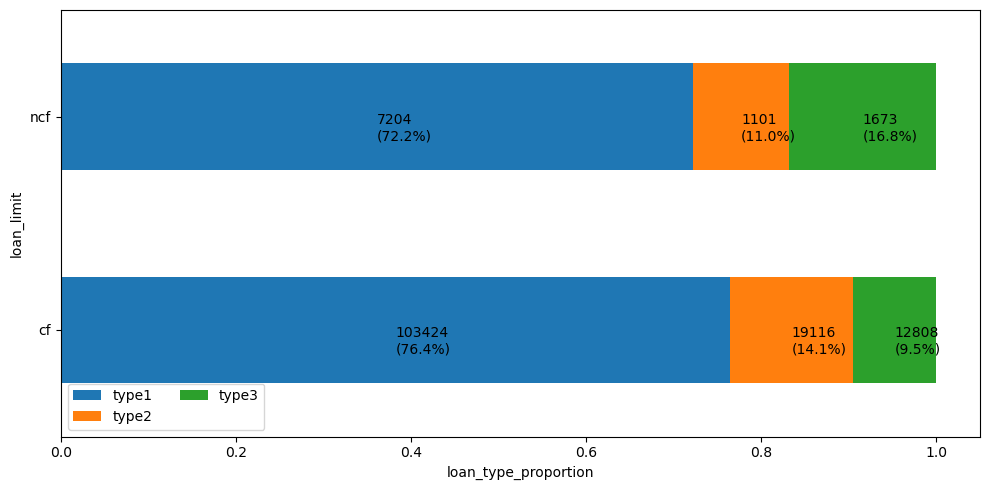

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["loan_limit"], df1_cat["loan_type"],normalize="index")
cross_tab = pd.crosstab(df1_cat["loan_limit"], df1_cat["loan_type"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("loan_limit")
plt.xlabel("loan_type_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
print("percentage of the applicants from loan limit cf is",df1_cat[df1_cat["loan_limit"] == "cf"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan limit ncf is",df1_cat[df1_cat["loan_limit"] == "ncf"].shape[0]/df1_cat.shape[0]*100)

percentage of the applicants from loan limit cf is 91.03921436739087
percentage of the applicants from loan limit ncf is 6.711508710567029


**Interpretation**:

1.  For "Non-credit facility" of Loan limit has 9,978 applicants in that 72.2% (7204) has "type 1" loan, "type 3" has 16.8%         (1101) and "type 2" has 11.0% (1673).



2.  For "Credit facility" of Loan limit has 1,35,348 applicants in that 76.4% (103424) has "type 1" loan, "type 2" has 14.1%         (19116) and "type 3" has 9.5% (12808).



3.  Credit facilities are a type of pre-approved loan which allows the borrower to borrow money on an ongoing basis over an         extended period of time.



4.  By looking into graph we can understand that applicants who had loan limit of "Credit facility" or "Non-credit facility"         has applying primarily for "type 1" loan and secondary essential for "type 2" loan.



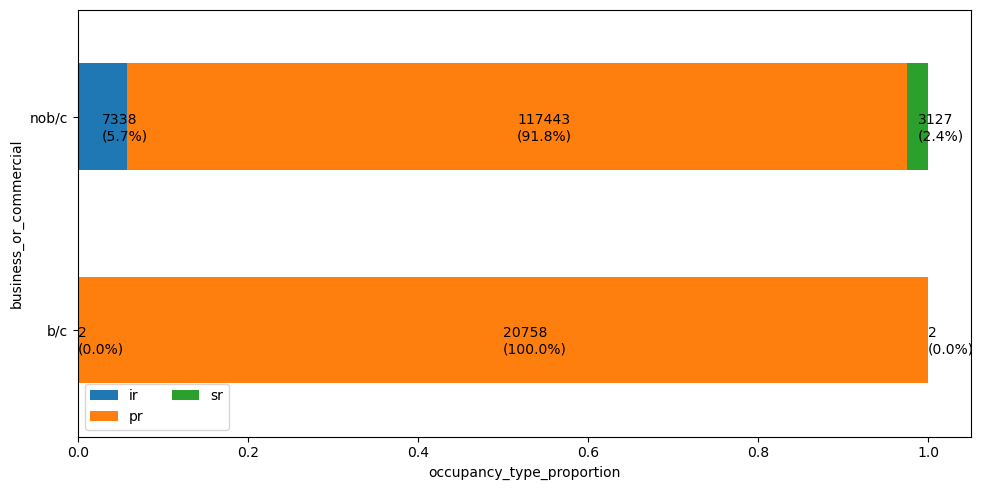

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["business_or_commercial"], df1_cat["occupancy_type"],normalize="index")
cross_tab = pd.crosstab(df1_cat["business_or_commercial"], df1_cat["occupancy_type"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("business_or_commercial")
plt.xlabel("occupancy_type_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
df1_cat["business_or_commercial"].value_counts()

nob/c    127908
b/c       20762
Name: business_or_commercial, dtype: int64

In [ ]:
print("percentage of the applicants from non_business comercial is",df1_cat[df1_cat["business_or_commercial"] == "nob/c"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from business comercials  is",df1_cat[df1_cat["business_or_commercial"] == "b/c"].shape[0]/df1_cat.shape[0]*100)


percentage of the applicants from non_business comercial is 86.03484226811058
percentage of the applicants from business comercials  is 13.965157731889418


**Interpretation**:

1.  For "NO_business_or_commercial" of Loan has 1,27,908 applicants in that 91.8% (1,17,443) has "PR (Occupancy_type)" loan,         "IR (Occupancy_type)" has 5.7% (7338) and "SR (Occupancy_type)" has 2.4% (3127).



2.  For "business_or_commercial" of Loan has 20762 applicants in that 100% (20758) has "PR (Occupancy_type)" loan.



3.  By looking into graph we can understand that applicants who from "Occupancy Of PR" has primarily for both                       "business_or_commercial" loan and "No_business_or_commercial". And secondary essential for "Occupancy Of IR".

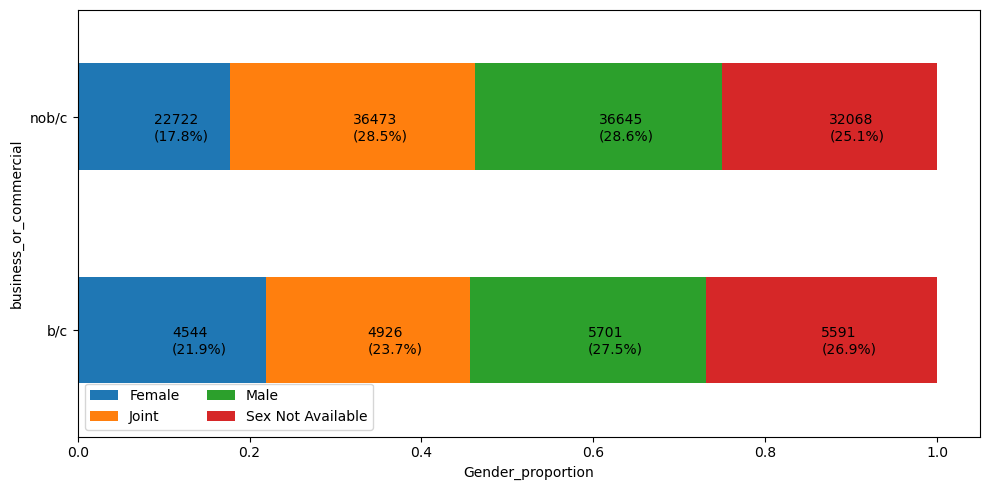

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["business_or_commercial"], df1_cat["Gender"],normalize="index")
cross_tab = pd.crosstab(df1_cat["business_or_commercial"], df1_cat["Gender"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("business_or_commercial")
plt.xlabel("Gender_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

**Interpretation**:

1.  For "NO_business_or_commercial" of Loan has 1,27,908 applicants in that 28.6% (36,645) are "Male Gender",
     "Joint (Male & Femlae)" has 28.5% (36,473), "Sex_Not_Available" (ungendered) has 2.4% (32,068) and "Female" has 17.8% (22,722).



2.  For "business_or_commercial" of Loan has 20,762 applicants in that 27.5% (5591) are "Male Gender",
     "Sex_Not_Available" (ungendered) has 26.9% (5701), "Joint (Male & Femlae) " has 23.7% (4926) and "Female" has 21.9% (4544).



3.  By looking into graph we can understand that applicants who from "Male_Gender" has primarily has both                           "business_or_commercial" loan and "No_business_or_commercial". And secondary essential are from "Joint and                        Sex_Not_Available (ungendered)".tertiary essential are for "Female Gender".
    
    

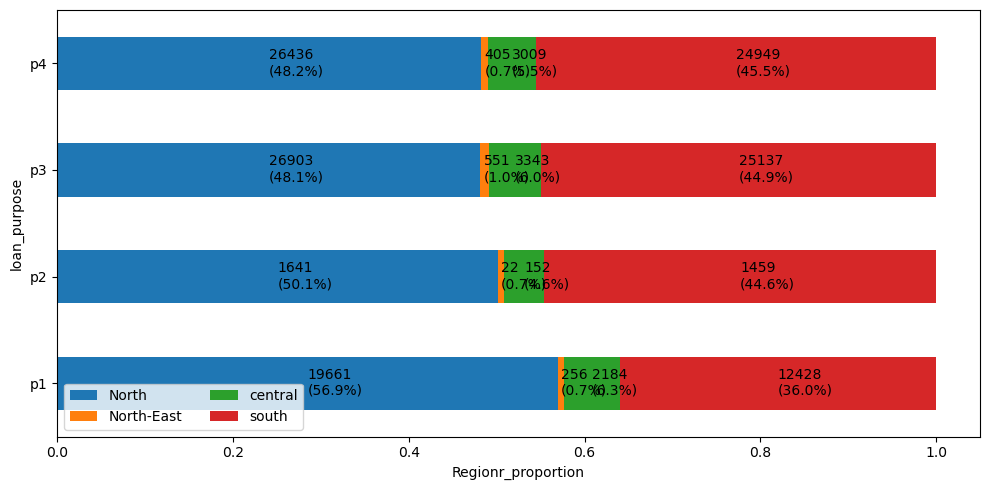

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["loan_purpose"], df1_cat["Region"],normalize="index")
cross_tab = pd.crosstab(df1_cat["loan_purpose"], df1_cat["Region"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("loan_purpose")
plt.xlabel("Regionr_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
print("percentage of the applicants from loan purpose p1 is",df1_cat[df1_cat["loan_purpose"] == "p1"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan purpose p2 is",df1_cat[df1_cat["loan_purpose"] == "p2"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan purpose p3 is",df1_cat[df1_cat["loan_purpose"] == "p3"].shape[0]/df1_cat.shape[0]*100)
print("percentage of the applicants from loan purpose p4 is",df1_cat[df1_cat["loan_purpose"] == "p4"].shape[0]/df1_cat.shape[0]*100)

percentage of the applicants from loan purpose p1 is 23.225264007533465
percentage of the applicants from loan purpose p2 is 2.202192775946728
percentage of the applicants from loan purpose p3 is 37.622923252841865
percentage of the applicants from loan purpose p4 is 36.85948745543822


**Interpretations**

    
1. For "P4" of loan purpose has 54,799 applicants in that "North_region" has 48.2%  (26436), "South_region" has 45.5% (24949), "Central_region" has 5.5% (3009) and "North-East_region" has 0.7% (405).




2. For "P3" of loan purpose has 55,934 applicants in that "North_region" has 48.1%  (26903), "South_region" has 44.9% (25137), "Central_region" has 6.0% (3343) and "North-East_region" has 1.0% (551).




3. For "P2" of loan purpose has 3,368 applicants in that "North_region" has 50.1%  (1641), "South_region" has 44.6% (1459), "Central_region" has 6.6% (152) and "North-East_region" has 0.7% (256).




4. For "P2" of loan purpose has 34,529 applicants in that "North_region" has 56.9%  (19661), "South_region" has 36.0% (12428), "Central_region" has 6.3% (2184) and "North-East_region" has 0.7% (256).




5.  By looking into graph we can understand that applicants are primarily lookin for loan purpose from "North_region",             secondarily from "South_region".

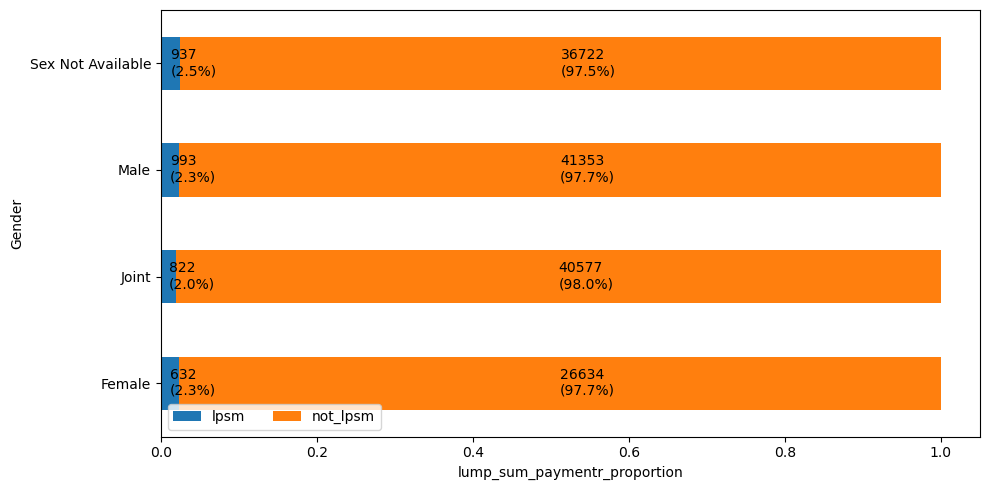

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["Gender"], df1_cat["lump_sum_payment"],normalize="index")
cross_tab = pd.crosstab(df1_cat["Gender"], df1_cat["lump_sum_payment"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Gender")
plt.xlabel("lump_sum_paymentr_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
print("percent of male who applying for not lumpsm amount",df1_cat[(df1_cat["Gender"]=="Male") & (df1_cat["lump_sum_payment"]=="not_lpsm")].shape[0]/df1_cat.shape[0]*100)
print("percent of Joint who applying for not lumpsm amount",df1_cat[(df1_cat["Gender"]=="Joint") & (df1_cat["lump_sum_payment"]=="not_lpsm")].shape[0]/df1_cat.shape[0]*100)
print("percent of Female who applying for not lumpsm amount",df1_cat[(df1_cat["Gender"]=="Female") & (df1_cat["lump_sum_payment"]=="not_lpsm")].shape[0]/df1_cat.shape[0]*100)
print("percent of Sex Not Available who applying for not lumpsm amount",df1_cat[(df1_cat["Gender"]=="Sex Not Available") & (df1_cat["lump_sum_payment"]=="not_lpsm")].shape[0]/df1_cat.shape[0]*100)

percent of male who applying for not lumpsm amount 27.815295621174414
percent of Joint who applying for not lumpsm amount 27.29333423017421
percent of Female who applying for not lumpsm amount 17.914844958633214
percent of Sex Not Available who applying for not lumpsm amount 24.70034304163584


**Interpretations**

1.  For "Sex_Not_Available(Ungendered)" has 37,659 applicants in that 97.5% (36722) has "not_lump_sum_payment" and                     "lump_sum_payment" has 2.5% (937).


2.  For "Male_Gender" has 42,346 applicants in that 97.7% (41353) has "not_lump_sum_payment" and                                   "lump_sum_payment" has 2.3% (993).


3.  For "Joint (Male & Female)" has 41,399 applicants in that 98.0% (40577) has "not_lump_sum_payment" and                            "lump_sum_payment" has 2.3% (822).


4.  For "Female_Gender" has 27,266 applicants in that 97.7% (26634) has "not_lump_sum_payment" and                                 "lump_sum_payment" has 2.3% (632).


5.  By looking into graph we can understand that applicants whose amount of money that is paid in one single payment are barely       low percentage attained from all gender.

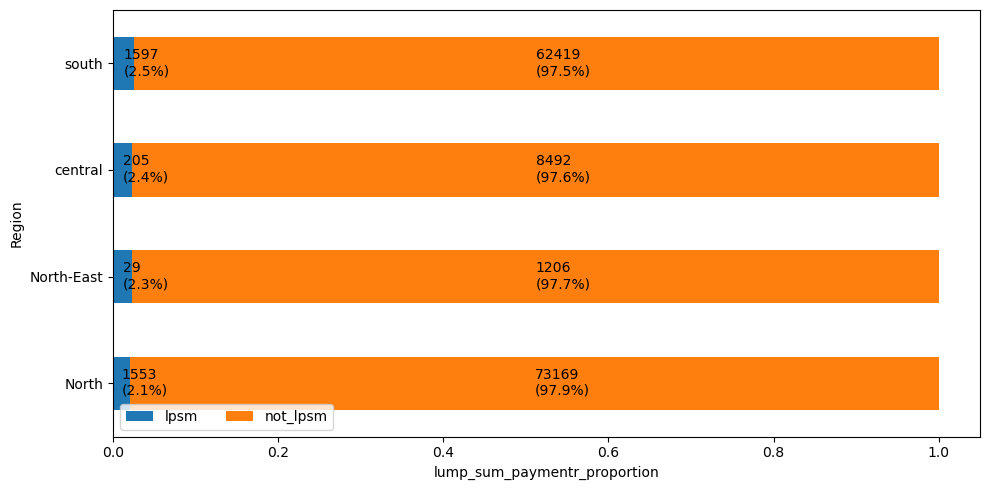

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["Region"], df1_cat["lump_sum_payment"],normalize="index")
cross_tab = pd.crosstab(df1_cat["Region"], df1_cat["lump_sum_payment"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Region")
plt.xlabel("lump_sum_paymentr_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
df1_cat["Region"].value_counts()

North         74722
south         64016
central        8697
North-East     1235
Name: Region, dtype: int64

**Interpretations**

1.  For "South_Region" has 2,02,217 applicants in that 97.5% (62419) has "not_lump_sum_payment" and                     "lump_sum_payment" has 2.5% (1597).


2.  For "Central_Region" has 8,697 applicants in that 97.6% (8492) has "not_lump_sum_payment" and                     "lump_sum_payment" has 2.4% (205).


3.  For "North_east_Region" has 1237 applicants in that 97.7% (1206) has "not_lump_sum_payment" and                     "lump_sum_payment" has 2.3% (29).


4.  For "North_Region" has 74722 applicants in that 97.9% (73169) has "not_lump_sum_payment" and                     "lump_sum_payment" has 2.1% (1553).


5.  By looking into graph we can understand that applicants whose amount of money that is paid in one single payment are barely       low percentage attained from all region.

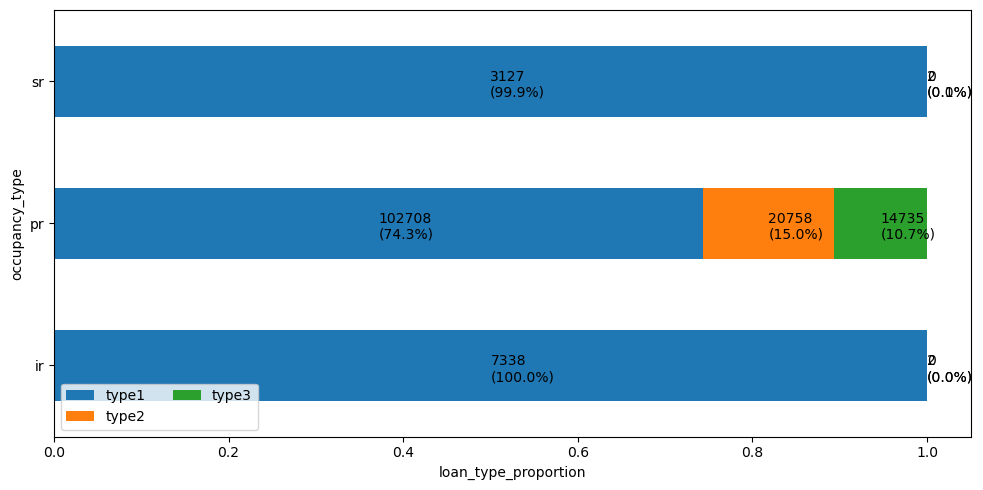

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["occupancy_type"], df1_cat["loan_type"],normalize="index")
cross_tab = pd.crosstab(df1_cat["occupancy_type"], df1_cat["loan_type"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("occupancy_type")
plt.xlabel("loan_type_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

In [ ]:
df1_cat["occupancy_type"].value_counts()

pr    138201
ir      7340
sr      3129
Name: occupancy_type, dtype: int64

**Interpretation**:

1.  For "SR Occupancy" has 3129 applicants in that 99.9% (3127) has "type 1" loan, "type 2" has 0.2% (2).



2.  For "PR Occupancy" has 1,38,201 applicants in that 74.3% (102708) has "type 1" loan, "type 2" has 15.0% (20758) and "type 3"  has 10.7% (14735).



3.  For "IR Occupancy" has 7340 applicants in that 99% (7338) has "type 1" loan, "type 2" loan has 0.2% (2).



4.  By looking into graph we can understand that applicants who from "Occupancy_type " all are applying primarily for "type 1" loan and secondary essential for "type 2" loan.

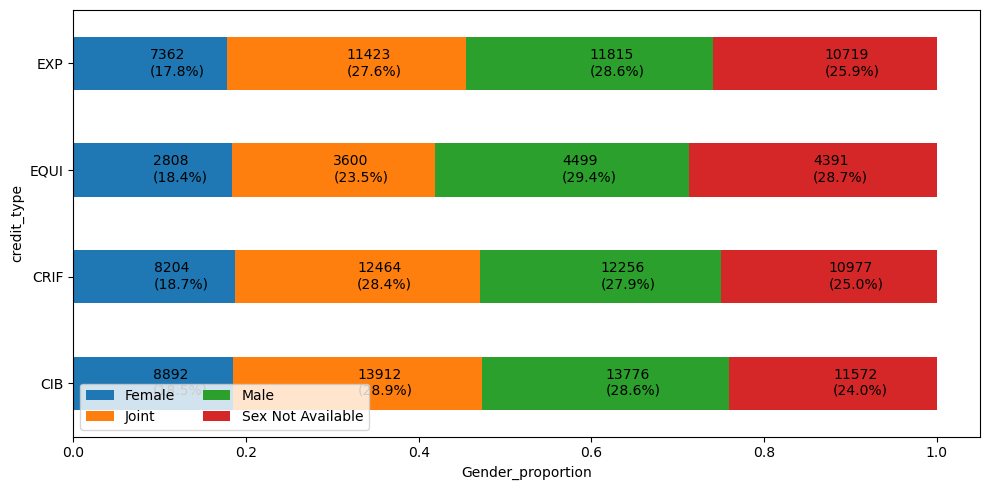

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["credit_type"], df1_cat["Gender"],normalize="index")
cross_tab = pd.crosstab(df1_cat["credit_type"], df1_cat["Gender"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("credit_type")
plt.xlabel("Gender_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

**Interpretation**:

1.  For "EXP" of credit type has 41,319 applicants in that 28.6% (11,815) are from "Male_gender", "Joint (Male & Female)" has       27.6% (11423), "Sex_Not_Available"(Ungendered) has 25.9% (10719) and "Female_Gender" has 17.8% (7362).



2.  For "EQUI" of credit type has 15,298 applicants in that 29.4% (4,499) are from "Male_gender", "Sex_Not_Available"              (Ungendered) has 28.7% (4391),"Joint (Male & Female)" has 23.5% (3600) and "Female_Gender" has 18.4% (2808).



3.  For "CRIF" of credit type has 59,199 applicants in that 28.4% (12,464) are from "Joint (Male & Female)", "Male_gender" has 27.9% (12,256),"Sex_Not_Available (Ungendered)" has 25.0% (10,977) and "Female_Gender" has 18.7% (8204).



4.  From "CIB" of credit type  has 48,152 applicants in that 28.9% (13912) are from "Joint (Male & Female)","Male_Gender" has 28.6% (13776), "Sex_Not_Available (Ungendered)" has 24.0% (11572) and "Female_Gender" has 18.5% (8892).




5.  By looking into graph we can understand that applicants are "Male_Gender" has primarily from credit_type                                    [ "EXP","EQUI,"CRIF"]. And secondary essential are "Joint (Male & Female)" from ["CRIF","CIB"].

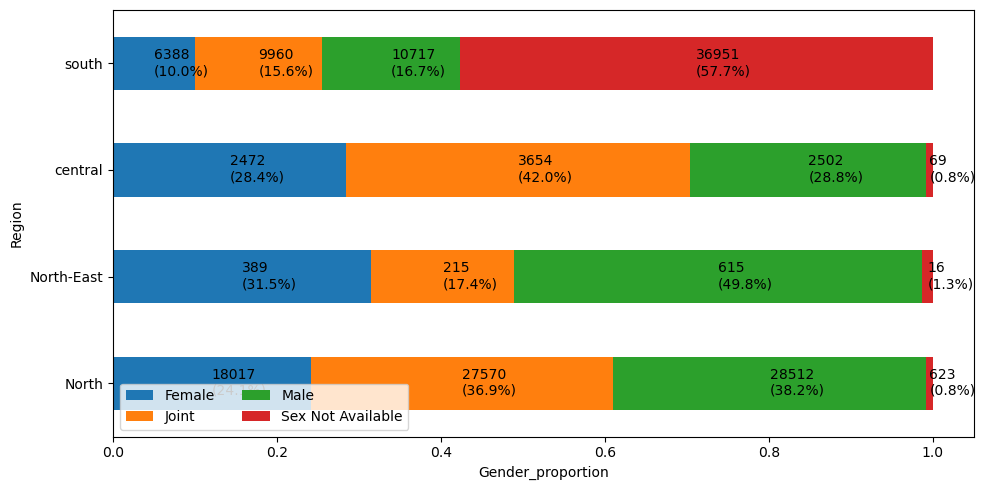

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["Region"], df1_cat["Gender"],normalize="index")
cross_tab = pd.crosstab(df1_cat["Region"], df1_cat["Gender"])
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Region")
plt.xlabel("Gender_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=10)
plt.tight_layout()

**Interpretation**:

1.  From "South_Region" has 64,016 applicants in that 57.7% (36,951) are from "Sex_Not_Available Ungendered)", "Male_Gender"       has 16.7% (10717), "Joint" (Male & Female) has 15.6% (9960) and "Female_Gender" has 10.0% (6388).



2.  From "Central_Region" has 72,713 applicants in that 42.0% (3654) are from "Joint (Male & Female)", "Male_Gender" has 28.8%    (2502), "Female_Gender" has 28.4% (2472) and "Sex_Not_Available"(Ungendered) has 0.8% (69).



3.  From "North_East" has 1,235 applicants in that 49.8% (615) are from "Male_Gender", "Female_Gender" has 31.5% (389), "Joint     (Male & Female)" has 17.4% (215) and "Sex_Not_Available"(Ungendered) has 1.3% (16).



4.  From "North_Region" has 74,722 applicants in that 38.2% (28512) are from "Male_Gender", "Joint (Male & Female)" has 36.9% (27570), "Female_Gender" has 24.1% (18017) and "Sex_Not_Available (Ungendered)" has 0.8% (623).




5.  By looking into graph we can understand that applicants are "Male_Gender" has primarily from                                    [ "Central_Region","North_East_Region","North_Region"]. And secondary essential are "Female" from ["Central","North-East_Region" and "North_Region"]. Tertiary essential are for "Sex_Not_Available (Ungendered)" are major part from "South-Region".

# Bivariant For Categorical and Numerical

In [ ]:
df1_cat.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'occupancy_type', 'total_units', 'credit_type', 'age',
       'submission_of_application', 'Region', 'Status', 'term_period'],
      dtype='object')

In [ ]:
df1_num = df1.select_dtypes(include=np.number)

In [ ]:
df1_num.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1'],
      dtype='object')

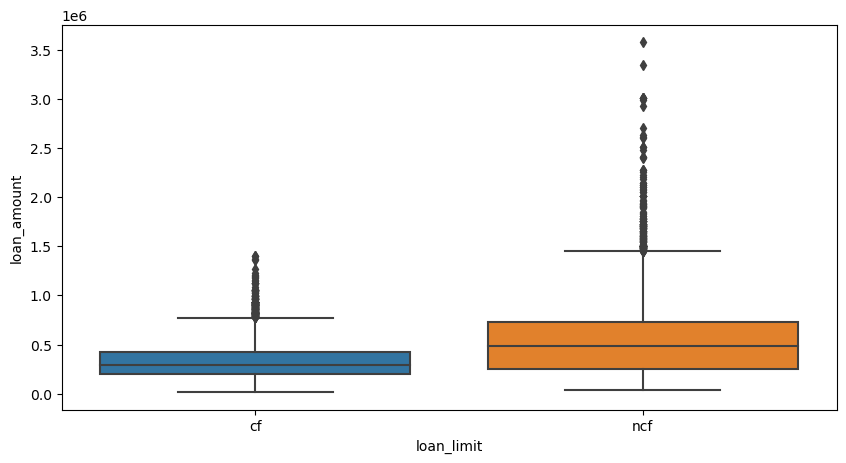

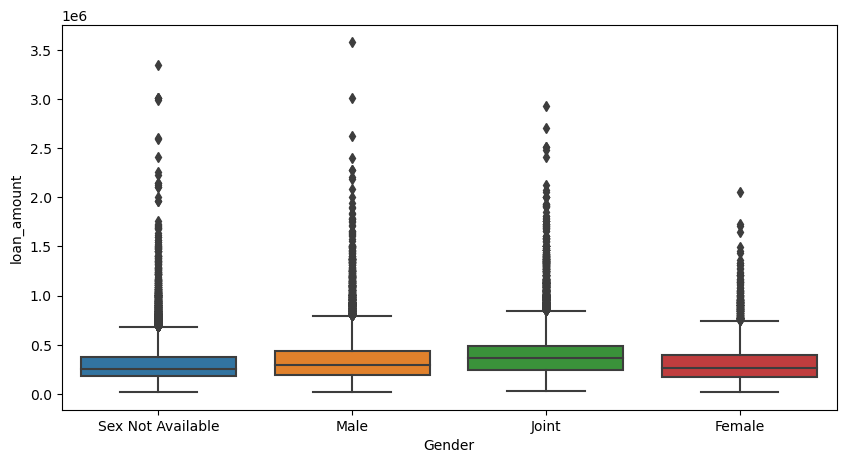

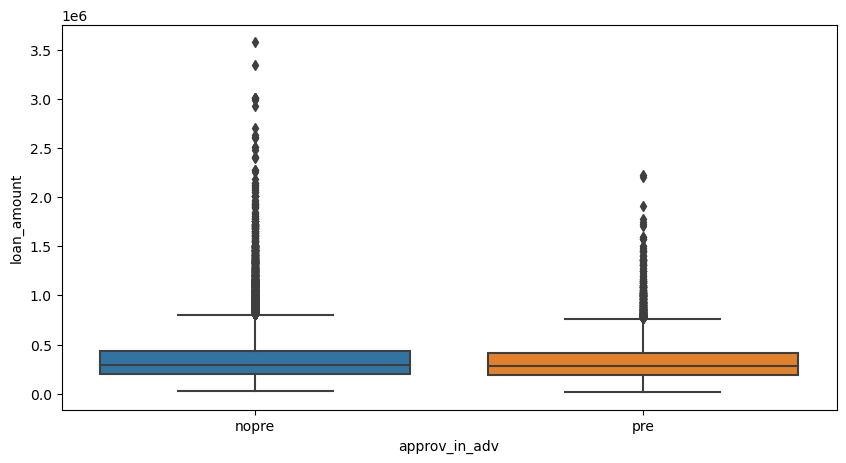

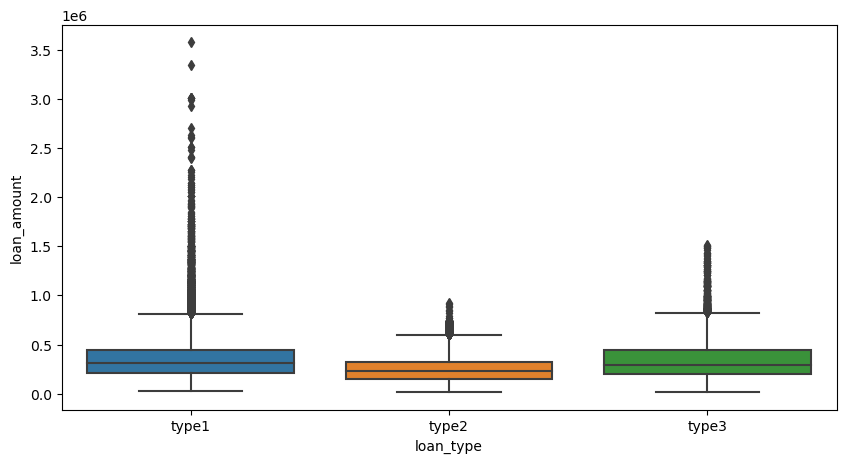

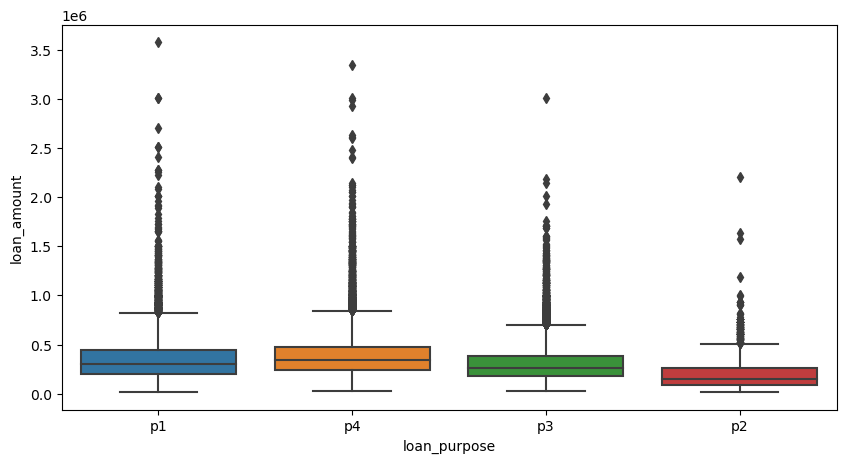

...

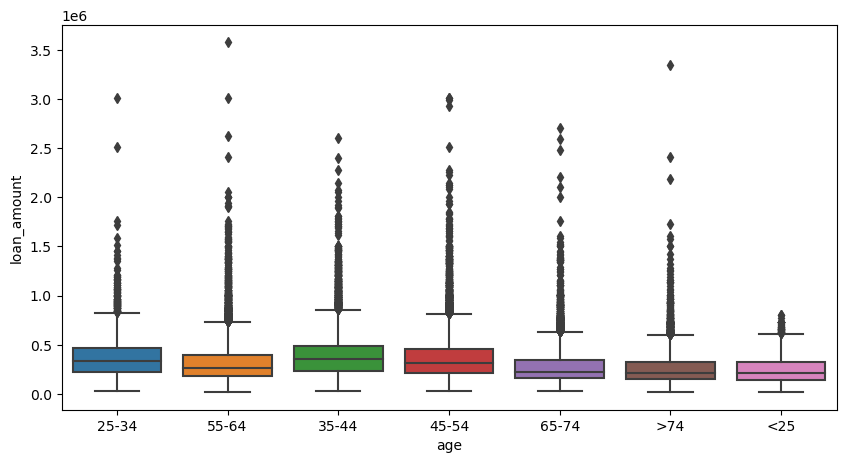

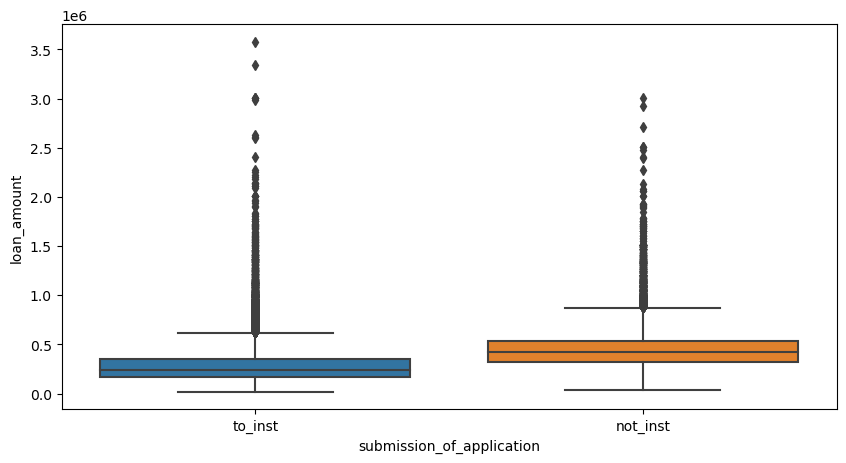

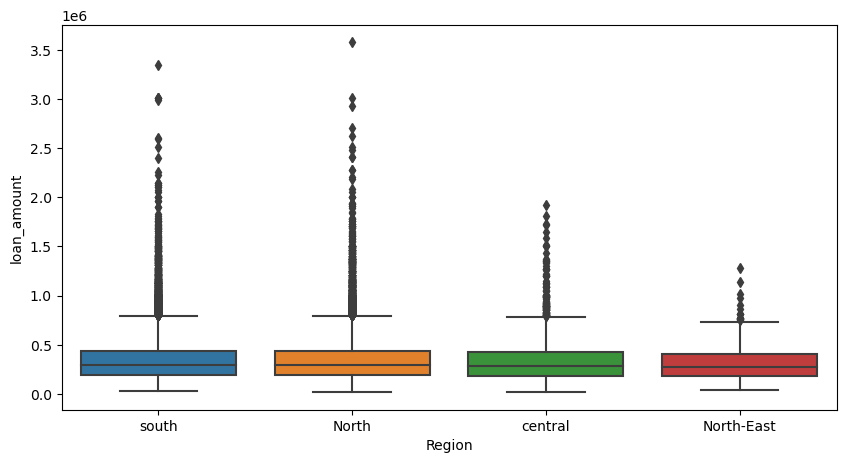

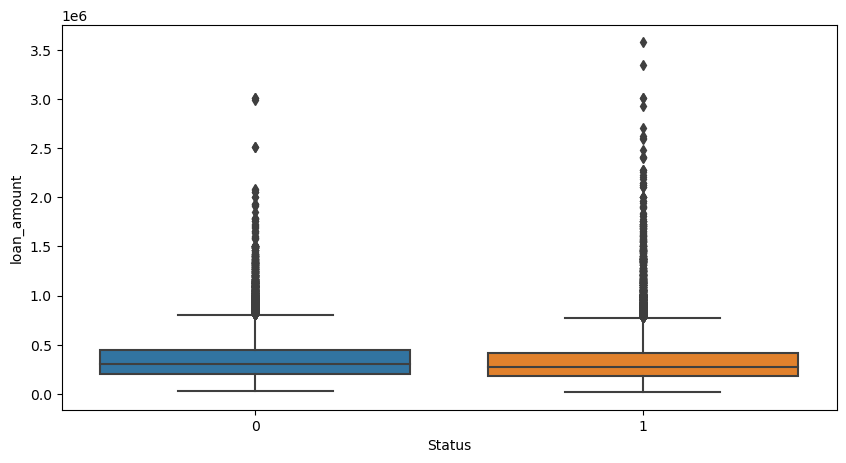

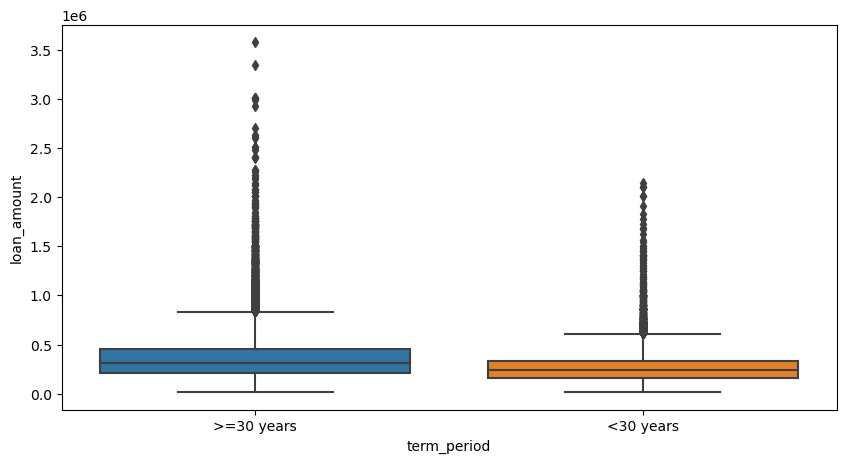

In [ ]:
for i in df1_cat.columns:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df1_cat[i], y=df1_num["loan_amount"])
    plt.show()

**Interpretations**


1) the avg loan ammount for cf loan_limit is 3.0 lakh and 5.0Lakh for ncf loan applicants few ncf laon_limit applciants are
   applying for high loan amount such as above 20 lakh
    
2) female loan applicants are applying for less loan with avg loan of 3.0 Lakh where as other genders are applyong for 4.0Lakh 
   of avg loan amount

3) there are few applicants who need pre_aproval of loan with avg loan amount of 4.0 Lakhs max pre aproval of loan is 20Lakh

4) l1 credit worthiness is ahving higest loan amount close to 35 lakhs and minimum loan amount of p1 credit worthiness is less
   then 1 lakh
    
    

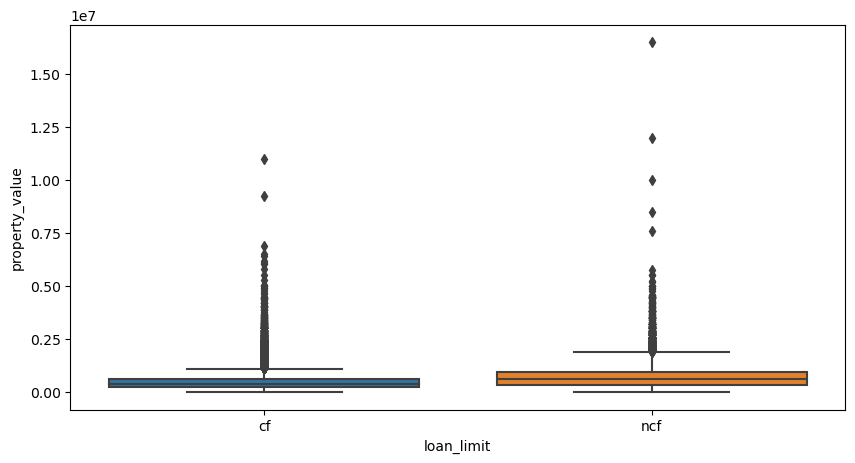

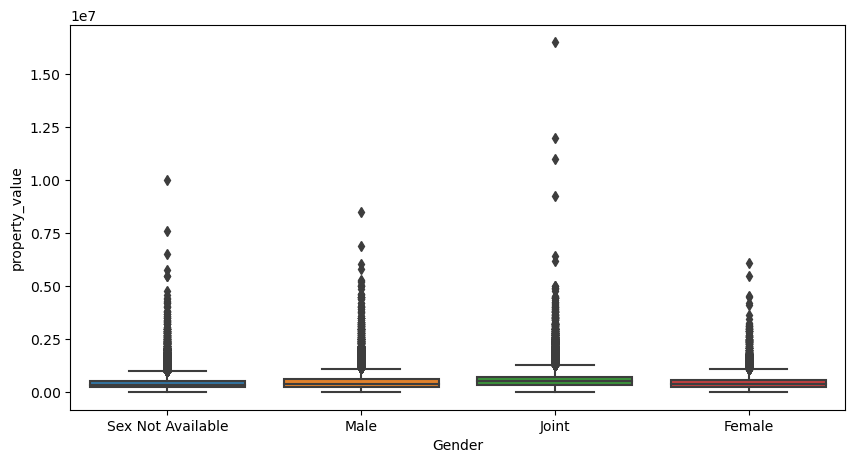

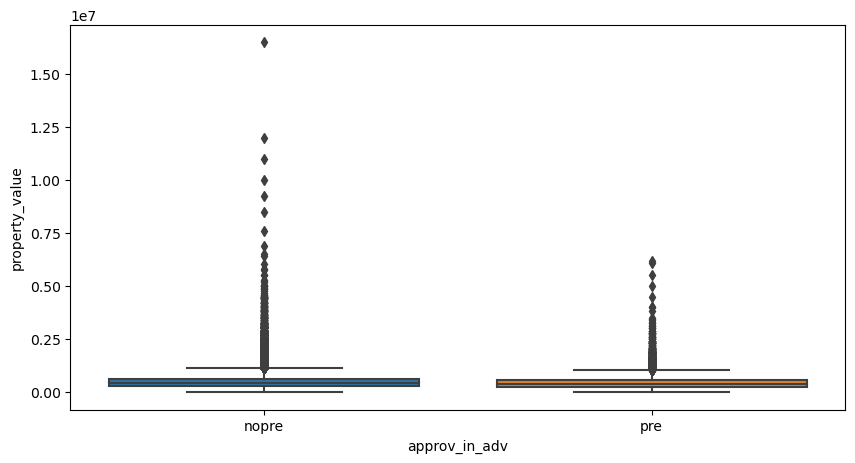

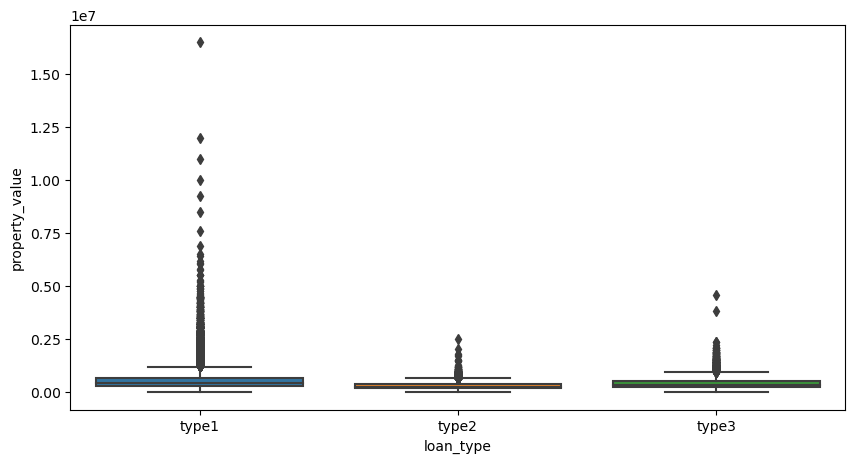

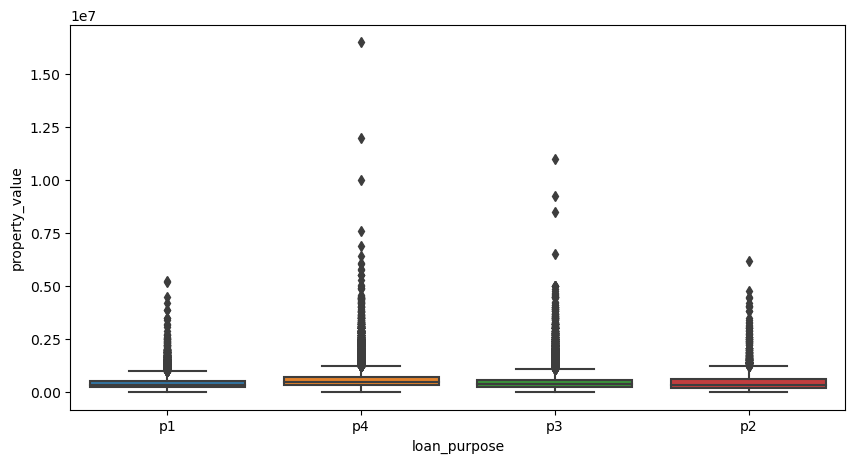

...

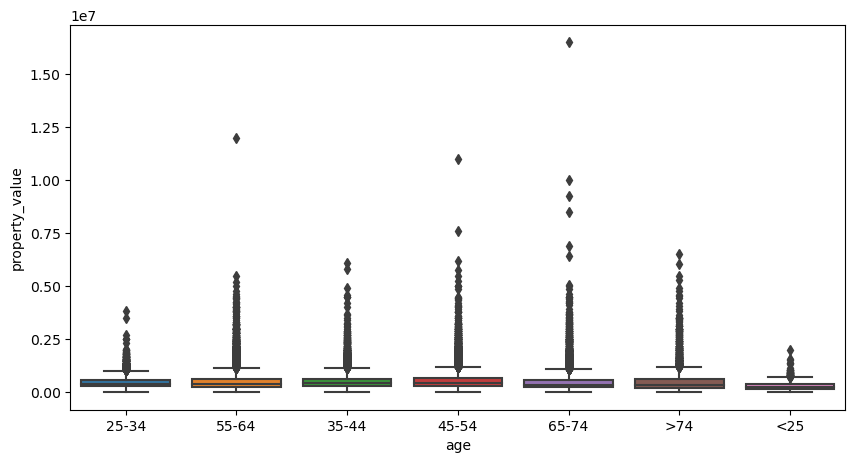

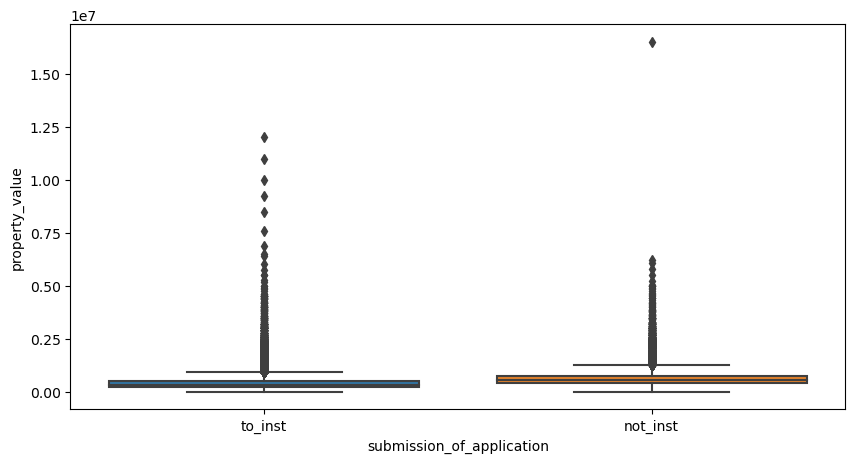

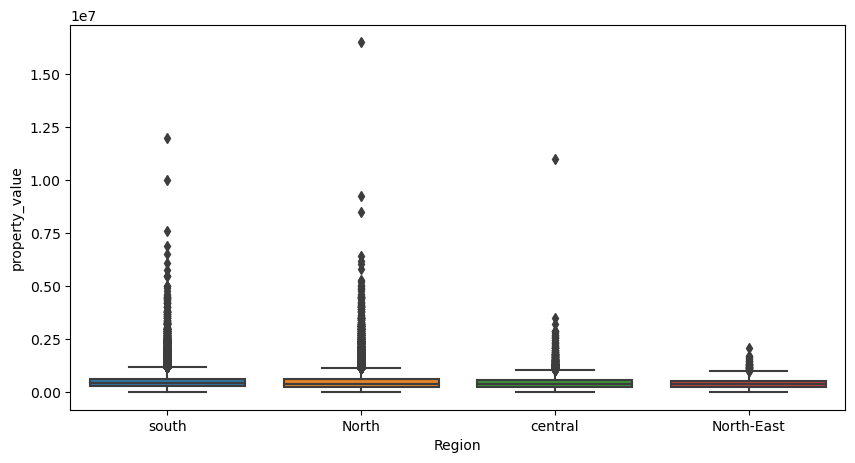

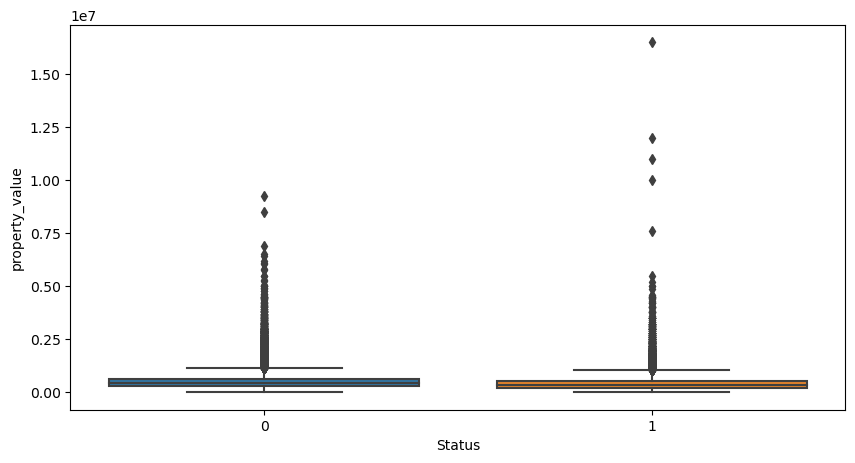

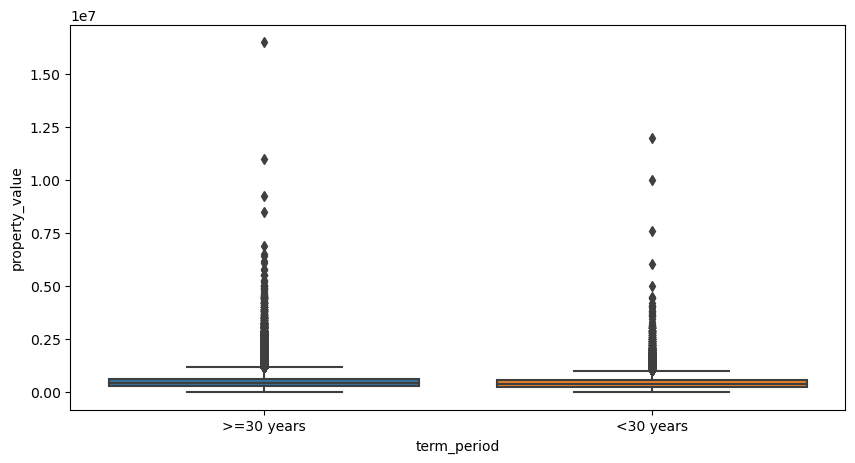

In [ ]:
for i in df1_cat.columns:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df1_cat[i], y=df1_num["property_value"])
    plt.show()

**Interpretations**

1) cf loan limit has very less property value with the avg of 15 lakh where as ncf loan limit has avg of 30 lakh proeprty value

2) gender joint has the higest proepty value with more then 1.5cr other genders has close to 15lakh of avg 
   propert value as loan applicants
    
3) applcants who are in need of pre_aproavl if loan has avg proeprty value of 15 lakh and higest property value is
   75 lakh of property value.
    
4) loan purpose p4 is having higest proeprty value of more then 1.5cr


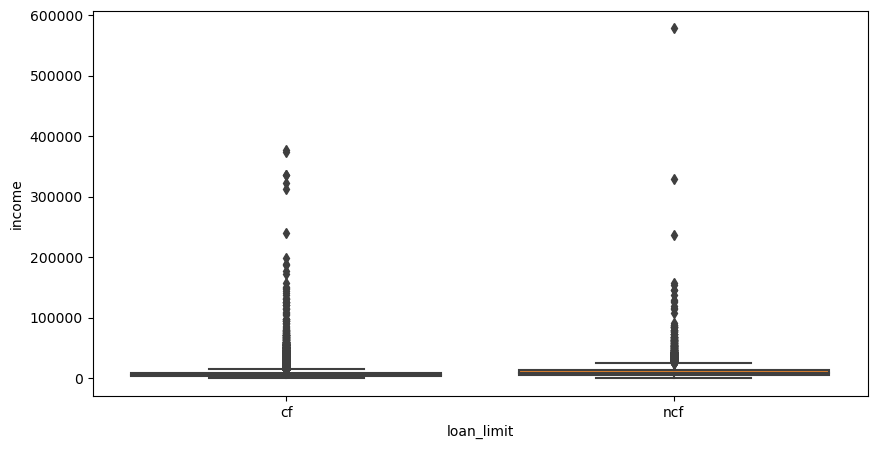

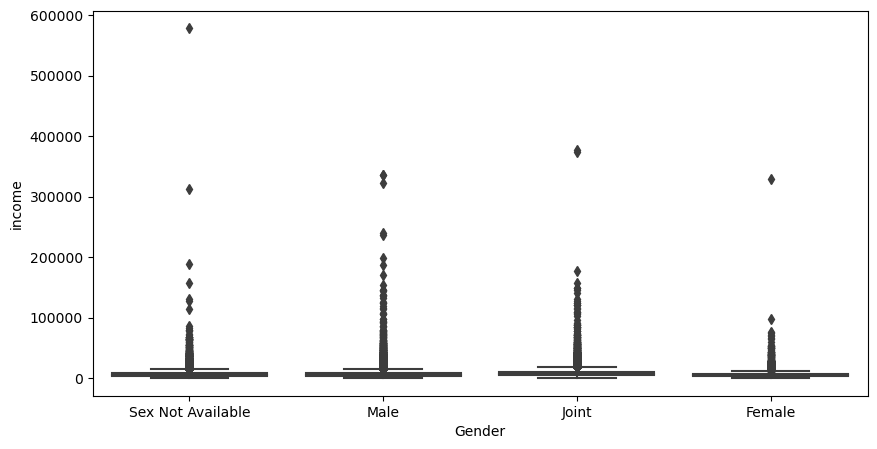

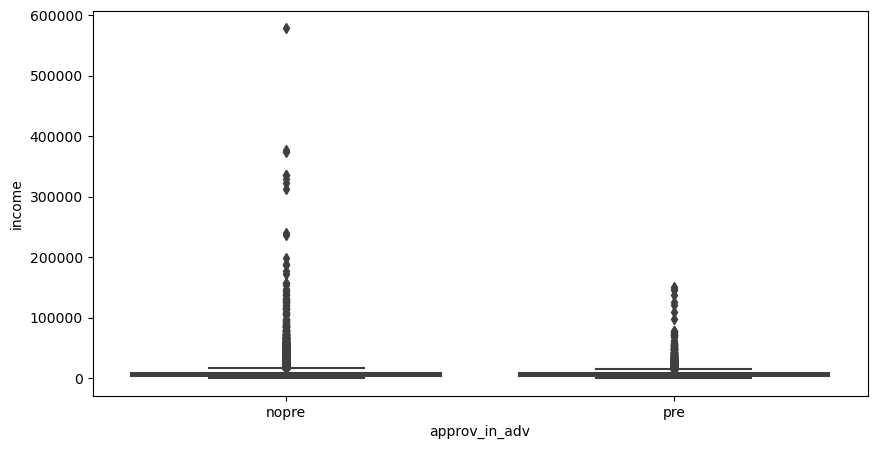

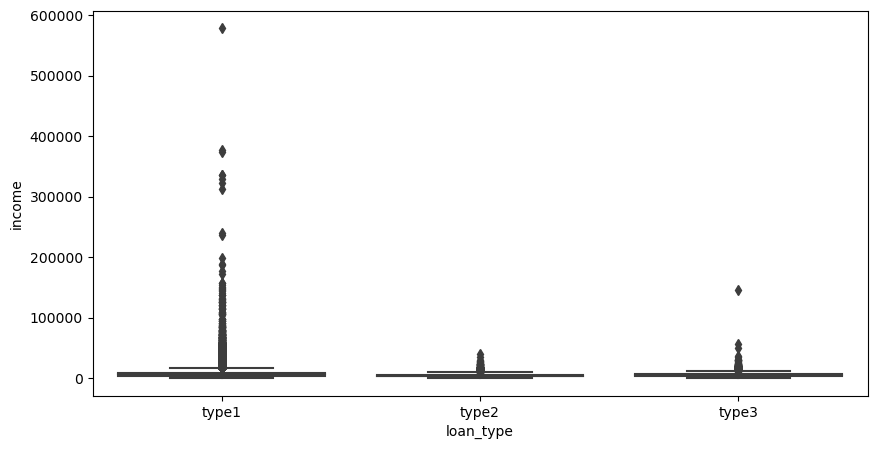

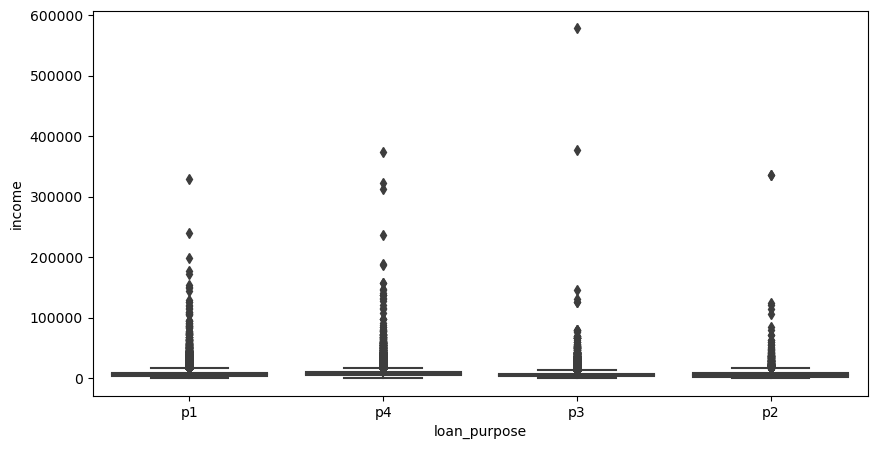

...

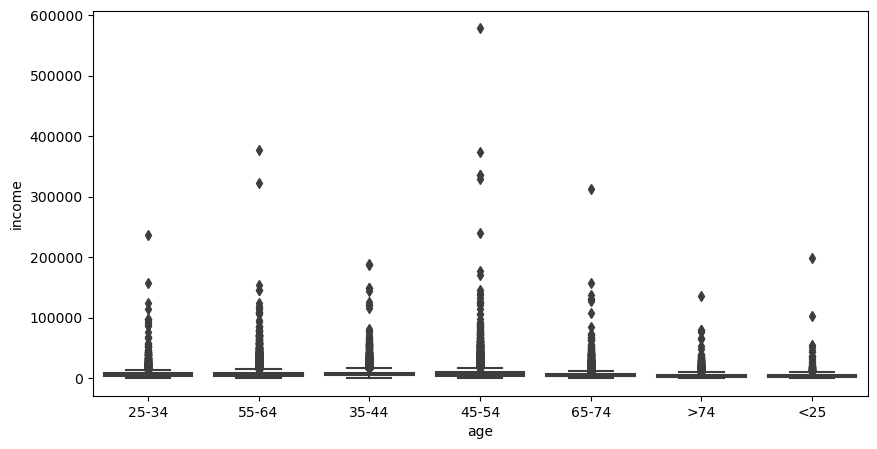

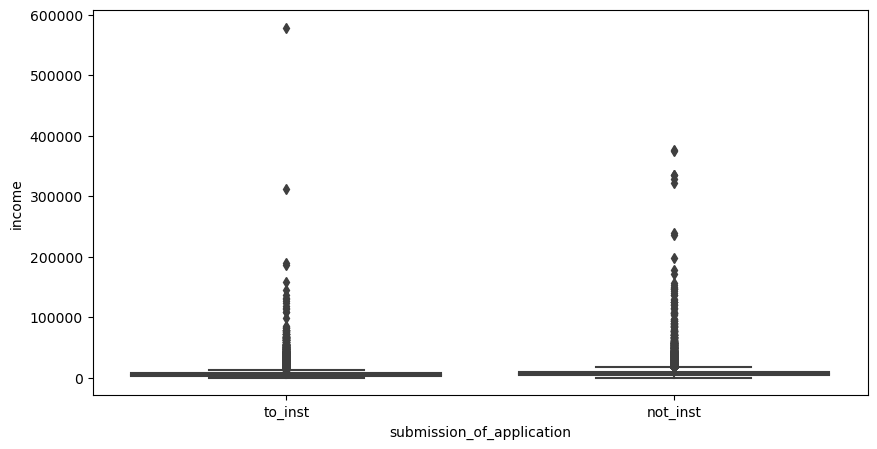

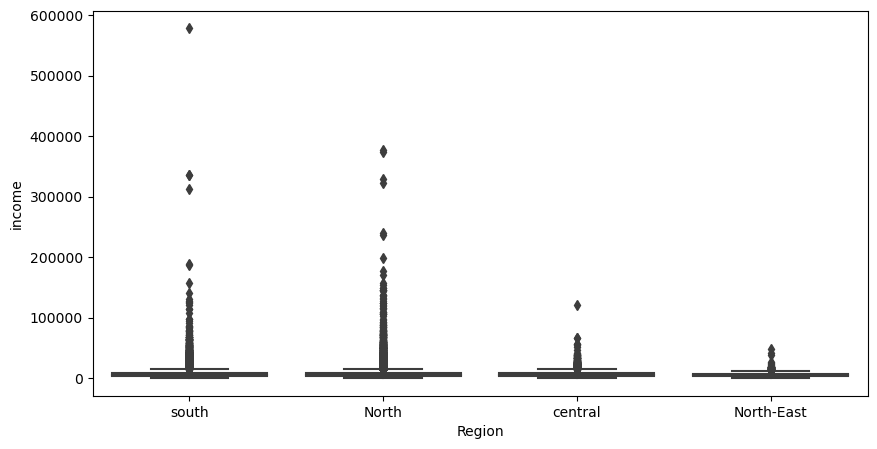

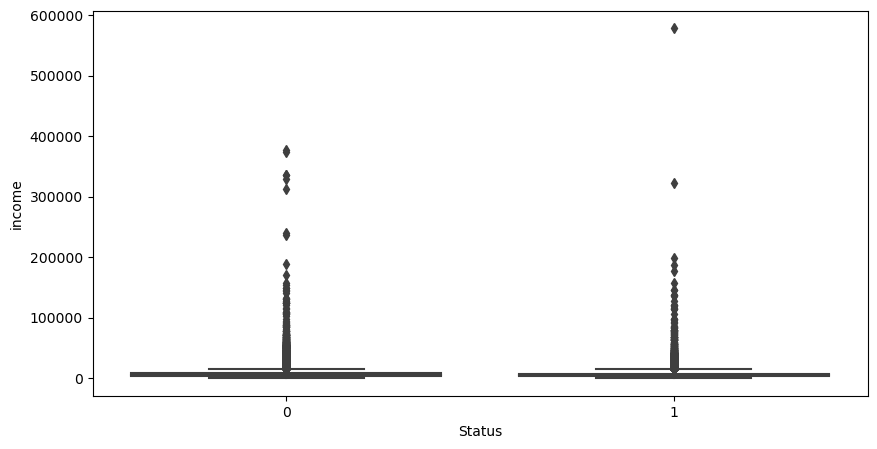

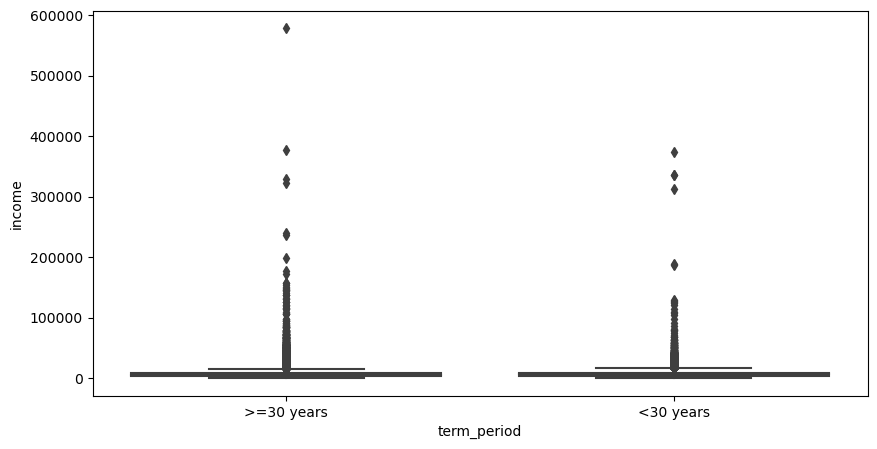

In [ ]:
for i in df1_cat.columns:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df1_cat[i], y=df1_num["income"])
    plt.show()

**Interpretations**

1) cf loan limit applicants are having highhest income of more then 3.5 lakh and ncf is having 3lakh as highest income

2) gender type sex not available is having highest income of 6Lakh the avg income of other genders is less then 50k 

3) applicants who need pre aproval of loan has the highest income of 2.0 Lakhs

4) loan type 1 applicants are having more inncome then others the highest is 4.lakhs.

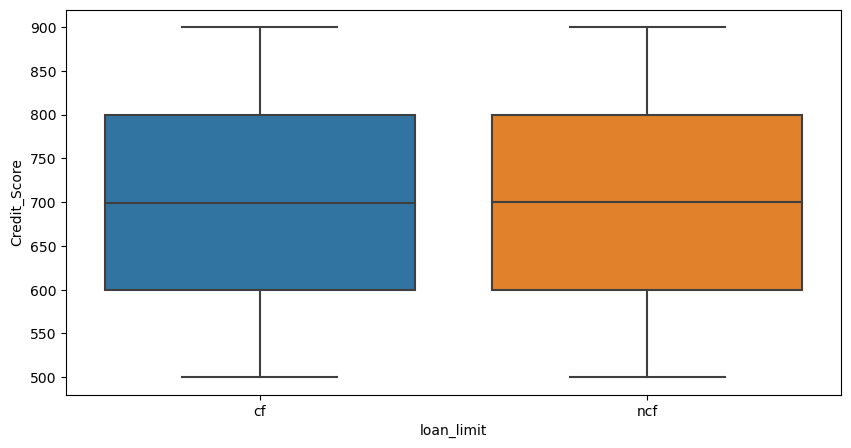

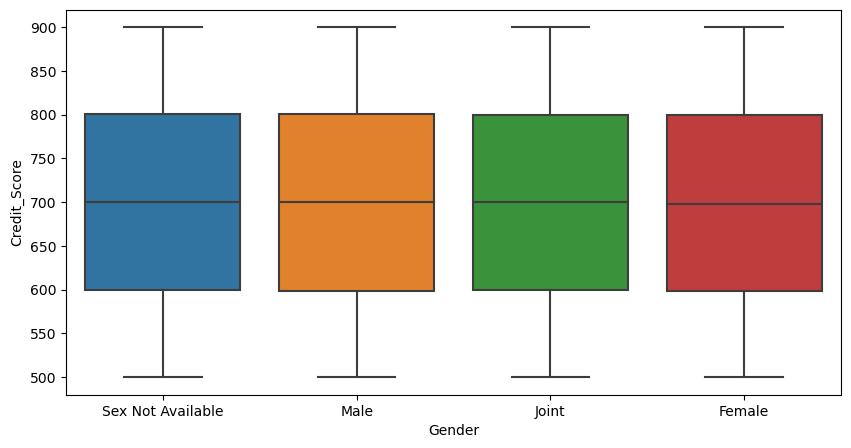

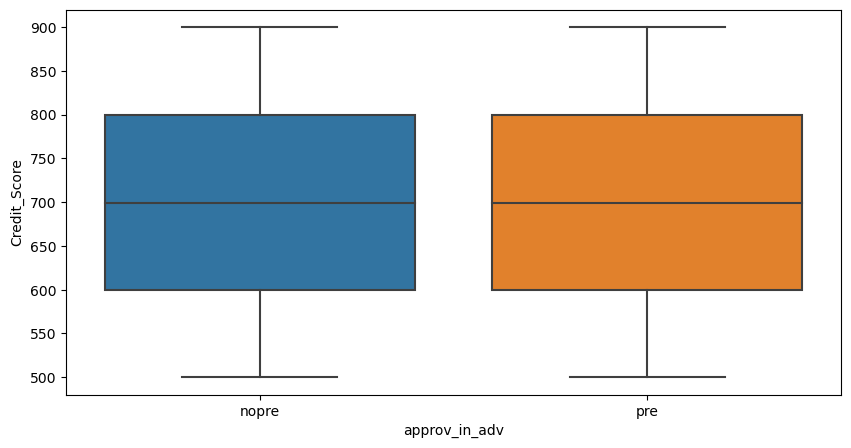

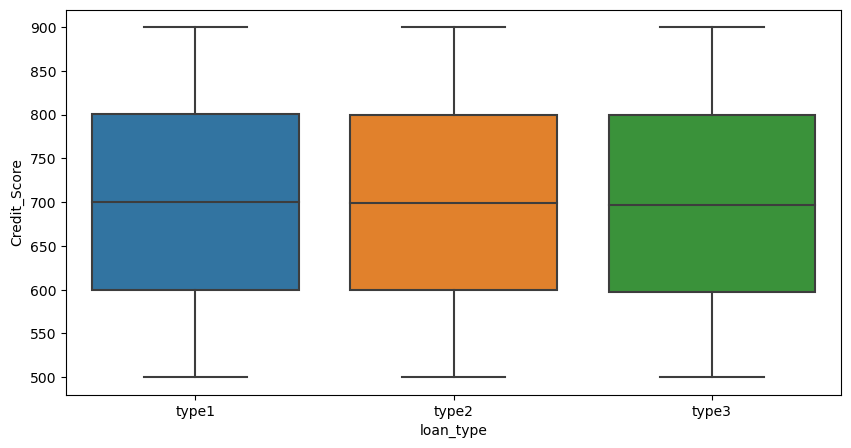

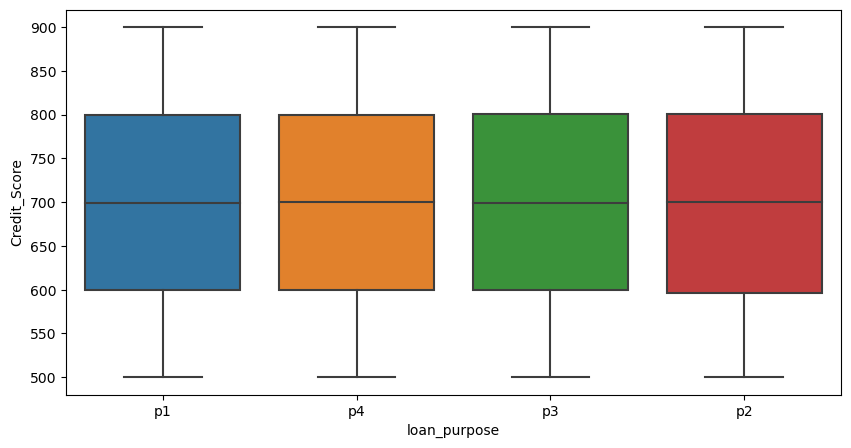

...

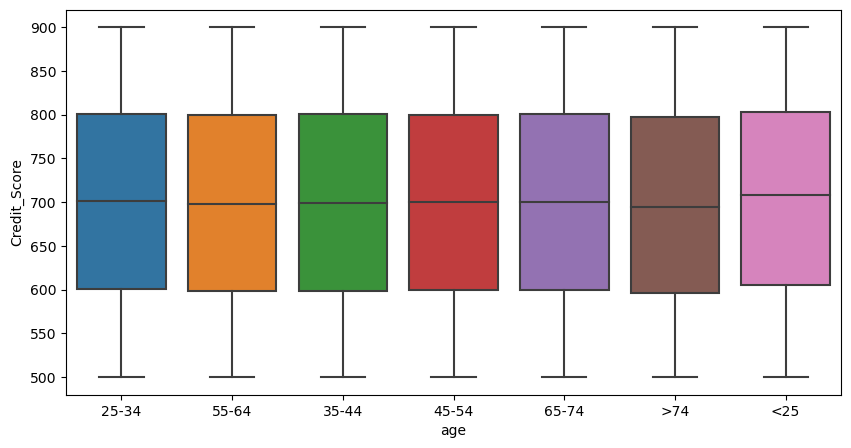

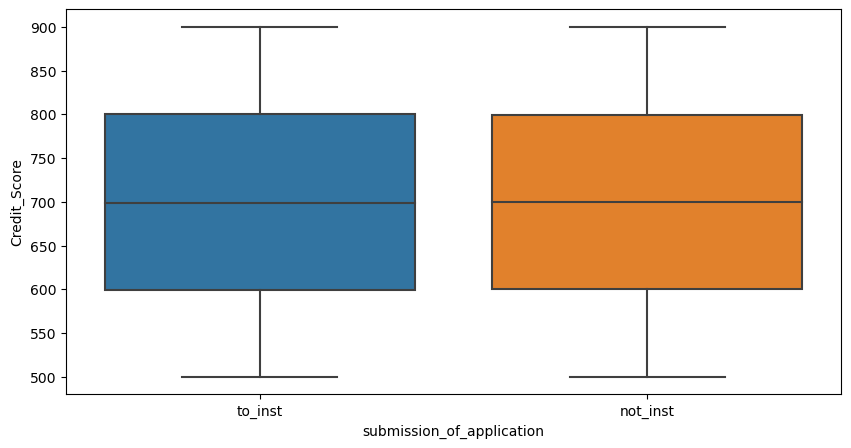

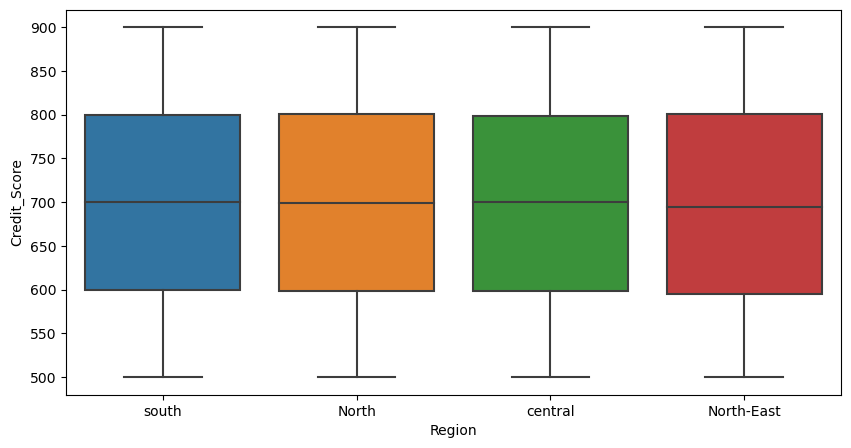

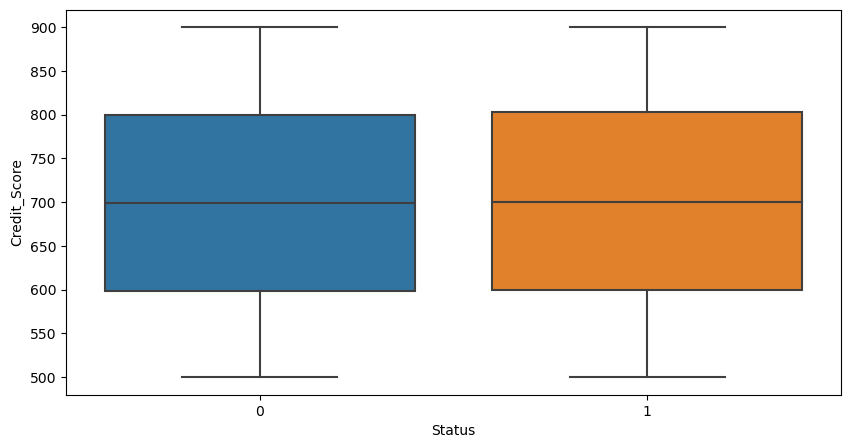

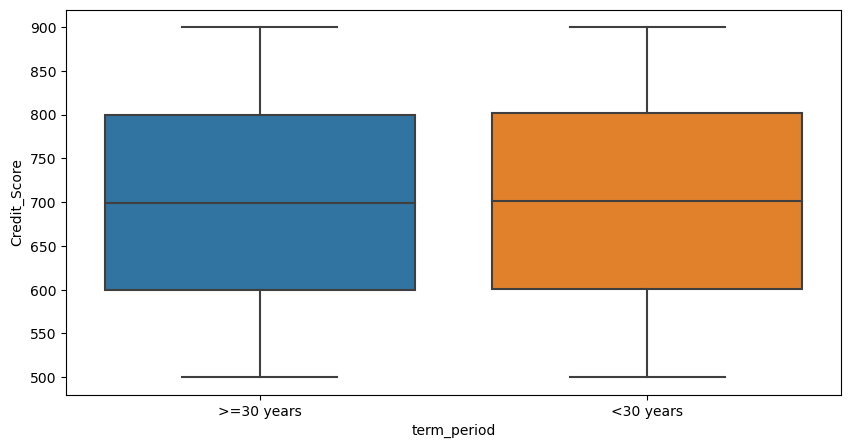

In [ ]:
for i in df1_cat.columns:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df1_cat[i], y=df1_num["Credit_Score"])
    plt.show()

**Interpretations**

1) credit scpre is same for all the attribues with min score is 500 and 700 is average and 900 is the max credit score 
   applciants are having.
    
2) security type home has the avg credit score of 700 but land is having 750 as the avergae credit score



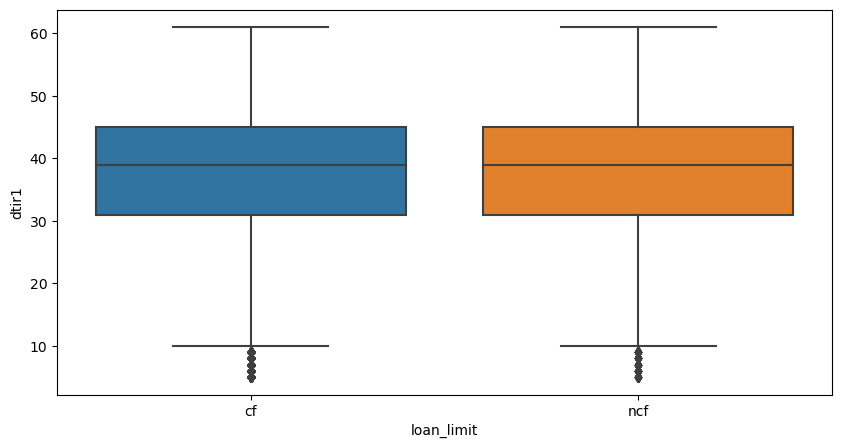

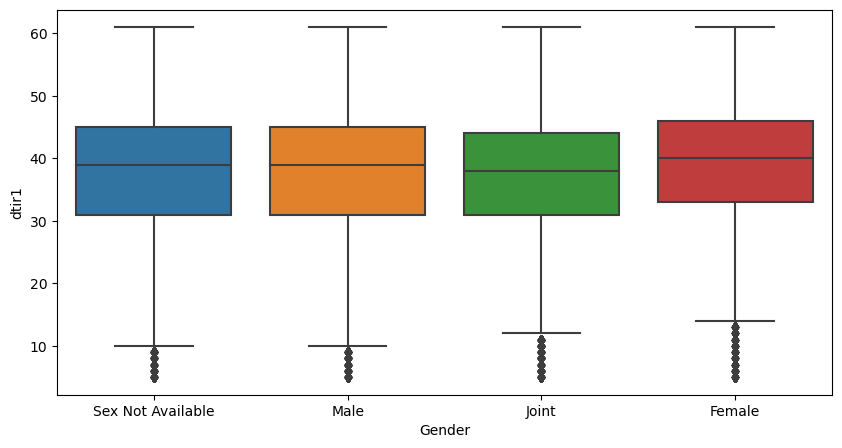

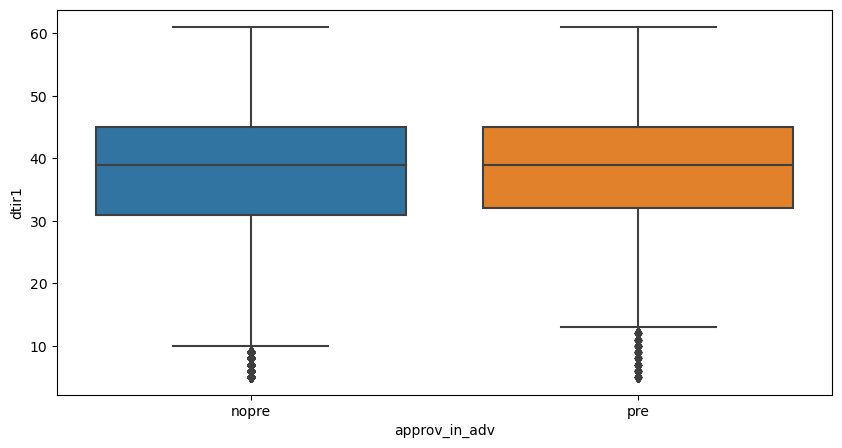

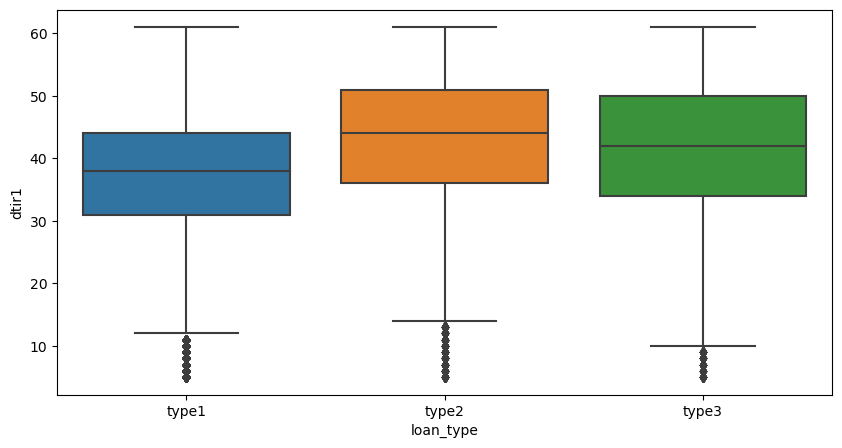

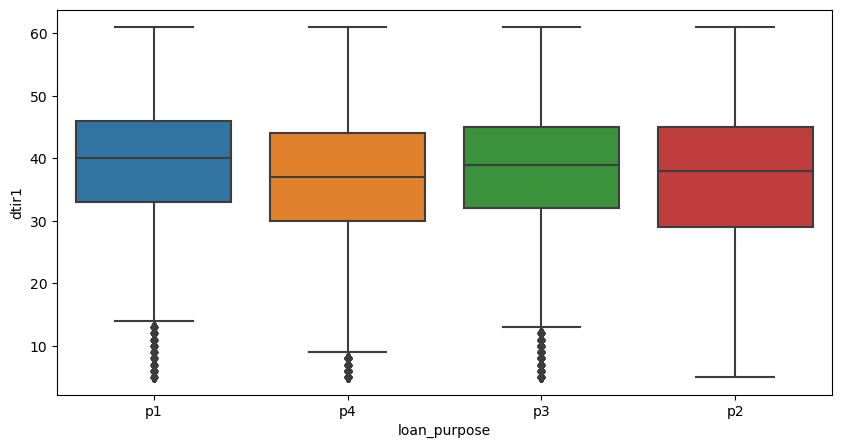

...

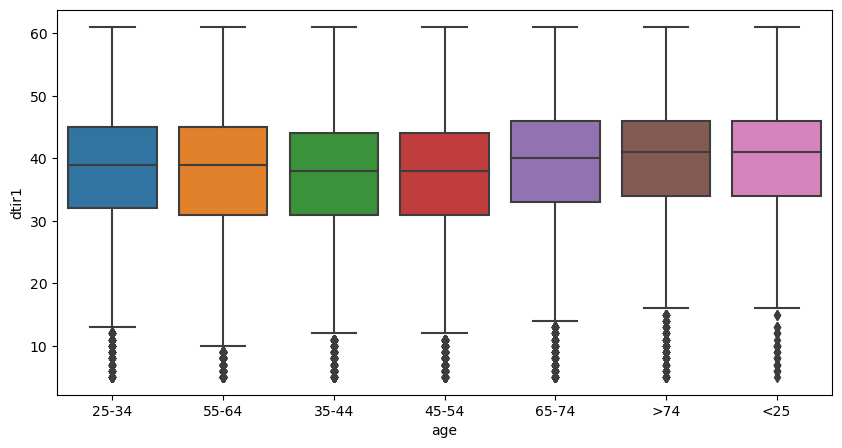

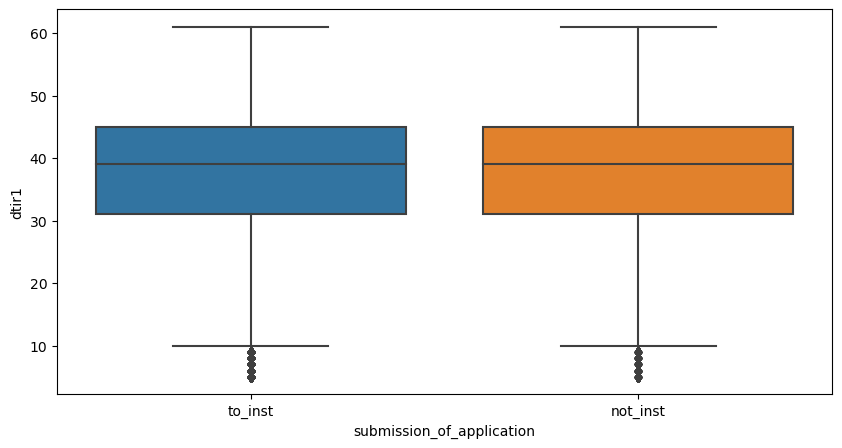

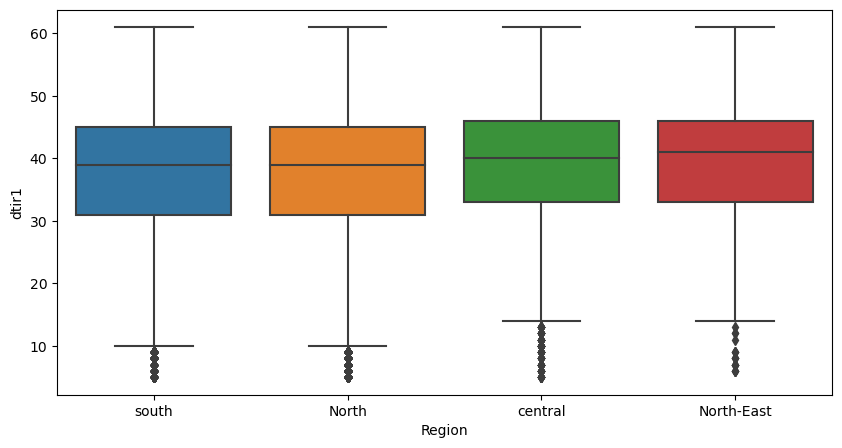

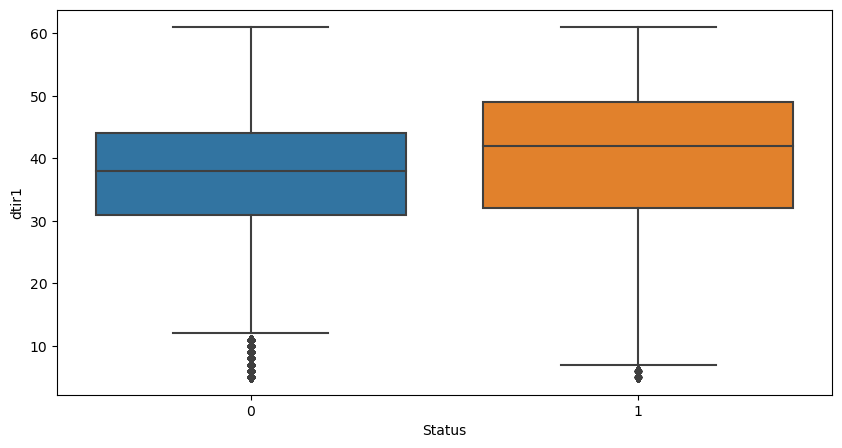

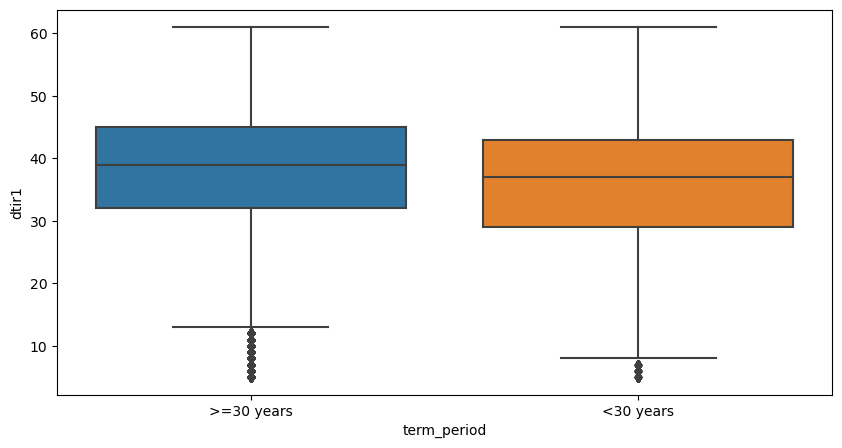

In [ ]:
for i in df1_cat.columns:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df1_cat[i], y=df1_num["dtir1"])
    plt.show()

**Interpretations**

1) Loan type 1 is having the less avg dtir1 of 38 wher as type 2 and type 3 is having 45 as dtir1

2) business comercial are having higest DTIR1 with avg dtir1 of 45.

3) the cosntruction type mh is having lowest debt of 20 and the range of mh construction type is 20 to 50 where as sb 
   construction type has 5 to 60
    
4) applicants that are secured by land is havingvery less dtier1. the avg is 35 minimum is 20 and max debt is 48

5) credit_type EQUI is having less dtir1 whcih is 20 is min and 40 is max with avg of 30

# Multi Variant Analysis

<Figure size 2000x1000 with 0 Axes>

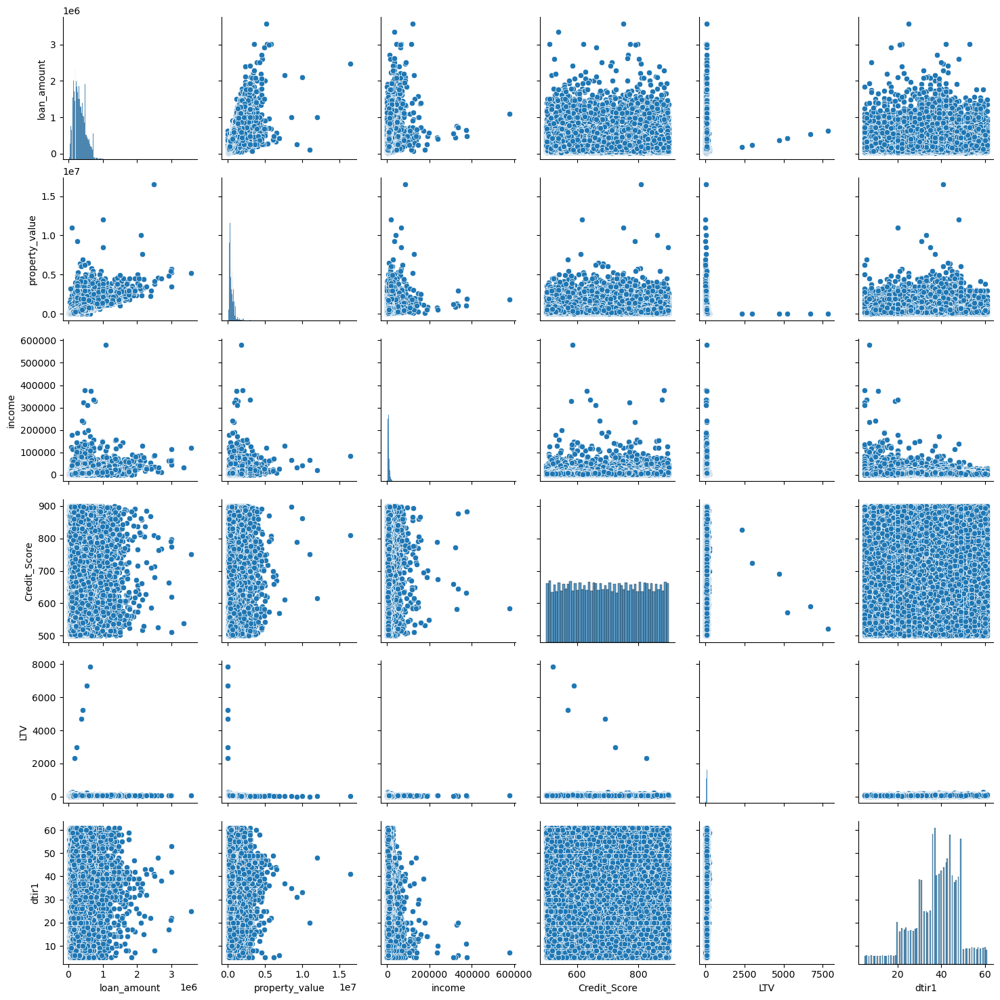

In [ ]:
plt.figure(figsize=(20, 10))
sns.pairplot(df1_num)

<AxesSubplot:>

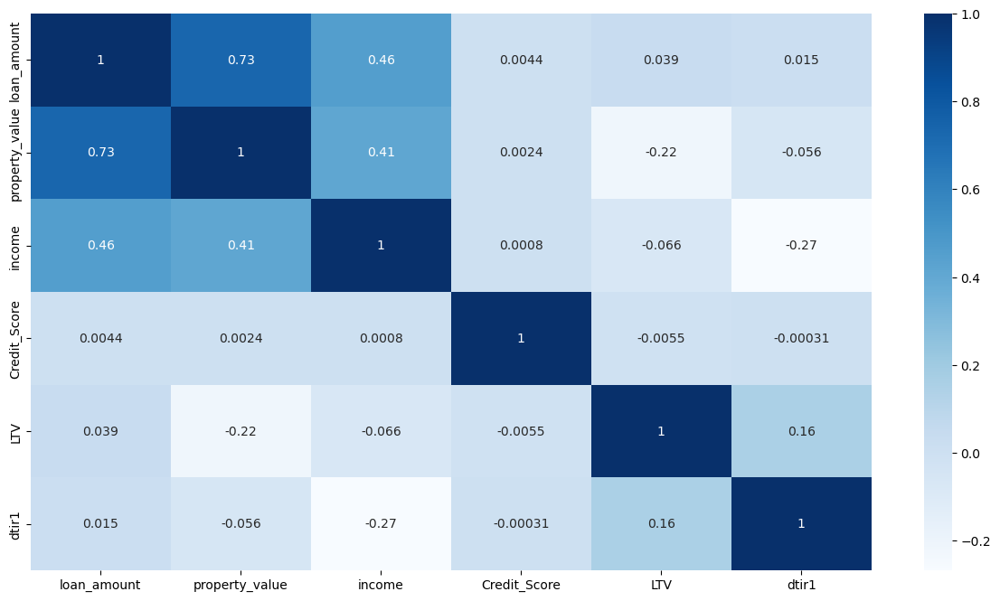

In [ ]:
plt.figure(figsize=(15, 8))
sns.heatmap(df1_num.corr(), annot=True, cmap="Blues")

**Interpretations**

1) Loan amount and  Property Values are highly correlated with 0.73% it means while any one applying for the Loan
   Loan amount and Property Value are the Key Metrics That Bank Considering
   
2) also there is slight corrleation between property value and income with 0.41% it means while applying for the loan
  bank are slighly concerned about the income and property value.even if someone with high property value and low income can
  be approved for the loan
  
3) loan amount and loan limit is also moderately correlated with 0.46% so there is slight correlation among them. bank is also 
   considering other metrics for the loan approvement 

4) columns income & loan aount, income & property value are Positive correlated 

5) LTV & Property Value and income and DTIR1 Columns are negatively correlated to each other it means 
   banks are not consiering relation between these two columns to approve the loans


# dtir1

<AxesSubplot:xlabel='dtir1', ylabel='LTV'>

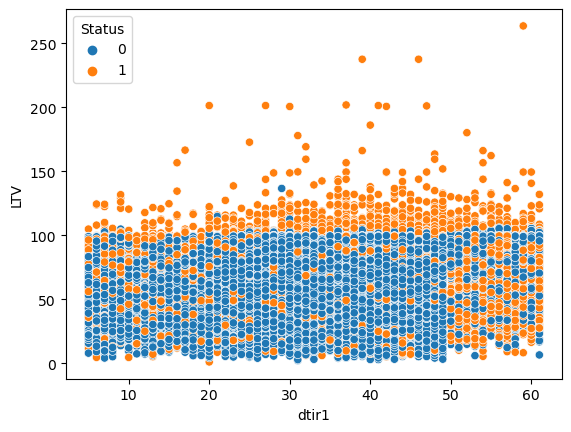

In [ ]:
sns.scatterplot(x=df1.dtir1,y=df1.LTV,hue=df1.Status)

**interpretation**

1) here we can see LTV above 100 is almost everyone getting their loan approved no matter what is their dtir1
    high dtir1 and low Ltv getting loan approved

In [ ]:
df1_num.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1'],
      dtype='object')

**LTV**

In [ ]:
df1_num_columns = ['loan_amount', 'property_value', 'income', 'Credit_Score',  'dtir1']

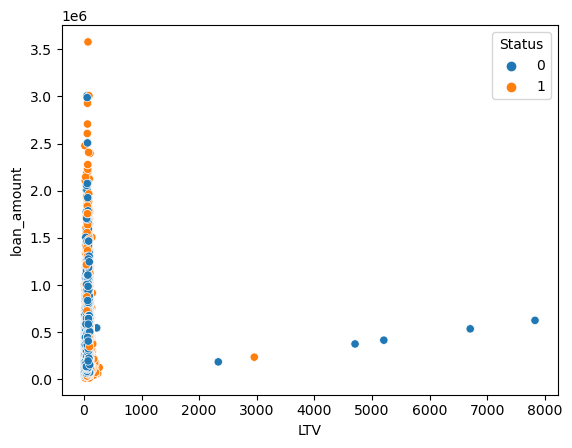

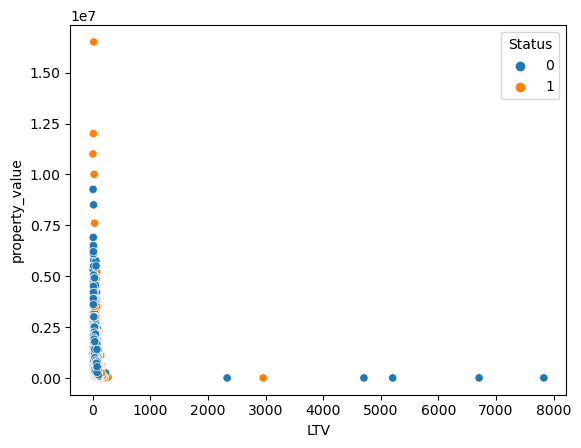

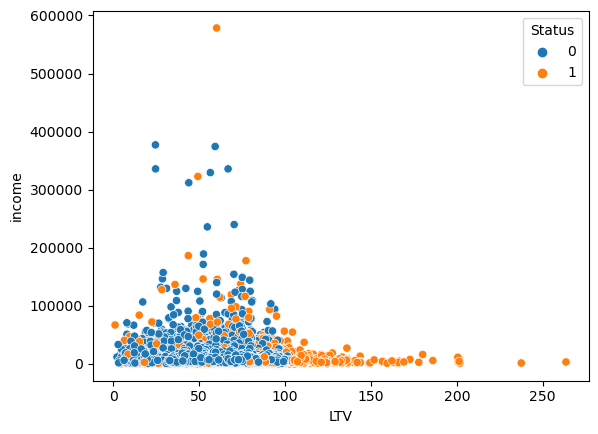

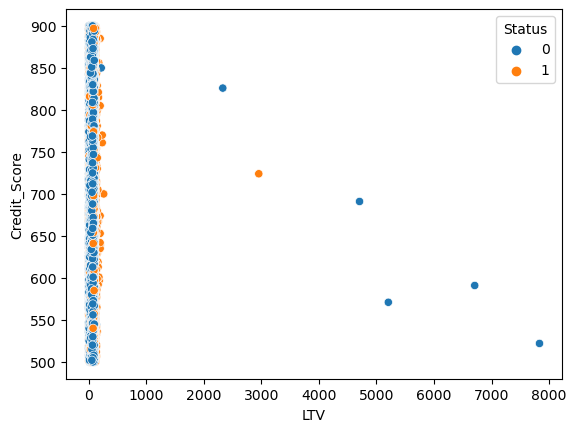

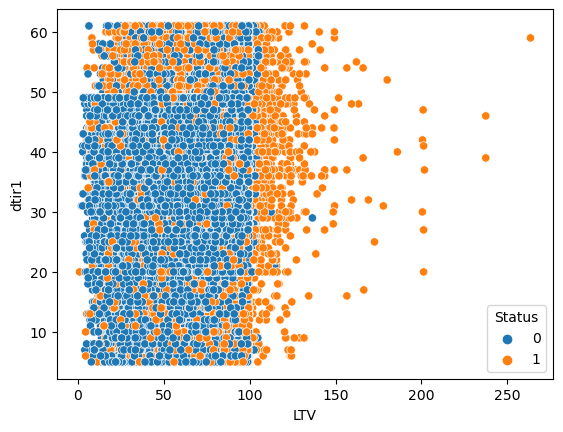

In [ ]:
for i in df1_num_columns:
    sns.scatterplot(x=df1.LTV,y=df1_num[i],hue=df1.Status)
    plt.show()

**Interpretations**


1) Bank has decline loan for the few applicants who has LTV more then 2k even for small loan_amount.

2) few applicans which have high LTV with property value 10Lakhs loan has been declined.

3) bank has approved loan for few applicants whose LTV is less then 25 and with less income. it can effect bank in long run.



**Income**

In [ ]:
df1_num_columns = ['loan_amount', 'property_value',  'Credit_Score', "LTV" , 'dtir1']

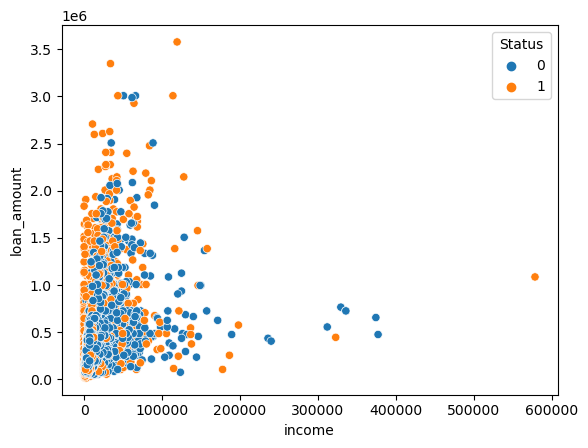

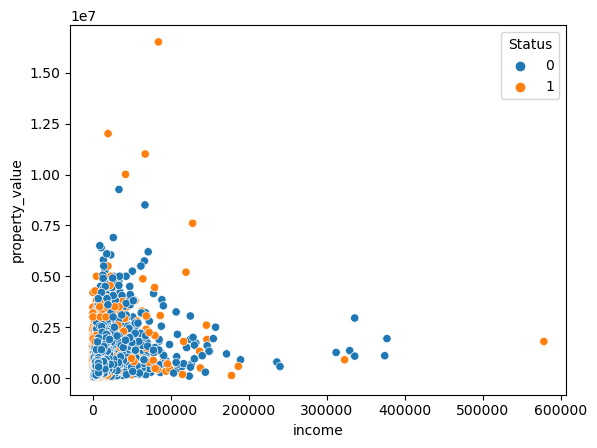

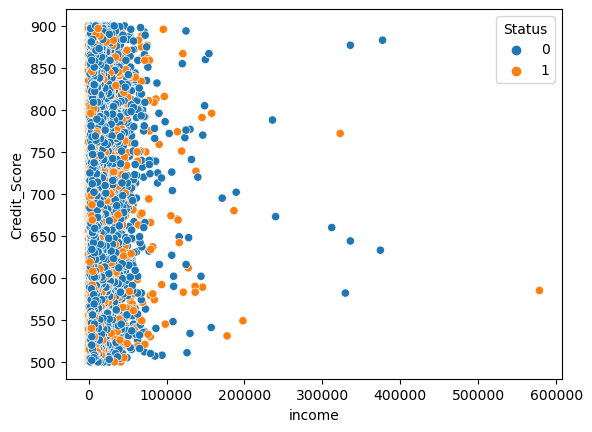

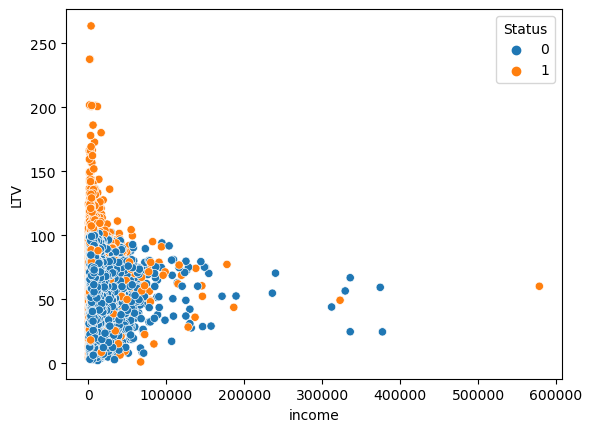

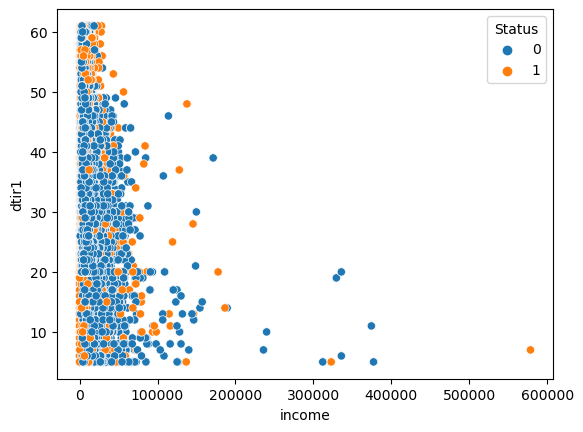

In [ ]:
for i in df1_num_columns:
    sns.scatterplot(x=df1.income,y=df1_num[i],hue=df1.Status)
    plt.show()

**Interpretations**


1) bank is approved for the loan where loan_amount is high with less income. from above 5 Lakhs with income has been approved

2) for the few applicants who has income above 1Lakh has term period of 350

3) where credit score is less then 600 with income less bank has approved loan

4) where Dtir1 is high with income less foer them bank approved loan.

<AxesSubplot:xlabel='income', ylabel='loan_amount'>

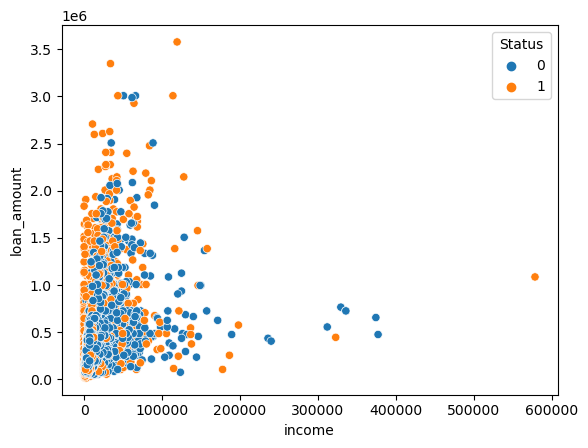

In [ ]:
sns.scatterplot(x=df1.income,y=df1_num.loan_amount,hue=df1['Status'])

**Interpretations**


1) here we can see we have lot of people with very less income get their loan approved even if loan_amount is very large
  so business has to take care of this

**property_value**

In [ ]:
df1_num_columns = ['loan_amount',  'income', 'Credit_Score', "LTV" , 'dtir1']

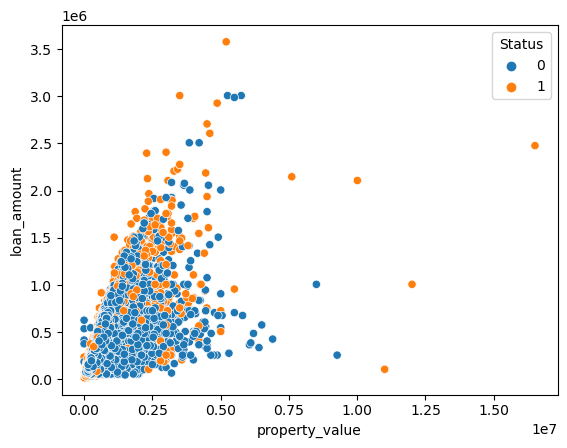

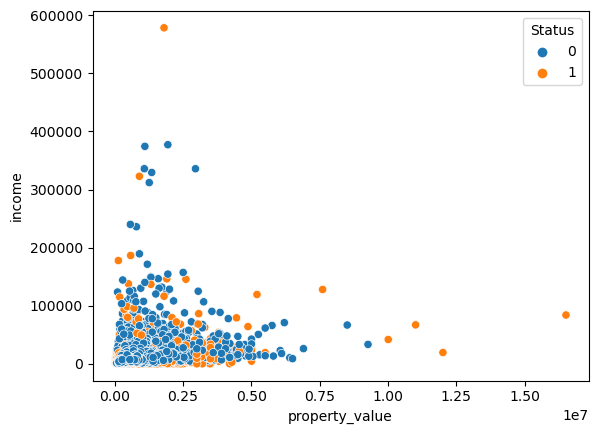

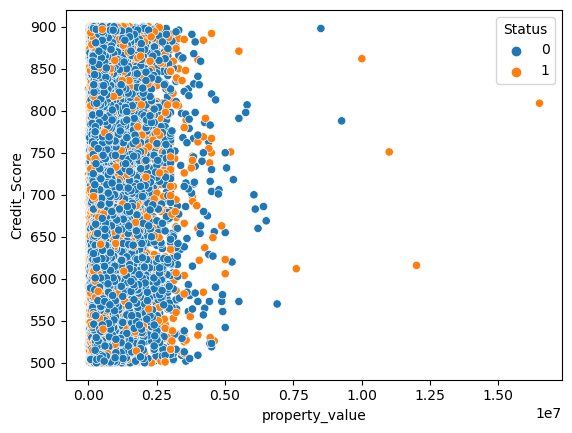

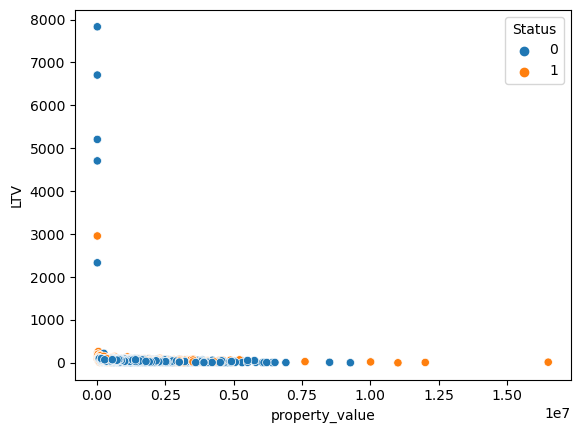

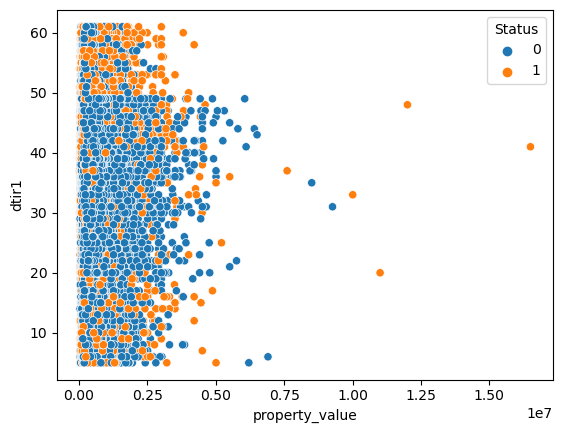

In [ ]:
for i in df1_num_columns:
    sns.scatterplot(x=df1.property_value,y=df1_num[i],hue=df1.Status)
    plt.show()

**Interpretations**


1) here we can see positive linear relationship between loan_amount and property_vslue 

2)  one thing we can notice that low loan_amount with low property_value are mostly decline ... so business have to take care of this in such kind of scenerio bank is unecessary losing business

# Business Inference 1


**lump_sum_payment**

In [ ]:
l1=pd.crosstab(df1.lump_sum_payment,df1.Status,margins=True)

l1['%decline']= (l1[0]/l1['All'])*100
l1

Status,0,1,All,%decline
lump_sum_payment,,,,
lpsm,756,2628,3384,22.340426
not_lpsm,111275,34011,145286,76.590312
All,112031,36639,148670,75.355485


In [ ]:
l2 = pd.crosstab(df1.lump_sum_payment,df1.Status,margins=True)
l2

Status,0,1,All
lump_sum_payment,,,
lpsm,756,2628,3384
not_lpsm,111275,34011,145286
All,112031,36639,148670


<AxesSubplot:xlabel='lump_sum_payment'>

<Figure size 1500x800 with 0 Axes>

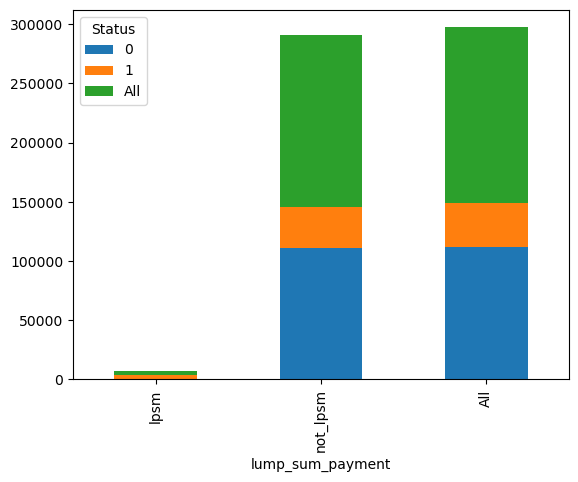

In [ ]:
plt.figure(figsize=(15,8))
l2.plot(kind="bar", stacked=True)

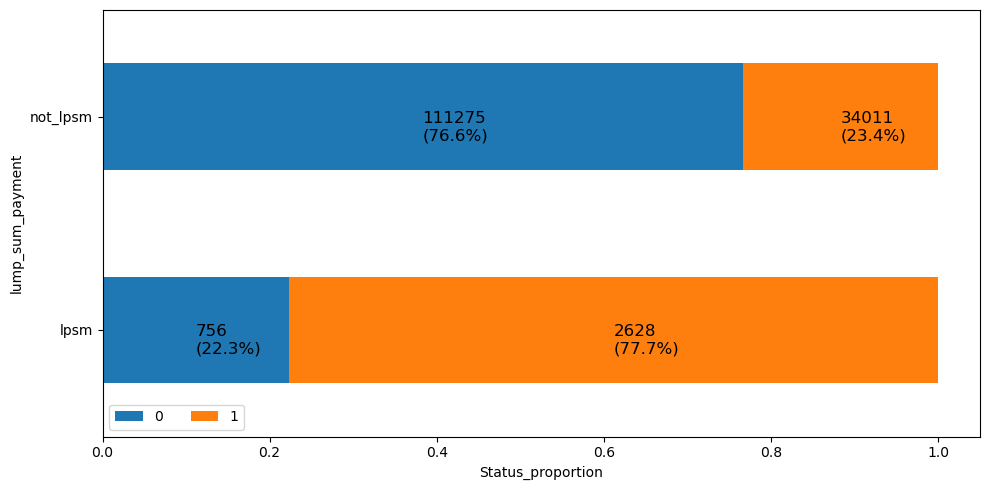

In [ ]:
cross_tab_prop = pd.crosstab(df1_cat["lump_sum_payment"], df1_cat["Status"],normalize="index")
cross_tab = pd.crosstab(df1_cat["lump_sum_payment"], df1_cat["Status"])
cross_tab
cross_tab_prop.plot(kind='barh', 
                        stacked=True,  
                        figsize=(10, 5))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("lump_sum_payment")
plt.xlabel("Status_proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)',
                 fontsize=12)
plt.tight_layout()

In [ ]:
df1_cat["lump_sum_payment"].value_counts()

not_lpsm    145286
lpsm          3384
Name: lump_sum_payment, dtype: int64

1. bank has 3384 applicants who applying for lump_sum amount and out of these applicants bank has approved 77.7% of loans

bank is approving to the loan for those who are seeking for lumpsum amount. while if bank approve loan for such applicants there 
is a possibility  default can happen so bank should consider this issue and should be more catious while approving loan for such 
applicants

# Business Inference 2

**Credit_Score**

<AxesSubplot:xlabel='dtir1', ylabel='Credit_Score'>

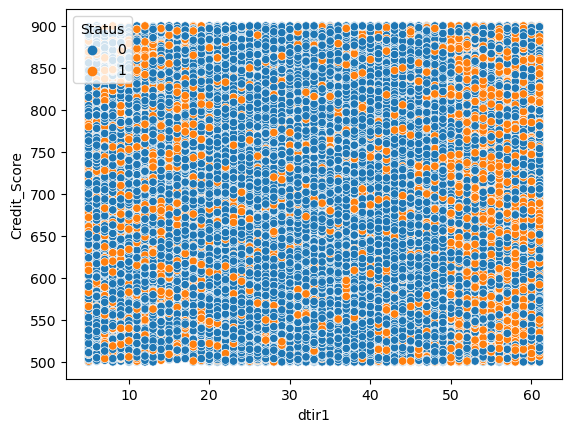

In [ ]:
sns.scatterplot(x=df1.dtir1,y=df1.Credit_Score,hue=df1.Status)

2. we can see bank is approving loan with high dtir1(debt to income ratio) no matter what is their credit Score .


# Business Inference 3

**dtir1**

<AxesSubplot:xlabel='dtir1', ylabel='property_value'>

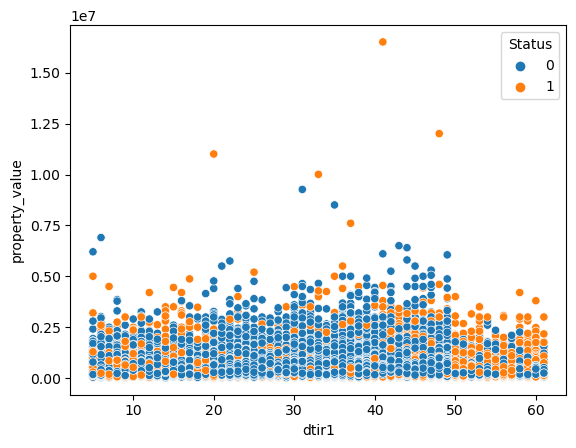

In [ ]:
sns.scatterplot(x=df1.dtir1,y=df1.property_value,hue=df1.Status)

 And we can also see loan is approved for few people with low property value and high dtir1(debt to income ratio)
   bank have to take care of them.

# Business Inference 4 

<AxesSubplot:xlabel='dtir1', ylabel='LTV'>

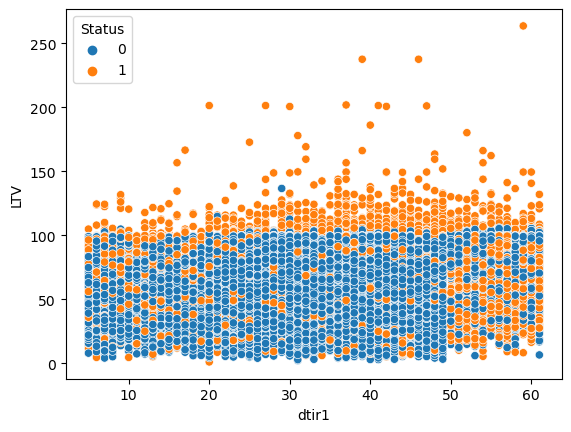

In [ ]:
sns.scatterplot(x=df1.dtir1,y=df1.LTV,hue=df1.Status)

4. Another thing like LTV above 100 is almost everyone getting their loan approved no matter what is their dtir1
   high dtir1 and low Ltv  also getting loan approved

# Business Inference 5

<AxesSubplot:xlabel='income', ylabel='loan_amount'>

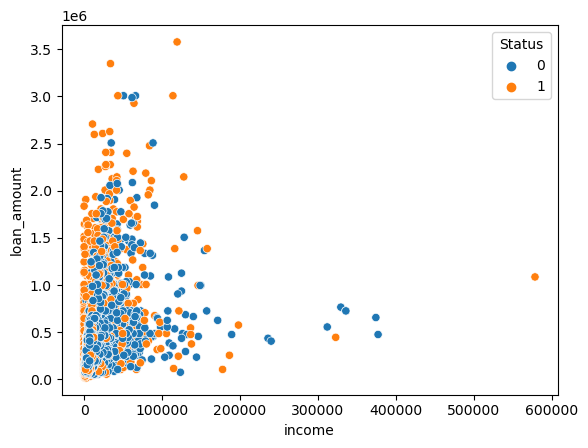

In [ ]:
sns.scatterplot(x=df1.income,y=df1_num.loan_amount,hue=df1['Status'])

   
5. We can see that lot of people with very less income get their loan approved even if loan_amount is very large bank need to 
   need to figure out and take actions to avoid such things

# Business Inference 6 

<AxesSubplot:xlabel='property_value', ylabel='loan_amount'>

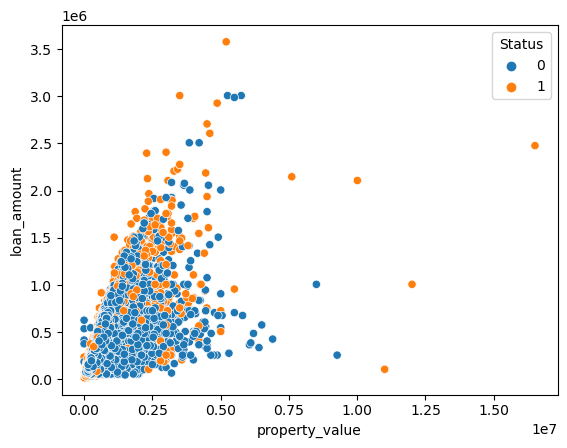

In [ ]:
sns.scatterplot(x=df1.property_value,y=df1.loan_amount,hue=df1.Status)

6.  Their is positive linear relationship between loan_amount and property_vslue 
    one thing we can notice that applicant with low loan_amount having low property_value are mostly decline
    so business have to take care of this in  such kind of scenerio bank is unescessary losing business they can aprove small 
    amount of loans

# Business Inference 

1. lpsm are declined very less, there is more risk associated with it. so bank have to take care of this or look into this matter.

2. we can see bank is approving loan with high dtir1(debt to income ratio) no matter what is their credit Score of gender joint.

3. And we can also see loan is approved for few people with low property value and high dtir1(debt to income ratio)
   bank have to take care of them.
   
4. Another thing like LTV above 100 is almost everyone getting their loan approved no matter what is their dtir1
   high dtir1 and low Ltv  also getting loan approved
   
5. We can see that lot of people with very less income get their loan approved even if loan_amount is very large
   need to figure out
   
6.  Their is positive linear relationship between loan_amount and property_vslue 
    one thing we can notice that applicant with low loan_amount having low property_value are mostly decline
    so business have to take care of this in in such kind of scenerio bank is unescessary losing business

In [ ]:
df1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,income,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,not_neg,...,1740.0,EXP,758,25-34,to_inst,98.728814,south,1,45.0,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,not_neg,...,4980.0,EQUI,552,55-64,to_inst,NaN,North,1,NaN,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,neg_amm,...,9480.0,EXP,834,35-44,to_inst,80.019685,south,0,46.0,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,not_neg,...,11880.0,EXP,587,45-54,not_inst,69.376900,North,0,42.0,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,not_neg,...,10440.0,CRIF,602,25-34,not_inst,91.886544,North,0,39.0,>=30 years


In [ ]:
df1.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'loan_amount', 'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'property_value', 'occupancy_type', 'total_units', 'income',
       'credit_type', 'Credit_Score', 'age', 'submission_of_application',
       'LTV', 'Region', 'Status', 'dtir1', 'term_period'],
      dtype='object')

# Missing Value Imputation

In [ ]:
df1.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'loan_amount', 'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'property_value', 'occupancy_type', 'total_units', 'income',
       'credit_type', 'Credit_Score', 'age', 'submission_of_application',
       'LTV', 'Region', 'Status', 'dtir1', 'term_period'],
      dtype='object')

In [ ]:
df1=df1.astype({'Status':'object'})

In [ ]:
df1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,income,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,not_neg,...,1740.0,EXP,758,25-34,to_inst,98.728814,south,1,45.0,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,not_neg,...,4980.0,EQUI,552,55-64,to_inst,NaN,North,1,NaN,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,neg_amm,...,9480.0,EXP,834,35-44,to_inst,80.019685,south,0,46.0,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,not_neg,...,11880.0,EXP,587,45-54,not_inst,69.376900,North,0,42.0,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,not_neg,...,10440.0,CRIF,602,25-34,not_inst,91.886544,North,0,39.0,>=30 years


In [ ]:
df1.dtypes

loan_limit                    object
Gender                        object
approv_in_adv                 object
loan_type                     object
loan_purpose                  object
Credit_Worthiness             object
open_credit                   object
business_or_commercial        object
loan_amount                    int64
Neg_ammortization             object
interest_only                 object
lump_sum_payment              object
property_value               float64
occupancy_type                object
total_units                   object
income                       float64
credit_type                   object
Credit_Score                   int64
age                           object
submission_of_application     object
LTV                          float64
Region                        object
Status                        object
dtir1                        float64
term_period                   object
dtype: object

In [ ]:
df1_cat = df1.select_dtypes(include="object")
df1_num = df1.select_dtypes(include=np.number)

In [ ]:
df1.isnull().sum()[df1.isnull().sum()>0]/df1.shape[0]*100

loan_limit                    2.249277
approv_in_adv                 0.610749
loan_purpose                  0.090133
Neg_ammortization             0.081388
property_value               10.155378
income                        6.154571
age                           0.134526
submission_of_application     0.134526
LTV                          10.155378
dtir1                        16.224524
dtype: float64

In [ ]:
#Null Values in categorical columns
df1_cat.isnull().sum()[df1.isnull().sum()>0]/df1.shape[0]*100

loan_limit                   2.249277
approv_in_adv                0.610749
loan_purpose                 0.090133
Neg_ammortization            0.081388
age                          0.134526
submission_of_application    0.134526
dtype: float64

In [ ]:
#Null Values in numerical columns
df1_num.isnull().sum()[df1.isnull().sum()>0]/df1.shape[0]*100

property_value    10.155378
income             6.154571
LTV               10.155378
dtir1             16.224524
dtype: float64

In [ ]:
df1_cat.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'occupancy_type', 'total_units', 'credit_type', 'age',
       'submission_of_application', 'Region', 'Status', 'term_period'],
      dtype='object')

In [ ]:
df1_cat_col=['loan_limit', 'approv_in_adv', 'loan_purpose', 'Neg_ammortization',
       'age', 'submission_of_application']

In [ ]:
for i in df1_cat_col:
    df1[i].fillna(df1[i].mode()[0], inplace=True)

In [ ]:
df2_mod_num=['property_value','income','LTV']
for i in df2_mod_num:
    df1[i].fillna(df1[i].median(),inplace=True)

In [ ]:
df1_num.isnull().sum()[df1.isnull().sum()>0]
#so we have null values in DTIR1 COLUMN ONLY

dtir1    24121
dtype: int64

In [ ]:
df1_num=df1.select_dtypes(include=np.number)
df1_cat=df1.select_dtypes(include='object')

In [ ]:
df1_num.head(2)

,loan_amount,property_value,income,Credit_Score,LTV,dtir1
0,116500,118000.0,1740.0,758,98.728814,45.0
1,206500,418000.0,4980.0,552,75.135870,NaN


In [ ]:
from sklearn.impute import KNNImputer
import pandas as pd

# Create an instance of KNNImputer
imputer = KNNImputer()
df_imputed = imputer.fit_transform(df1[["dtir1"]])

In [ ]:
pd.DataFrame(df_imputed, columns=["dtir1"]).isnull().sum()

dtir1    0
dtype: int64

In [ ]:
df1["dtir1"]=pd.DataFrame(df_imputed)
df1.isnull().sum().sum()

0

<AxesSubplot:xlabel='dtir1', ylabel='Density'>

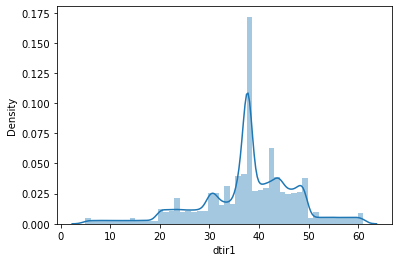

In [ ]:
sns.distplot(df1["dtir1"])

<AxesSubplot:xlabel='dtir1', ylabel='Density'>

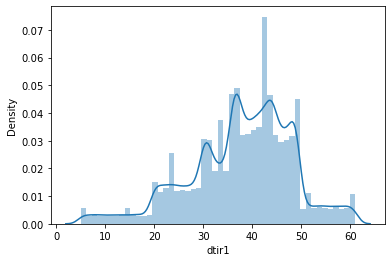

In [ ]:
sns.distplot(df["dtir1"])

from univariant for the DTIR1 column  we can see that our data distribution is almost same before imputing 
null values and after imputing null values.

In [ ]:
df1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,income,credit_type,Credit_Score,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,not_neg,...,1740.0,EXP,758,25-34,to_inst,98.728814,south,1,45.000000,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,not_neg,...,4980.0,EQUI,552,55-64,to_inst,75.135870,North,1,37.732932,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,neg_amm,...,9480.0,EXP,834,35-44,to_inst,80.019685,south,0,46.000000,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,not_neg,...,11880.0,EXP,587,45-54,not_inst,69.376900,North,0,42.000000,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,not_neg,...,10440.0,CRIF,602,25-34,not_inst,91.886544,North,0,39.000000,>=30 years


In [ ]:
(df1.isnull().sum()/df1.shape[0])*100
# there is no null values now

loan_limit                   0.0
Gender                       0.0
approv_in_adv                0.0
loan_type                    0.0
loan_purpose                 0.0
Credit_Worthiness            0.0
open_credit                  0.0
business_or_commercial       0.0
loan_amount                  0.0
Neg_ammortization            0.0
interest_only                0.0
lump_sum_payment             0.0
property_value               0.0
occupancy_type               0.0
total_units                  0.0
income                       0.0
credit_type                  0.0
Credit_Score                 0.0
age                          0.0
submission_of_application    0.0
LTV                          0.0
Region                       0.0
Status                       0.0
dtir1                        0.0
term_period                  0.0
dtype: float64

In [ ]:
df1.dtypes

loan_limit                    object
Gender                        object
approv_in_adv                 object
loan_type                     object
loan_purpose                  object
Credit_Worthiness             object
open_credit                   object
business_or_commercial        object
loan_amount                    int64
Neg_ammortization             object
interest_only                 object
lump_sum_payment              object
property_value               float64
occupancy_type                object
total_units                   object
income                       float64
credit_type                   object
Credit_Score                   int64
age                           object
submission_of_application     object
LTV                          float64
Region                        object
Status                        object
dtir1                        float64
term_period                   object
dtype: object

In [ ]:
df1.Status=df1.Status.astype('object')

# Univariant Analysis  After Imputation

61.0


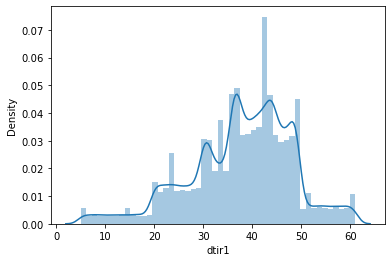

In [ ]:
sns.distplot(df["dtir1"])
print(df["dtir1"].max())

61.0


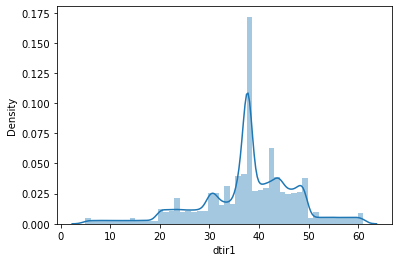

In [ ]:
sns.distplot(df1["dtir1"])
print(df1["dtir1"].max())

In [ ]:
df_loan=df1.copy()

**Loan Amount** 

<AxesSubplot:xlabel='loan_amount', ylabel='Density'>

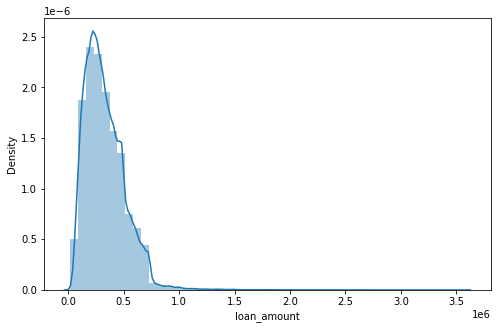

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(df_loan["loan_amount"])

**property_value**

<AxesSubplot:xlabel='property_value', ylabel='Density'>

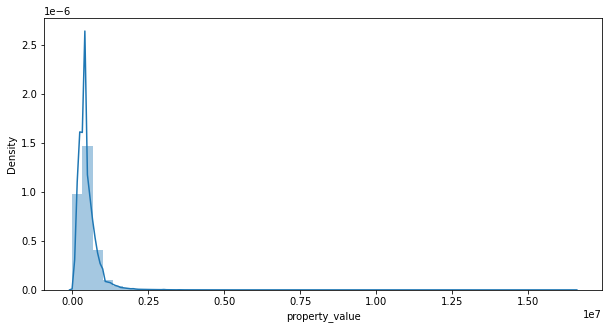

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df_loan["property_value"])

**income**

<AxesSubplot:xlabel='income', ylabel='Density'>

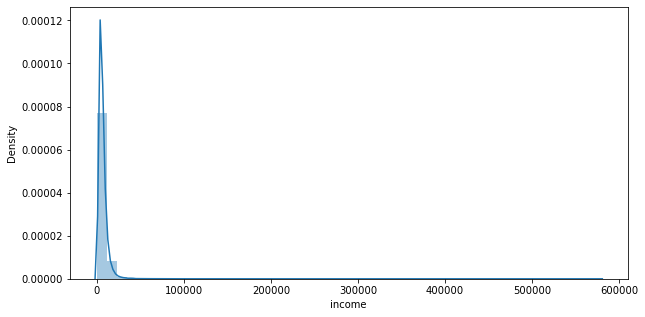

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df_loan["income"])

**Credit_Score**

<AxesSubplot:xlabel='Credit_Score', ylabel='Density'>

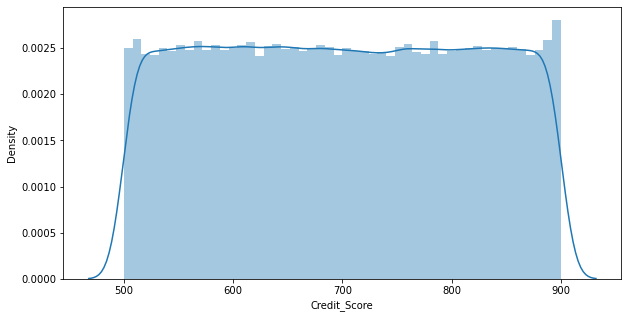

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df_loan.Credit_Score)

**LTV**

<AxesSubplot:xlabel='LTV', ylabel='Density'>

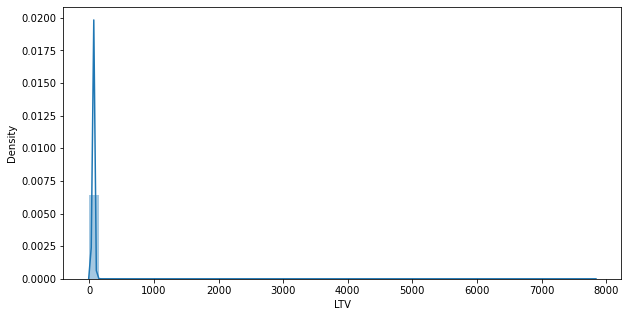

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df_loan["LTV"])

**Status**

<AxesSubplot:xlabel='Status', ylabel='Density'>

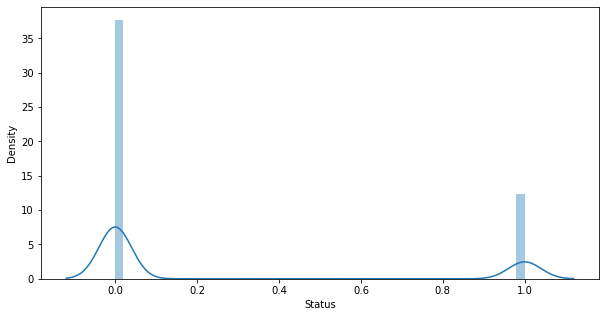

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df_loan["Status"])

**dtir1**

<AxesSubplot:xlabel='dtir1', ylabel='Density'>

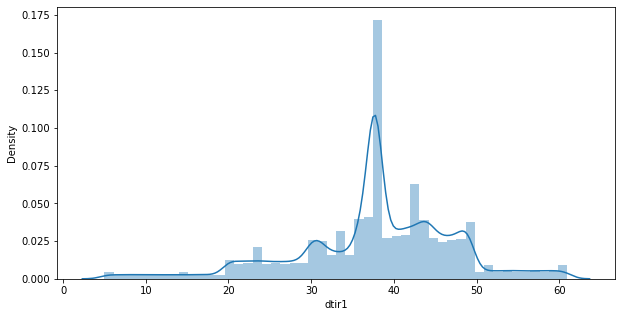

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(df_loan["dtir1"])

# Univariant Analysis For Categorical Columns After imputation

**loan amount**

<AxesSubplot:xlabel='loan_limit', ylabel='count'>

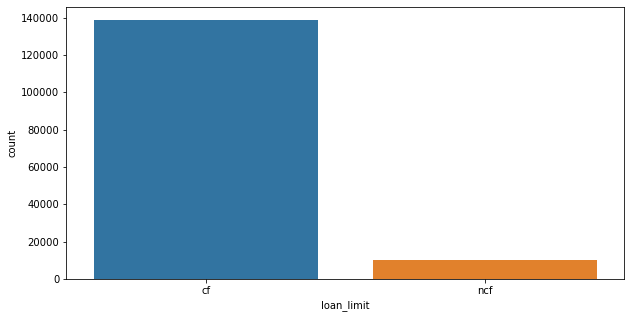

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["loan_limit"])

**Gender**

<AxesSubplot:xlabel='Gender', ylabel='count'>

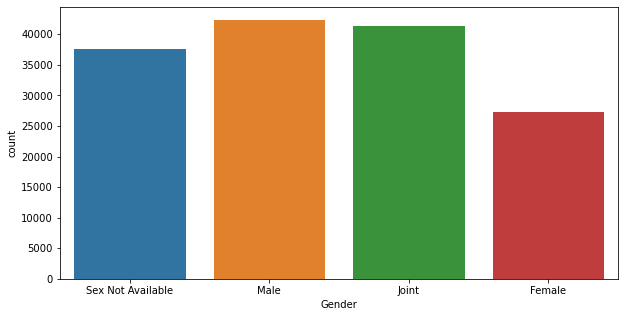

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["Gender"])

**approv_in_adv**

<AxesSubplot:xlabel='approv_in_adv', ylabel='count'>

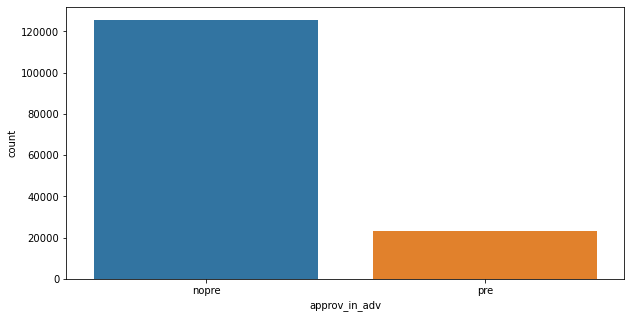

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["approv_in_adv"])

**loan_type**

<AxesSubplot:xlabel='loan_type', ylabel='count'>

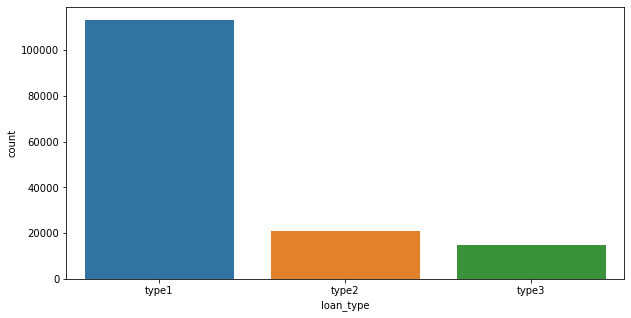

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["loan_type"])

**loan_purpose**

<AxesSubplot:xlabel='loan_purpose', ylabel='count'>

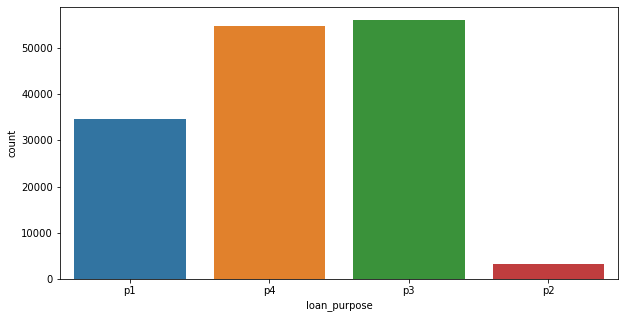

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["loan_purpose"])

**Credit_Worthiness**

<AxesSubplot:xlabel='Credit_Worthiness', ylabel='count'>

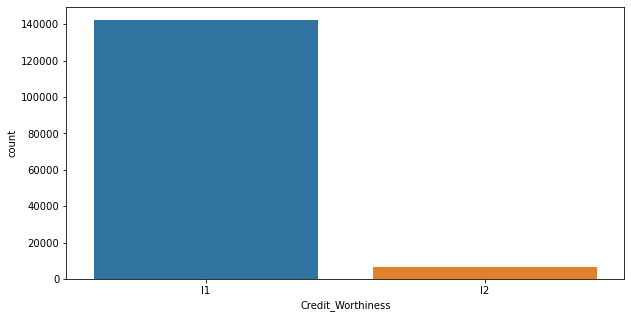

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["Credit_Worthiness"])

**open_credit**

<AxesSubplot:xlabel='open_credit', ylabel='count'>

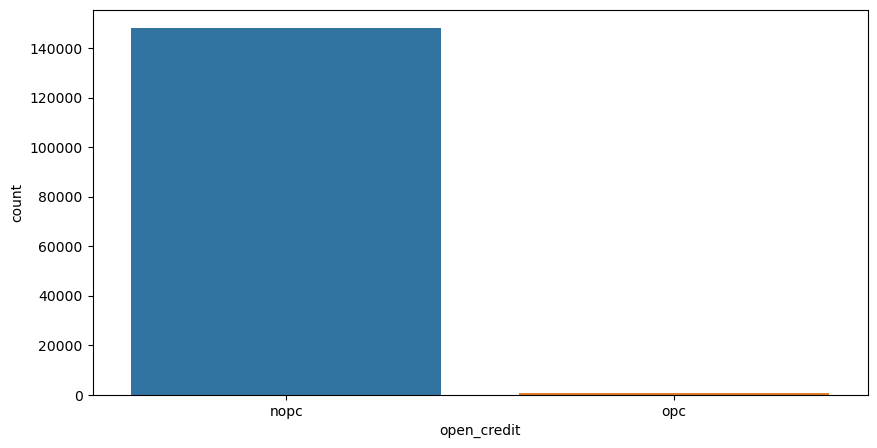

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["open_credit"])

**Gender**

<AxesSubplot:xlabel='Gender', ylabel='count'>

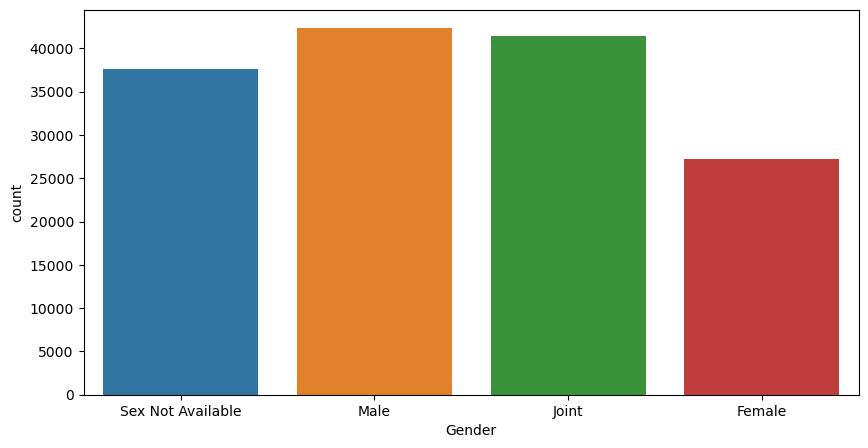

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["Gender"])

**business_or_commercial**

<AxesSubplot:xlabel='business_or_commercial', ylabel='count'>

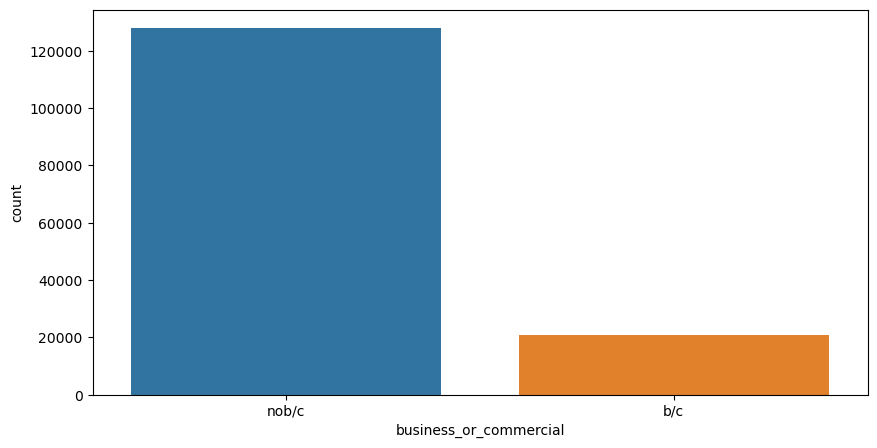

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["business_or_commercial"])

**Neg_ammortization**

<AxesSubplot:xlabel='Neg_ammortization', ylabel='count'>

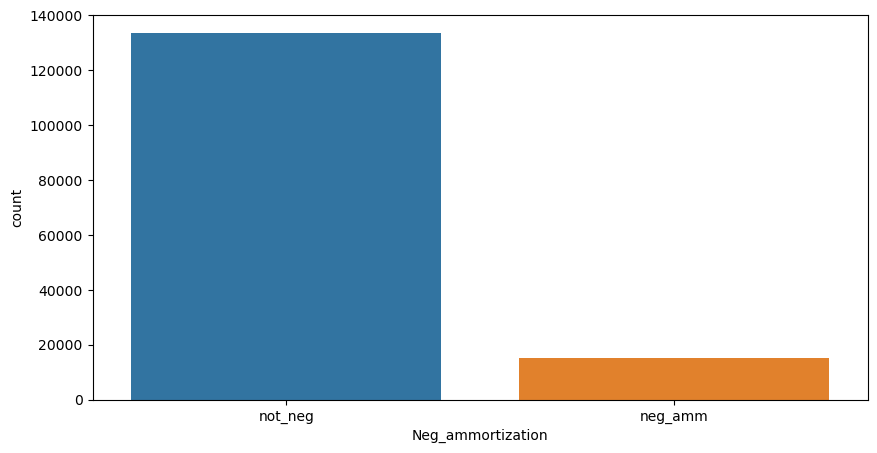

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["Neg_ammortization"])

**interest_only**

<AxesSubplot:xlabel='interest_only', ylabel='count'>

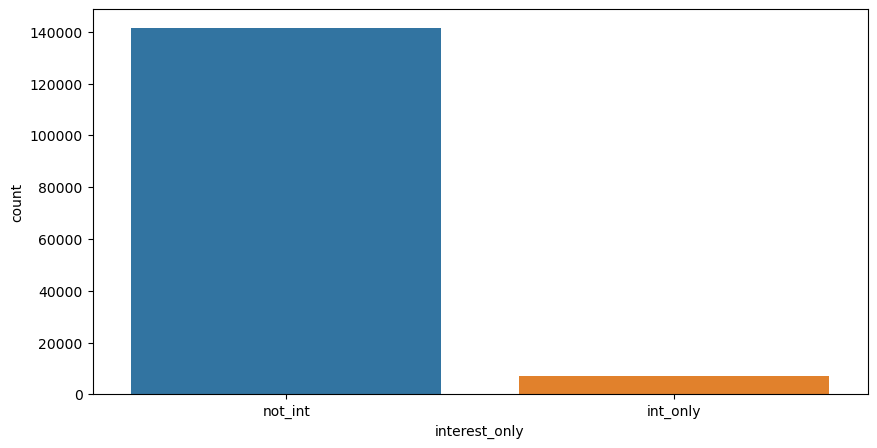

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["interest_only"])

**lump_sum_payment**

<AxesSubplot:xlabel='lump_sum_payment', ylabel='count'>

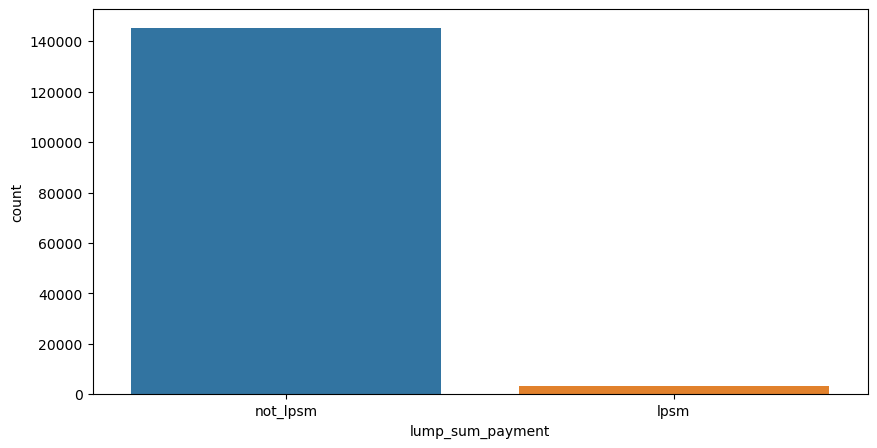

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["lump_sum_payment"])

**construction_type**

**occupancy_type**

<AxesSubplot:xlabel='occupancy_type', ylabel='count'>

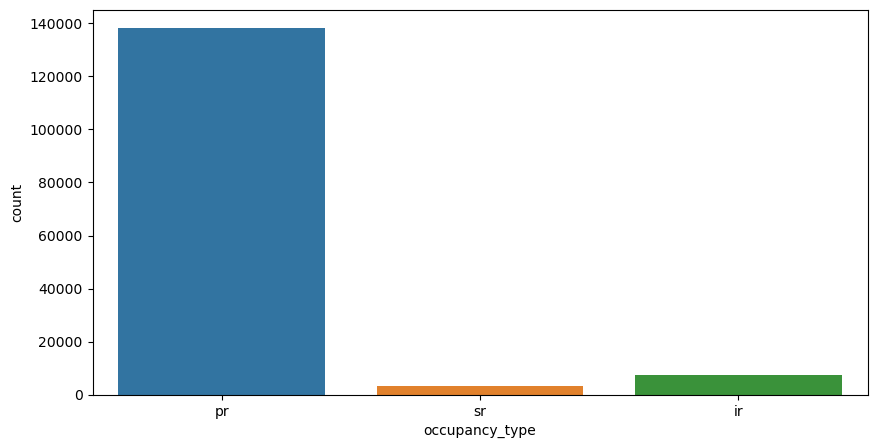

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["occupancy_type"])

**total_units**

<AxesSubplot:xlabel='total_units', ylabel='count'>

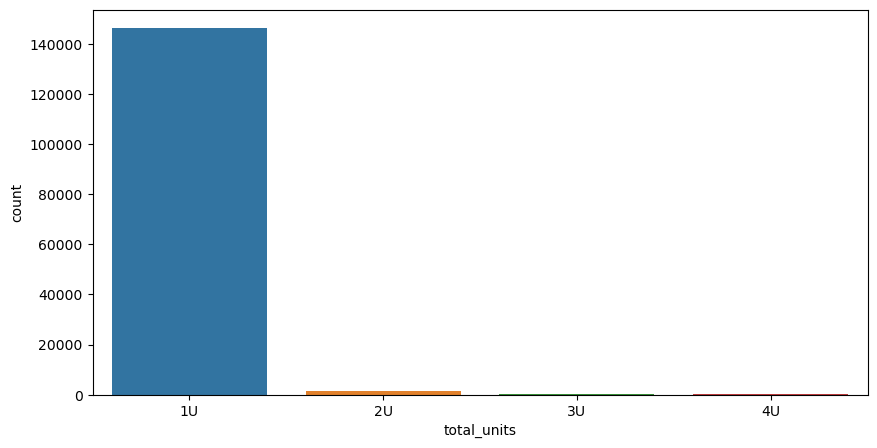

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["total_units"])

**credit_type**

<AxesSubplot:xlabel='credit_type', ylabel='count'>

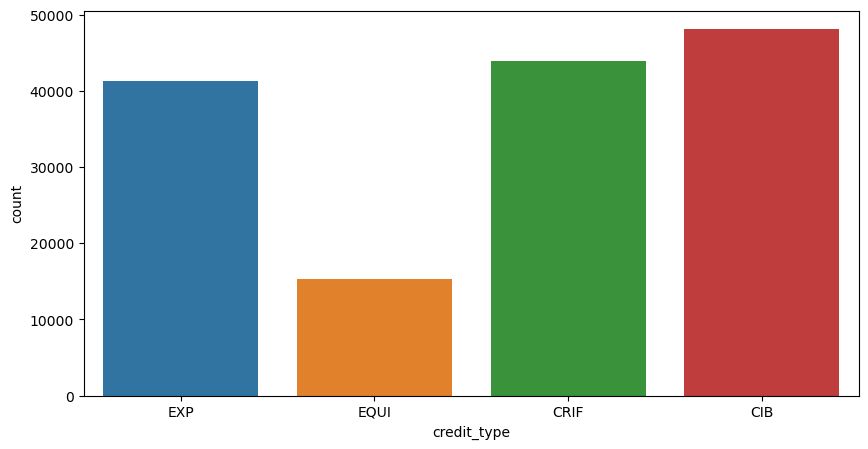

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["credit_type"])

**co-applicant_credit_type**

**age**

<AxesSubplot:xlabel='age', ylabel='count'>

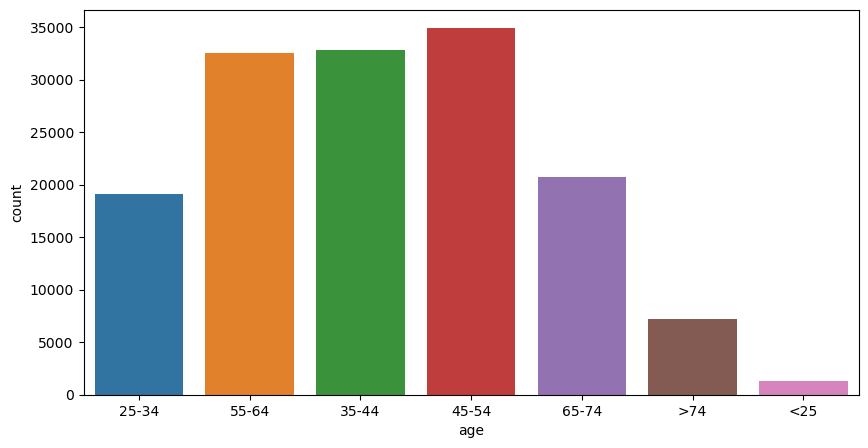

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["age"])

**submission_of_application**

<AxesSubplot:xlabel='submission_of_application', ylabel='count'>

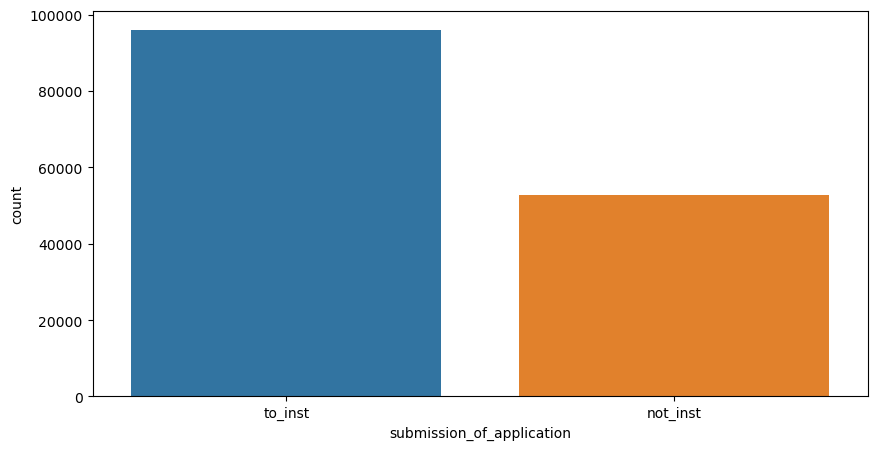

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["submission_of_application"])

**Region**

<AxesSubplot:xlabel='Region', ylabel='count'>

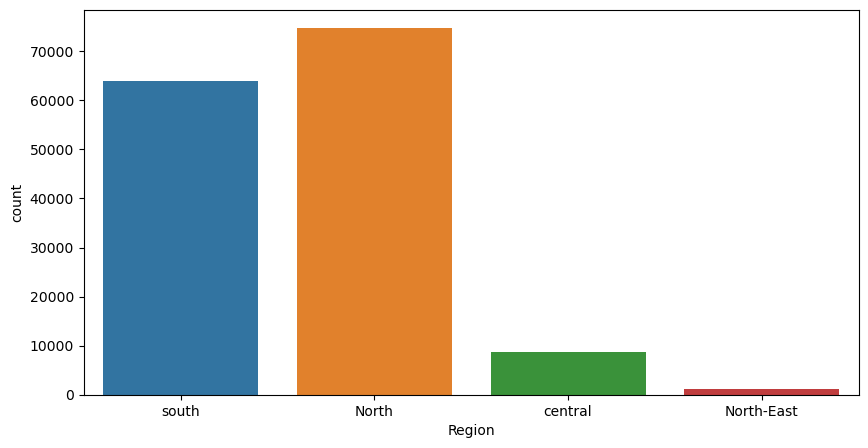

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(df_loan["Region"])

# Observation

 After imputation both Numerical columns and Categorical Columns data distribution not changed

###### ERROR AND EXTREME VALUES

In [ ]:
df1_num= df1.select_dtypes(np.number)

In [ ]:
df1_num.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1'],
      dtype='object')

In [ ]:
for i in df1_num:
    print(i, (df1[i].skew()))

loan_amount 1.6669980938622415
property_value 4.872329849772882
income 17.84499837976238
Credit_Score 0.004766756957725898
LTV 127.16103792313311
dtir1 -0.6025021821449376


In [ ]:
import scipy
from scipy import stats

###### 'loan_amount'

In [ ]:
df1[df1.loan_amount==0].loan_amount.count()

0

In [ ]:
df1[df1.loan_amount<0].loan_amount.count()

0

In [ ]:
df1["loan_amount"]=scipy.stats.boxcox(df1.loan_amount)[0]

<AxesSubplot:ylabel='Density'>

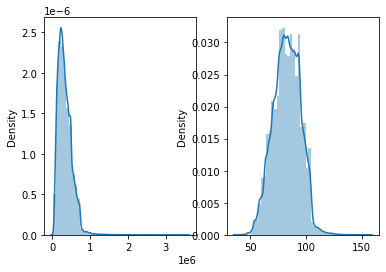

In [ ]:
fig, ax = plt.subplots(1, 2)

sns.distplot(x=df.loan_amount,kde=True,ax=ax[0])
sns.distplot(x=scipy.stats.boxcox(df1.loan_amount)[0],kde=True,ax=ax[1])

In [ ]:
df1.loan_amount.skew()

-0.006243432075553209

**Property Value**

<AxesSubplot:ylabel='Density'>

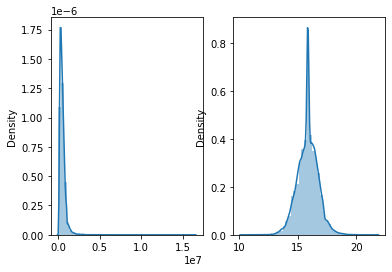

In [ ]:
fig, ax = plt.subplots(1, 2)

sns.distplot(x=df.property_value,kde=True,ax=ax[0])
sns.distplot(x=scipy.stats.boxcox(df1.property_value)[0],kde=True,ax=ax[1])

In [ ]:
df1.property_value=scipy.stats.boxcox(df1.property_value)[0]

In [ ]:
df1.property_value.skew()

0.0048731787261314125

###### income

In [ ]:
df1[df1.income==0].shape[0]

1260

In [ ]:
df1[df1.income<0].shape[0]

0

In [ ]:
df1.income=df1.income+0.0000001

<AxesSubplot:ylabel='Density'>

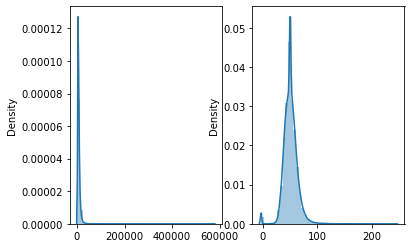

In [ ]:
fig, ax = plt.subplots(1, 2)

sns.distplot(x=df.income,kde=True,ax=ax[0])
sns.distplot(x=scipy.stats.boxcox(df1.income)[0],kde=True,ax=ax[1])

In [ ]:
df1.income=scipy.stats.boxcox(df1.income)[0]

In [ ]:
df1.income.skew()

0.3255434165399822

###### Credit Value

In [ ]:
df1.Credit_Score.describe().T

count    148670.000000
mean        699.789103
std         115.875857
min         500.000000
25%         599.000000
50%         699.000000
75%         800.000000
max         900.000000
Name: Credit_Score, dtype: float64

###### LTV

In [ ]:
df1[df1.LTV==0].shape[0]

0

In [ ]:
df1[df1.LTV<0].shape[0]

0

<AxesSubplot:ylabel='Density'>

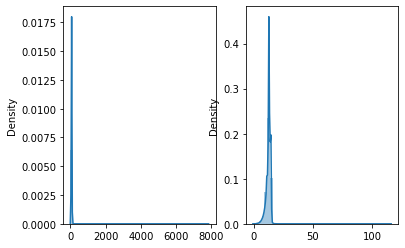

In [ ]:
fig, ax = plt.subplots(1, 2)

sns.distplot(x=df.LTV,kde=True,ax=ax[0])
sns.distplot(x=scipy.stats.boxcox(df1.LTV)[0],kde=True,ax=ax[1])

In [ ]:
df1.LTV=scipy.stats.boxcox(df1.LTV)[0]

In [ ]:
df1.LTV.skew()

2.0829788822055306

###### dtir1

In [ ]:
df1[df1.dtir1==0].shape[0]

0

In [ ]:
df1[df1.dtir1<0].dtir1

Series([], Name: dtir1, dtype: float64)

In [ ]:
df1.dtir1[df1.dtir1<=0]=df1.dtir1[df1.dtir1>0].min()

<AxesSubplot:ylabel='Density'>

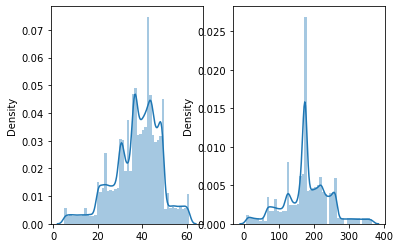

In [ ]:
fig, ax = plt.subplots(1, 2)

sns.distplot(x=df.dtir1,kde=True,ax=ax[0])
sns.distplot(x=scipy.stats.boxcox(df1.dtir1)[0],kde=True,ax=ax[1])

In [ ]:
df1.dtir1=scipy.stats.boxcox(df1.dtir1)[0]

In [ ]:
df1.dtir1.skew()

0.0013975158946096847

In [ ]:
for i in df1_num:
    print(i, round(df1[i].skew(),3))

loan_amount -0.006
property_value 0.005
income 0.326
Credit_Score 0.005
LTV 2.083
dtir1 0.001


###### Satistical

We will be doing some statistical tests to confirm or disregard some of our assumptions about the data. 

The significance level for all the test would be taken as 0.05

###### LOan_LIMIT

NULL HYPOTHESIS:loan approval rate across all loan_limit should be same.
ALternate hypothesis: loan approval rate across all loan_limit should not be same

In [ ]:
tbl=pd.crosstab(df1.loan_limit,df1.Status)
tbl
# Statistical test
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)


The Pvalue for our test= 7.461399035455983e-94


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all loan_limit¶

###### Gender

NULL HYPOTHESIS:loan approval rate across gender should be same 
ALternate hypothesis: loan approval rate across all gender should not be same

In [ ]:
tbl=pd.crosstab(df1.Gender,df1.Status)
tbl
# Statistical test
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 6.260048330360408e-226


We see that the pvalue for our test is extremely small compared to our significance level. Hence we have to reject our null hypothesis. In conclusion, the rate of loan approval is different across all Gender¶

###### Approv_in_adv

NULL HYPOTHESIS:loan approval rate across approv_in_adv should be same
ALternate hypothesis: loan approval rate across approv_in_adv should not be same

In [ ]:
tbl=pd.crosstab(df1.approv_in_adv,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 5.0965915993817495e-47


We see that the pvalue for our test is extremely small compared to our significance level. Hence we have to reject our null hypothesis. In conclusion, the rate of loan approval is different across all approv_in_adv¶

###### Loan_type

NULL HYPOTHESIS:loan approval rate across loan_type should be same 
ALternate hypothesis: loan approval rate across loan_type should not be same

In [ ]:
tbl=pd.crosstab(df1.loan_type,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 3.5172528245408e-285


We see that the pvalue for our test is extremely small compared to our significance level. Hence we have to reject our null hypothesis. In conclusion, the rate of loan approval is different across all loan_type

###### Loan_purpose

NULL HYPOTHESIS:loan approval rate across loan_purpose should be same
    ALternate hypothesis: loan approval rate across loan_purpose should not be same


In [ ]:
tbl=pd.crosstab(df1.loan_purpose,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 8.296912096696388e-52


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis.
In conclusion, the rate of loan approval is different across all loan_purpose

###### CREDIT_WORTHINESS

NULL HYPOTHESIS:loan approval rate across Credit_Worthiness should be same 
ALternate hypothesis: loan approval rate across Credit_Worthiness should not be same

In [ ]:
tbl=pd.crosstab(df1.Credit_Worthiness,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)


The Pvalue for our test= 3.922570041932154e-41


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all Credit_worthiness

###### open_credit

NULL HYPOTHESIS:loan approval rate across open_credit should be same 
ALternate hypothesis: loan approval rate across open_credit should not be same

In [ ]:
tbl=pd.crosstab(df1.open_credit,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 0.00014571689037135412


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis.
In conclusion, the rate of loan approval is different across all open_credit

###### Business_or_commercial

NULL HYPOTHESIS:loan approval rate across business_or_commercial should be same 
ALternate hypothesis: loan approval rate across business_or_commercial should not be same

In [ ]:
tbl=pd.crosstab(df1.business_or_commercial,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 9.172191110452255e-279


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis.
In conclusion, the rate of loan approval is different across business_or_commercial

###### Neg_Ammortization

NULL HYPOTHESIS:loan approval rate across Neg_ammortization should be same 
ALternate hypothesis: loan approval rate across Neg_ammortization should not be same

In [ ]:
tbl=pd.crosstab(df1.Neg_ammortization,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 0.0


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis.
In conclusion, the rate of loan approval is different across Neg_ammortization


###### Interest_only

NULL HYPOTHESIS:loan approval rate across interest_only should be same ALternate hypothesis: loan approval rate across interest_only should not be same

In [ ]:
tbl=pd.crosstab(df1.interest_only,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 9.395377090231088e-08


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis. In conclusion, the rate of loan approval is different across interest_only

###### Lumpsum_payment

NULL HYPOTHESIS:loan approval rate across lump_sum_paymnet should be same 
ALternate hypothesis: loan approval rate across lump_sum_payment should not be same


In [ ]:
tbl=pd.crosstab(df1.lump_sum_payment,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 0.0


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. In conclusion, the rate of loan approval is different across lump_sum_payment


###### Occupany_type

NULL HYPOTHESIS:loan approval rate across occupancy_type should be same. 
ALternate hypothesis: loan approval rate across occupancy_type should not be same


In [ ]:
tbl=pd.crosstab(df1.occupancy_type,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 2.368574267249222e-29


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis.
In conclusion, the rate of loan approval is different across occupancy_type


###### Total_units

NULL HYPOTHESIS:loan approval rate across total_units should be same. 
ALternate hypothesis: loan approval rate across total_units should not be same

In [ ]:
tbl=pd.crosstab(df1.total_units,df1.Status)
tbl=pd.crosstab(df1.total_units,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 1.0684142993991591e-26


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all total_units

###### Credit_type

NULL HYPOTHESIS:loan approval rate across Credit_types should be same.
ALternate hypothesis: loan approval rate across Credit_types should not be same


In [ ]:
tbl=pd.crosstab(df1.credit_type,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 0.0


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all credit_types

###### 'AGE'

NULL HYPOTHESIS:loan approval rate across age should be same.
ALternate hypothesis: loan approval rate across age should not be same


In [ ]:
tb1=pd.crosstab(df1.age,df1.Status)
tb1
statistic,pvalue,dof,expected=stats.chi2_contingency(tb1)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 2.001490250998746e-76


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all age

###### Submission_of_application

NULL HYPOTHESIS:loan approval rate across submission_of_Application should be same.
ALternate hypothesis: loan approval rate across submission_of_applicaion should not be same


In [ ]:
tbl=pd.crosstab(df1.submission_of_application,df1.Status)
tbl
statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 0.0


We see that the pvalue for our test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all submission_of_application

###### 'Region

NULL HYPOTHESIS:loan approval rate across Region should be same.
ALternate hypothesis: loan approval rate across Region should not be same


In [ ]:
tbl=pd.crosstab(df1.Region,df1.Status)
tbl

statistic,pvalue,dof,expected=stats.chi2_contingency(tbl)
print('The Pvalue for our test=',pvalue)

The Pvalue for our test= 3.7860568405811336e-82


We see that the pvalue for our test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. 
In conclusion, the rate of loan approval is different across all region

**Time_Period**

In [ ]:
tb1 = pd.crosstab(df1["term_period"], df1.Status)
tb1

Status,0,1
term_period,,
<30 years,19777,7167
>=30 years,92254,29472


In [ ]:
import scipy 
from scipy import stats

In [ ]:
stats, p, df, expected = stats.chi2_contingency(tb1)
print("the pvalue for the our test is =", p)

the pvalue for the our test is = 1.9974569071115296e-16


As we can see our p value for the term period is less then our significance value so we can say that term is a 
significant variable for our dataset

In [ ]:
df1_num=df1.select_dtypes(include=np.number)

In [ ]:
df1_num.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1'],
      dtype='object')

###### Loan_amount


Null Hypothesis: The proposed loan_amount is equal in both approved and not approved loans
Alternate Hypoithesis: The proposed loan_amount is unequal in both approved and not approved loans¶


In [ ]:
import scipy 
from scipy import stats


In [ ]:
# For this test we would be using the 2 sample independent t-test
# For this we will have to create 2 samples, one for approved and one for non-approved
approved_sample=df1.loc[df1.Status==1,'loan_amount']
non_approved_sample=df1.loc[df1.Status==0,'loan_amount']
# Statistical test
print('Pvalue for the given test=',stats.ttest_ind(approved_sample,non_approved_sample)[1])

Pvalue for the given test= 3.2227520783716536e-133


We see that our pvalue for the given test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis. 
In conclusion, the proposed loan_Amount is unequal in both approved and non-approved loans

###### Property_value

Null Hypothesis: The proprty_value is equal in both approved and not approved loans 
Alternate Hypoithesis: The property_value is unequal in both approved and not approved loans¶


In [ ]:
#For this test we would be using the 2 sample independent t-test
# For this we will have to create 2 samples, one for approved and one for non-approved
approved_sample=df1.loc[df1.Status==1,'property_value']
non_approved_sample=df1.loc[df1.Status==0,'property_value']
print('Pvalue for the given test=',stats.ttest_ind(approved_sample,non_approved_sample)[1])

Pvalue for the given test= 4.1354423500243915e-226


We see that our pvalue for the given test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis. 
In conclusion, the property_value is unequal in both approved and non approved loans

###### 'Credit_Score'

Null Hypothesis: The Credit Score is equal in both approved and not approved loans 
Alternate Hypoithesis: The Credit Score is unequal in both approved and not approved loans¶

In [ ]:
#For this test we would be using the 2 sample independent t-test
 
#For this we will have to create 2 samples, one for approved and one for non-approved
approved_sample=df1.loc[df1.Status==1,'Credit_Score']
non_approved_sample=df1.loc[df1.Status==0,'Credit_Score']
print('Pvalue for the given test=',stats.ttest_ind(approved_sample,non_approved_sample)[1])

KeyError: 'Credit_Score'

We see that the pvalue for the given test is greater than our significance level.
Hence, we fail to reject the null hypothesis.
In conclusion, the Credit_score is equal in both approved and non approved loans

###### 'Income'

Null Hypothesis: The Income is equal in both approved and not approved loans
Alternate Hypoithesis: The Income is unequal in both approved and not approved loans¶


In [ ]:
#For this test we would be using the 2 sample independent t-test
# For this we will have to create 2 samples, one for approved and one for non-approved
approved_sample=df1.loc[df1.Status==1,'income']
non_approved_sample=df1.loc[df1.Status==0,'income']
print('Pvalue for the given test=',stats.ttest_ind(approved_sample,non_approved_sample)[1])

Pvalue for the given test= 0.0


We see that our pvalue for the given test is extremely small compared to our significance level.
Hence we have to reject our null hypothesis.
In conclusion, the Income is unequal in both approved and non approved loans

###### LTV

Null Hypothesis: The LTV is equal in both approved and not approved loans 
Alternate Hypoithesis: The LTV is unequal in both approved and not approved loans¶

In [ ]:
#For this test we would be using the 2 sample independent t-test
# For this we will have to create 2 samples, one for approved and one for non-approved
approved_sample=df1.loc[df1.Status==1,'LTV']
non_approved_sample=df1.loc[df1.Status==0,'LTV']
print('Pvalue for the given test=',stats.ttest_ind(approved_sample,non_approved_sample)[1])

Pvalue for the given test= 2.3693252446585618e-269


We see that our pvalue for the given test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis.
In conclusion, the LTV is unequal in both approved and non approved loans

###### 'Dtir1'

Null Hypothesis: The dtir1 is equal in both approved and not approved loans
Alternate Hypoithesis: The dtir1 is unequal in both approved and not approved loans¶

In [ ]:
#For this test we would be using the 2 sample independent t-test
# For this we will have to create 2 samples, one for approved and one for non-approved
approved_sample=df1.loc[df1.Status==1,'dtir1']
non_approved_sample=df1.loc[df1.Status==0,'dtir1']
print('Pvalue for the given test=',stats.ttest_ind(approved_sample,non_approved_sample)[1])

Pvalue for the given test= 1.8410773938932113e-131


We see that our pvalue for the given test is extremely small compared to our significance level. 
Hence we have to reject our null hypothesis. 
In conclusion, the dtir1 is unequal in both approved and non approved loans

#**Droping insignificant Features from Statistical Test**

In [ ]:
df2 = df1.copy()

In [ ]:
# We observed that out of all the features we have two insignificant feature namely, term and credit_score
# So we would drop this variable from our model bulding
df1.drop(columns=['Credit_Score'],inplace=True)

In [ ]:
!pip install imblearn

In [ ]:
from imblearn.combine import SMOTETomek
smt = SMOTETomek(random_state=10)

In [ ]:
df1.head(3)

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,total_units,income,credit_type,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,66.220960,not_neg,...,1U,32.913514,EXP,25-34,to_inst,14.886002,south,1,228.081512,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,76.739048,not_neg,...,1U,47.940099,EQUI,55-64,to_inst,12.942148,North,1,173.722848,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,91.234015,neg_amm,...,1U,60.093965,EXP,35-44,to_inst,13.369911,south,0,235.959393,>=30 years


**Checking Data Balance On Our Taregt Variable**

<AxesSubplot:xlabel='Status', ylabel='count'>

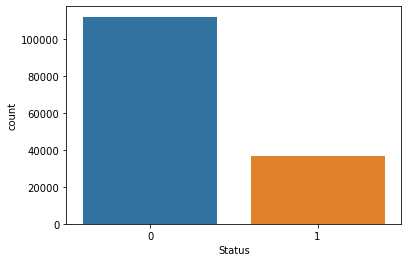

In [ ]:
sns.countplot(df1["Status"])

<AxesSubplot:xlabel='Status', ylabel='count'>

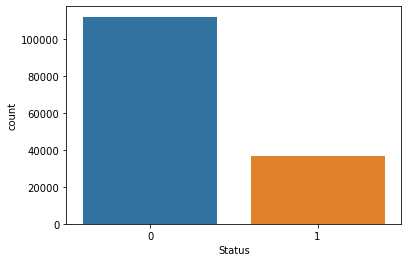

In [ ]:
sns.countplot(df1["Status"])

As we can see the dataset is balanced we have 25% of class balance on our target varibles so we dont need to do any Smote Technique here. 

In [ ]:
y = df1["Status"]
x= df1.drop("Status", axis=1)

In [ ]:
y = y.astype("int")

In [ ]:
x_cat = x.select_dtypes(include="object")

In [ ]:
enc = pd.get_dummies(x_cat, drop_first=True)
enc.shape
#x=enc

(148670, 35)

In [ ]:
x_num = x.select_dtypes(include=np.number)
x_num.shape

(148670, 5)

In [ ]:
x=pd.concat([x_num, enc], axis=1)
x.head()

,loan_amount,property_value,income,LTV,dtir1,loan_limit_ncf,Gender_Joint,Gender_Male,Gender_Sex Not Available,approv_in_adv_pre,...,age_45-54,age_55-64,age_65-74,age_<25,age_>74,submission_of_application_to_inst,Region_North-East,Region_central,Region_south,term_period_>=30 years
0,66.220960,14.035833,32.913514,14.886002,228.081512,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,1
1,76.739048,15.878906,47.940099,12.942148,173.722848,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,1
2,91.234015,16.169457,60.093965,13.369911,235.959393,0,0,1,0,1,...,0,0,0,0,0,1,0,0,1,1
3,93.965439,16.557642,65.008563,12.417220,205.016340,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
4,104.591376,16.771216,62.149624,14.351887,182.825455,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,1


Now we can see that our data is balanced for our target variable 
The number of approval are 111960 and declined are 111960 both are same

# Treain Test Split For Model Building 

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
from warnings import filterwarnings
filterwarnings('ignore')
import statsmodels.api as sm
from sklearn import metrics
from matplotlib.colors import ListedColormap
from sklearn.linear_model import LogisticRegression

In [ ]:
xtrain = sm.add_constant(xtrain)
xtest = sm.add_constant(xtest)

# BASE MODEL BUILDING USING LOGIT

In [ ]:
base_model = sm.Logit(ytrain, xtrain).fit()
base_model.summary()

Optimization terminated successfully.
         Current function value: 0.347601
         Iterations 13


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 Status   No. Observations:               104069
Model:                          Logit   Df Residuals:                   104029
Method:                           MLE   Df Model:                           39
Date:                Fri, 03 Feb 2023   Pseudo R-squ.:                  0.3770
Time:                        11:53:43   Log-Likelihood:                -36175.
converged:                       True   LL-Null:                       -58064.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=====================================================================================================
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                 3.4892        nan        nan        nan         nan         nan
loan_amount                           0.0448      0.007      6.139      0.000       0.030       0.059
property_value                       -0.3629      0.102     -3.562      0.000      -0.563      -0.163
income                               -0.0424      0.001    -33.848      0.000      -0.045      -0.040
LTV                                   0.0505      0.025      1.986      0.047       0.001       0.100
dtir1                                 0.0018      0.000     12.106      0.000       0.001       0.002
loan_limit_ncf                        0.6865      0.037     18.638      0.000       0.614       0.759
Gender_Joint                         -0.0765      0.031     -2.459      0.014      -0.137      -0.016
Gender_Male                           0.2170      0.029      7.595      0.000       0.161       0.273
Gender_Sex Not Available              0.0396      0.036      1.110      0.267      -0.030       0.109
approv_in_adv_pre                    -0.2471      0.029     -8.668      0.000      -0.303      -0.191
loan_type_type2                       1.9607        nan        nan        nan         nan         nan
loan_type_type3                      -0.3188      0.036     -8.868      0.000      -0.389      -0.248
loan_purpose_p2                       0.8540      0.064     13.399      0.000       0.729       0.979
loan_purpose_p3                       0.1990      0.029      6.763      0.000       0.141       0.257
loan_purpose_p4                       0.2553      0.029      8.765      0.000       0.198       0.312
Credit_Worthiness_l2                  0.3849      0.045      8.589      0.000       0.297       0.473
open_credit_opc                       0.2891      0.200      1.447      0.148      -0.103       0.681
business_or_commercial_nob/c          1.5285        nan        nan        nan         nan         nan
Neg_ammortization_not_neg            -1.0933      0.027    -41.155      0.000      -1.145      -1.041
interest_only_not_int                -0.2401      0.045     -5.335      0.000      -0.328      -0.152
lump_sum_payment_not_lpsm            -2.6134      0.057    -45.509      0.000      -2.726      -2.501
occupancy_type_pr                    -0.8705      0.043    -20.186      0.000      -0.955      -0.786
occupancy_type_sr                    -0.0698      0.076     -0.919      0.358      -0.219       0.079
total_units_2U                        0.5968      0.084      7.086      0.000       0.432       0.762
total_units_3U                        0.7874      0.165      4.770      0.000       0.464       1.111
total_units_4U                        0.0608      0.203      0.299      0.765      -0.338       0.460
credit_type_CRIF                      0.0344      0.023      1.497      0.134      -0.011       0.079
credit_type_EQUI                     11.2157      1.001     11.209      0.000  

In [ ]:
y_pred_prob = base_model.predict(xtest)
y_pred_prob.head()

60960     0.155353
37358     0.171545
107358    0.051634
1915      0.214195
45068     0.116235
dtype: float64

In [ ]:
y_pred = [0 if i<0.5 else 1 for i in y_pred_prob]
y_pred[0:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
conf_matrix = pd.DataFrame(data=confusion_matrix(ytest, y_pred), columns=["Predict0", "Predict1"], index=['Actual0','Actual1'])

<AxesSubplot:>

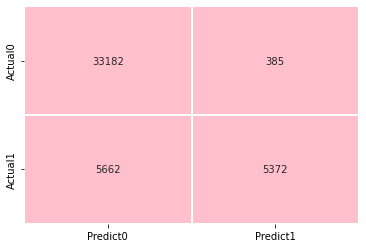

In [ ]:
from matplotlib.colors import ListedColormap
sns.heatmap(conf_matrix, annot=True, fmt="d" , cmap = ListedColormap(["pink"]) ,linewidths=0.2, cbar=False)

In [ ]:
acc_report=classification_report(ytest,y_pred)
print(acc_report)

              precision    recall  f1-score   support

           0       0.85      0.99      0.92     33567
           1       0.93      0.49      0.64     11034

    accuracy                           0.86     44601
   macro avg       0.89      0.74      0.78     44601
weighted avg       0.87      0.86      0.85     44601



In [ ]:
x_pred_prob = base_model.predict(xtrain)
x_pred_prob.head()

3187      0.124818
122372    0.055564
76665     0.161018
50215     0.120676
121213    0.148128
dtype: float64

In [ ]:
x_pred = [0 if i<0.5 else 1 for i in x_pred_prob]
x_pred[0:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
print(classification_report(ytrain, x_pred))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92     78464
           1       0.93      0.49      0.64     25605

    accuracy                           0.87    104069
   macro avg       0.90      0.74      0.78    104069
weighted avg       0.88      0.87      0.85    104069



**Interpretaion for Base Model**

1) from the base model using logit we can see that precision is 0.93 for the train dataset as well as for test dataset. 

2) looking at the precision of train dataset (0.93) and test dataset (0.93) we can say there is no overfitting in the dataset



**Important Metrics we are considering In Modle**

**Important Metrics to Consider for the Models**

1) For our Models we are going to consider Precision as a Main Metric
  as we want to find out true postive rates from the model

2) calculate the precision value we can use the following formula and 
    in built function from python library precision_score

   precision = TP / (TP+FP)



In [ ]:



# create a generalized function to calculate the metrics values for train set
def get_train_report(model):
    
    # for training set:
    # train_pred: prediction made by the model on the train dataset 'X_train'
    # y_train: actual values of the target variable for the train dataset

    # predict the output of the target variable from the train data 
    train_pred = model.predict(Xtrain)

    # return the performace measures on train set
    return(classification_report(y_train, train_pred))


  # create a generalized function to calculate the metrics values for test set
def get_test_report(model):
    
    # for test set:
    # test_pred: prediction made by the model on the test dataset 'X_test'
    # y_test: actual values of the target variable for the test dataset

    # predict the output of the target variable from the test data 
    test_pred = model.predict(X_test)

    # return the performace measures on test set
    return(classification_report(y_test, test_pred))

In [ ]:
x = df2.drop("Status", axis=1)

y = df2["Status"]
y = y.astype("int")
x_cat = x.select_dtypes(include="object")
x_num = x.select_dtypes(include=np.number)
enc = pd.get_dummies(x_cat, drop_first=True)
enc.shape
x= pd.concat([x_num, enc], axis=1)
x.head(3)

,loan_amount,property_value,income,Credit_Score,LTV,dtir1,loan_limit_ncf,Gender_Joint,Gender_Male,Gender_Sex Not Available,...,age_45-54,age_55-64,age_65-74,age_<25,age_>74,submission_of_application_to_inst,Region_North-East,Region_central,Region_south,term_period_>=30 years
0,66.220960,14.035833,32.913514,758,14.886002,228.081512,0,0,0,1,...,0,0,0,0,0,1,0,0,1,1
1,76.739048,15.878906,47.940099,552,12.942148,173.722848,0,0,1,0,...,0,1,0,0,0,1,0,0,0,1
2,91.234015,16.169457,60.093965,834,13.369911,235.959393,0,0,1,0,...,0,0,0,0,0,1,0,0,1,1


In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
!pip install xgboost

In [ ]:
# import various functions from sklearn
from sklearn.metrics import *
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import *
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

In [ ]:
df1.head(3)

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,total_units,income,credit_type,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,66.220960,not_neg,...,1U,32.913514,EXP,25-34,to_inst,14.886002,south,1,228.081512,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,76.739048,not_neg,...,1U,47.940099,EQUI,55-64,to_inst,12.942148,North,1,173.722848,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,91.234015,neg_amm,...,1U,60.093965,EXP,35-44,to_inst,13.369911,south,0,235.959393,>=30 years


In [ ]:
# create a generalized function to calculate the metrics values for train set
def get_train_report(model):
    
    # for training set:
    # train_pred: prediction made by the model on the train dataset 'X_train'
    # y_train: actual values of the target variable for the train dataset
    global train_pred
    # predict the output of the target variable from the train data 
    train_pred = model.predict(xtrain)

    # return the performace measures on train set
    return(classification_report(ytrain, train_pred))


# create a generalized function to calculate the metrics values for test set
def get_test_report(model):
    
    # for test set:
    # test_pred: prediction made by the model on the test dataset 'X_test'
    # y_test: actual values of the target variable for the test dataset
    global test_pred
    # predict the output of the target variable from the test data 
    test_pred = model.predict(xtest)

    # return the performace measures on test set
    return(classification_report(ytest, test_pred))


def plot_confusion_matrix(model):
    y_pred = model.predict(xtest)
    
    # create a confusion matrix
    # pass the actual and predicted target values to the confusion_matrix()
    cm = confusion_matrix(ytest, y_pred)

    # label the confusion matrix  
    # pass the matrix as 'data'
    # pass the required column names to the parameter, 'columns'
    # pass the required row names to the parameter, 'index'
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

    # plot a heatmap to visualize the confusion matrix
    # 'annot' prints the value of each grid 
    # 'fmt = d' returns the integer value in each grid
    # 'cmap' assigns color to each grid
    # as we do not require different colors for each grid in the heatmap,
    # use 'ListedColormap' to assign the specified color to the grid
    # 'cbar = False' will not return the color bar to the right side of the heatmap
    # 'linewidths' assigns the width to the line that divides each grid
    # 'annot_kws = {'size':25})' assigns the font size of the annotated text 
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})

    # set the font size of x-axis ticks using 'fontsize'
    plt.xticks(fontsize = 20)

    # set the font size of y-axis ticks using 'fontsize'
    plt.yticks(fontsize = 20)

    # display the plot
    plt.show()

#**Building All The Model**

**Decision Tree**

In [ ]:
# instantiate the 'DecisionTreeClassifier' object using 'entropy' criterion
# pass the 'random_state' to obtain the same samples for each time you run the code
decision_tree_classification = DecisionTreeClassifier(random_state = 10)

# fit the model using fit() on train data
decision_tree = decision_tree_classification.fit(xtrain, ytrain)

In [ ]:
test_pred = decision_tree.predict(xtest)

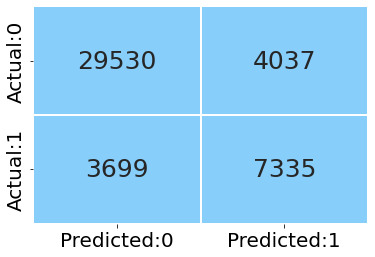

In [ ]:
plot_confusion_matrix(decision_tree)

calculate the performance measures on test and train

In [ ]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the decision tree to the function
train_report = get_train_report(decision_tree)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     78464
           1       1.00      1.00      1.00     25605

    accuracy                           1.00    104069
   macro avg       1.00      1.00      1.00    104069
weighted avg       1.00      1.00      1.00    104069



In [ ]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the decision tree to the function
test_report = get_test_report(decision_tree)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.89      0.88      0.88     33567
           1       0.65      0.66      0.65     11034

    accuracy                           0.83     44601
   macro avg       0.77      0.77      0.77     44601
weighted avg       0.83      0.83      0.83     44601



In [ ]:
precision_score(ytest,test_pred)

0.645005276116778

In [ ]:
recall_score(ytest,test_pred)

0.664763458401305

In [ ]:
f1_score(ytest,test_pred)

0.6547353387485495

In [ ]:
log_loss(ytest,test_pred)

5.990789492743542

**Interpretation for Decision Tree**

1) from the above model we can see the precision for train dataset is 1.0 and for test dataset it is 0.65

2) from the precision metrics we can say that model is overfitted. and can not be a good model. 

**RANDOM FOREST CLASSIFIER**

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(xtrain, ytrain, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(72848, 40)
(31221, 40)
(72848,)
(31221,)


In [ ]:
# instantiate the 'RandomForestClassifier'
# pass the required number of trees in the random forest to the parameter, 'n_estimators'
# pass the 'random_state' to obtain the same samples for each time you run the code
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)

# use fit() to fit the model on the train set
rf_model = rf_classification.fit(xtrain, ytrain)

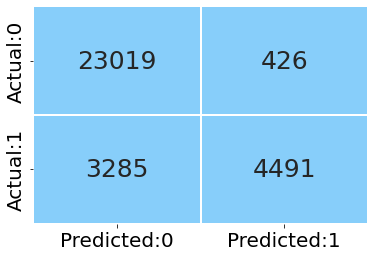

In [ ]:
plot_confusion_matrix(rf_model)

calculate the performance measures on test and train

In [ ]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the random forest to the function
train_report = get_train_report(rf_model)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     55019
           1       1.00      0.94      0.97     17829

    accuracy                           0.99     72848
   macro avg       0.99      0.97      0.98     72848
weighted avg       0.99      0.99      0.98     72848



In [ ]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the random forest to the function
test_report = get_test_report(rf_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.88      0.98      0.93     23445
           1       0.91      0.58      0.71      7776

    accuracy                           0.88     31221
   macro avg       0.89      0.78      0.82     31221
weighted avg       0.88      0.88      0.87     31221



In [ ]:
test_pred=rf_model.predict(xtest)

In [ ]:
precision_score(ytest,test_pred)

0.9133618059792556

In [ ]:
f1_score(ytest,test_pred)

0.7076341290475066

In [ ]:
recall_score(ytest,test_pred)

0.5775462962962963

In [ ]:
log_loss(ytest,test_pred)

4.105369457417085

**Interpretation for Random Forest Model**

1) from the random forest model we can see the on train dataset the precision is 1.0 and test dataset has 0.91.

2) from the above metrics it can be see that model is slighltly overfiited we can improve model performance and remove overfitting probelm by doing 
hyper parameter tunning. 

**Model Building From ADABOOST Classification** 

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:

ada_model = AdaBoostClassifier(n_estimators = 40, random_state = 10)


ada_model.fit(xtrain, ytrain)

AdaBoostClassifier(n_estimators=40, random_state=10)

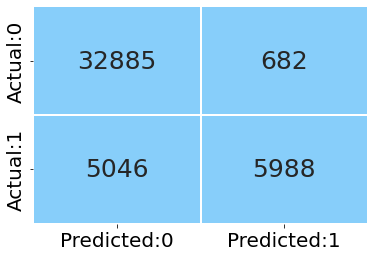

In [ ]:
plot_confusion_matrix(ada_model)

PERFORMANCE ON TRAIN AND TEST

In [ ]:
train_report = get_train_report(ada_model)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       0.87      0.98      0.92     78464
           1       0.90      0.55      0.68     25605

    accuracy                           0.87    104069
   macro avg       0.88      0.76      0.80    104069
weighted avg       0.88      0.87      0.86    104069



In [ ]:
test_report = get_test_report(ada_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.98      0.92     33567
           1       0.90      0.54      0.68     11034

    accuracy                           0.87     44601
   macro avg       0.88      0.76      0.80     44601
weighted avg       0.87      0.87      0.86     44601



In [ ]:
test_pred=ada_model.predict(xtest)

In [ ]:
precision_score(ytest,test_pred)

0.8977511244377812

In [ ]:
f1_score(ytest,test_pred)

0.6764572977858111

In [ ]:
recall_score(ytest,test_pred)

0.5426862425231104

**Ada_Boost  Model interpretation**

1) from the XG boost the precision for train dataset is 0.90 and for test dataset it is 0.90 both are equal and there is no overfitting in our model. 

we can perform hyper parameter to improve the model accuracy. 

Gradient_boost

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
gboost_model = GradientBoostingClassifier()

# fit the model using fit() on train data
gboost_model.fit(xtrain, ytrain)

GradientBoostingClassifier()

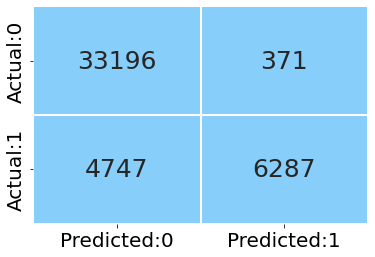

In [ ]:
plot_confusion_matrix(gboost_model)

 performance on test and train

In [ ]:
train_report = get_train_report(gboost_model)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     78464
           1       0.94      0.57      0.71     25605

    accuracy                           0.89    104069
   macro avg       0.91      0.78      0.82    104069
weighted avg       0.89      0.89      0.88    104069



In [ ]:
test_report = get_test_report(gboost_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93     33567
           1       0.94      0.57      0.71     11034

    accuracy                           0.89     44601
   macro avg       0.91      0.78      0.82     44601
weighted avg       0.89      0.89      0.87     44601



In [ ]:
test_pred=gboost_model.predict(xtest)

In [ ]:
precision_score(ytest,test_pred)

0.9442775608290778

In [ ]:
recall_score(ytest,test_pred)

0.569784303063259

In [ ]:
f1_score(ytest,test_pred)

0.710716708116663

**Interpretation for Gradient Boosting Model**

1) for the gradient boosting the train dataset precision is 0.94 and for test dataset it is 0.94 
   so precision is same for bith train and test dataset

2) based on it we can conclude there is no overfitting on this model we can try hyper parameter tunning to increase model 
   performance. 



**Building Model With Xgboost Classification**

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
xtrain.columns

Index(['loan_amount', 'property_value', 'income', 'Credit_Score', 'LTV',
       'dtir1', 'loan_limit_ncf', 'Gender_Joint', 'Gender_Male',
       'Gender_Sex Not Available', 'approv_in_adv_pre', 'loan_type_type2',
       'loan_type_type3', 'loan_purpose_p2', 'loan_purpose_p3',
       'loan_purpose_p4', 'Credit_Worthiness_l2', 'open_credit_opc',
       'business_or_commercial_nob/c', 'Neg_ammortization_not_neg',
       'interest_only_not_int', 'lump_sum_payment_not_lpsm',
       'occupancy_type_pr', 'occupancy_type_sr', 'total_units_2U',
       'total_units_3U', 'total_units_4U', 'credit_type_CRIF',
       'credit_type_EQUI', 'credit_type_EXP', 'age_35-44', 'age_45-54',
       'age_55-64', 'age_65-74', 'age_<25', 'age_>74',
       'submission_of_application_to_inst', 'Region_North-East',
       'Region_central', 'Region_south', 'term_period_>=30 years'],
      dtype='object')

In [ ]:
xtrain.rename({'age_35-44':'age_35_to_44',  'age_45-54':'age_45_to_54', 'age_55-64':'age_55_to_64', 'age_65-74':'age_65_to_74',
             'age_<25':"age_less_25", 'age_>74':"age_grt_75", 'term_period_>=30 years':'term_period_grt_equal_30_years' }, axis=1, inplace=True)

In [ ]:
xtest.rename({'age_35-44':'age_35_to_44',  'age_45-54':'age_45_to_54', 'age_55-64':'age_55_to_64', 'age_65-74':'age_65_to_74',
             'age_<25':"age_less_25", 'age_>74':"age_grt_75", 'term_period_>=30 years':'term_period_grt_equal_30_years' }, axis=1, inplace=True)

In [ ]:
xgb_model = XGBClassifier()

# fit the model using fit() on train data
xgb_model.fit(xtrain, ytrain)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

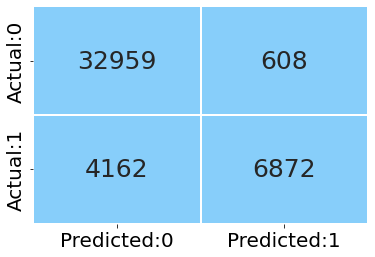

In [ ]:
plot_confusion_matrix(xgb_model)

In [ ]:
train_report = get_train_report(xgb_model)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       0.90      0.99      0.94     78464
           1       0.95      0.66      0.78     25605

    accuracy                           0.91    104069
   macro avg       0.93      0.82      0.86    104069
weighted avg       0.91      0.91      0.90    104069



In [ ]:
test_report = get_test_report(xgb_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     33567
           1       0.92      0.62      0.74     11034

    accuracy                           0.89     44601
   macro avg       0.90      0.80      0.84     44601
weighted avg       0.90      0.89      0.89     44601



In [ ]:
test_pred=xgb_model.predict(xtest)

In [ ]:
precision_score(ytest,test_pred)

0.9187165775401069

In [ ]:
recall_score(ytest,test_pred)

0.6228022475983325

In [ ]:
f1_score(ytest,test_pred)

0.7423571351409745

**XGB_Model Interpretation**

1) our train dataset precision is 0.95 and for test dataset the precision is 0.92 so based on it we can say there is no overfitting on the dataset to increase the model performance we can do hyper parameter tuning

**K NEAREST NEIGHBOURS Classification Model**

In [ ]:
x_scale=x.copy()

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler()
st=scaler.fit(x_scale)
x_scaled=st.transform(x_scale)


In [ ]:
print(x_bal_scaled)

[[0.22531461 0.3263126  0.14513506 ... 0.         1.         1.        ]
 [0.31430084 0.48919545 0.20586979 ... 0.         0.         1.        ]
 [0.4369327  0.51487316 0.25499351 ... 0.         1.         1.        ]
 ...
 [0.51290769 0.48919545 0.26827261 ... 0.         0.         1.        ]
 [0.28148001 0.3948054  0.17053008 ... 0.         0.         0.        ]
 [0.52311227 0.56828697 0.23337752 ... 0.         0.         1.        ]]


In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x_scaled, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
from sklearn.neighbors import KNeighborsClassifier


In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)

knn_model = knn.fit(xtrain, ytrain)
knn_model

KNeighborsClassifier(n_neighbors=1)

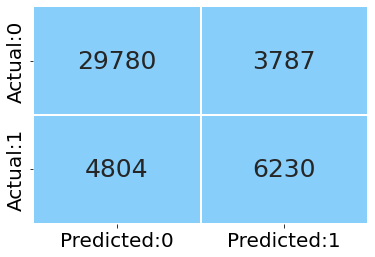

In [ ]:
plot_confusion_matrix(knn_model)

In [ ]:
train_report = get_train_report(knn_model)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     78464
           1       1.00      1.00      1.00     25605

    accuracy                           1.00    104069
   macro avg       1.00      1.00      1.00    104069
weighted avg       1.00      1.00      1.00    104069



In [ ]:
test_report = get_test_report(knn_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.86      0.89      0.87     33567
           1       0.62      0.56      0.59     11034

    accuracy                           0.81     44601
   macro avg       0.74      0.73      0.73     44601
weighted avg       0.80      0.81      0.80     44601



In [ ]:
test_pred=knn_model.predict(xtest)

In [ ]:
precision_score(ytest,test_pred)

0.6219426974143956

In [ ]:
recall_score(ytest,test_pred)

0.5646184520572775

In [ ]:
f1_score(ytest,test_pred)

0.5918958719300745

**Interpretaion for KNN** 

1) from the KNN we got train precision as 1.0 and for test dataset the precision is 0.62 

2) we can see that the model is overfitted as there is huge difference in our train and test precision

3) this can not be a good model to select by considering the overfitting problem in it. 


**Model Building With NAIVE BAYES CLASSIFIER**

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb= GaussianNB()
gnb_model= gnb.fit(xtrain,ytrain)

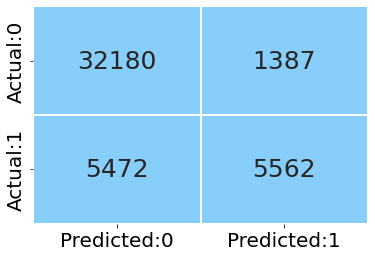

In [ ]:
plot_confusion_matrix(gnb_model)

In [ ]:
train_report = get_train_report(gnb_model)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       0.86      0.96      0.90     78464
           1       0.80      0.51      0.62     25605

    accuracy                           0.85    104069
   macro avg       0.83      0.73      0.76    104069
weighted avg       0.84      0.85      0.83    104069



In [ ]:
test_report = get_test_report(gnb_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.85      0.96      0.90     33567
           1       0.80      0.50      0.62     11034

    accuracy                           0.85     44601
   macro avg       0.83      0.73      0.76     44601
weighted avg       0.84      0.85      0.83     44601



In [ ]:
test_pred = gnb_model.predict(xtest)

In [ ]:
precision_score(ytest, test_pred)

0.8004029356741977

In [ ]:
recall_score(ytest,test_pred)

0.5040783034257749

In [ ]:
f1_score(ytest,test_pred)

0.6185842184285157

**Naive Bayes Model Interpretation**

1) from Naive bayes the train dataset precision is 0.80 and for test dataset precision is 0.80 both are equal 

2) the model has no overfitting probelm looking at the preciison but can be used hyper parameter tunning to increase the model 
   performacne. 

In [ ]:
import pandas as pd
a = {"model":["decision tree", "random forest", "ada boost", "xgboost", "gradient boost", "knn classifier", "naive"], 
 "precision_train":[1, 1, 0.90, 0.95 , 0.94, 1, 0.80],
"precision_test":[0.65, 0.91, 0.90, 0.92, 0.94, 0.62, 0.80]}
model_metrics = pd.DataFrame(a)
model_metrics

,model,precision_train,precision_test
0,decision tree,1.00,0.65
1,random forest,1.00,0.91
2,ada boost,0.90,0.90
3,xgboost,0.95,0.92
4,gradient boost,0.94,0.94
5,knn classifier,1.00,0.62
6,naive,0.80,0.80


#**Selecting 4 Models and Best Features** 

In [ ]:
#**Step 3 Selecting 4 Models and Best Features** 

**COMPARING DIFFERENT MODEL'S PRECISION WE CAME UP WITH FOUR MODELS TO PROCEED FURTHER**

1) XGBOOST

2) GBOOST

3) RANDOM FOREST

4) Ada Boost

**Selecting Best 8 Features from Models Using Voting_Technique from top 4 Models**

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=10)
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(104069, 40)
(44601, 40)
(104069,)
(44601,)


In [ ]:
xtrain.rename({'age_35-44':'age_35_to_44',  'age_45-54':'age_45_to_54', 'age_55-64':'age_55_to_64', 'age_65-74':'age_65_to_74',
             'age_<25':"age_less_25", 'age_>74':"age_grt_75", 'term_period_>=30 years':'term_period_grt_equal_30_years' }, axis=1, inplace=True)

In [ ]:
xtest.rename({'age_35-44':'age_35_to_44',  'age_45-54':'age_45_to_54', 'age_55-64':'age_55_to_64', 'age_65-74':'age_65_to_74',
             'age_<25':"age_less_25", 'age_>74':"age_grt_75", 'term_period_>=30 years':'term_period_grt_equal_30_years' }, axis=1, inplace=True)

In [ ]:
imp_features = pd.DataFrame({"Feature":xtrain.columns, "importance":xgb_model.feature_importances_})
imp_features = imp_features.sort_values("importance", ascending=False)
imp_features

,Feature,importance
27,credit_type_EQUI,0.756721
20,lump_sum_payment_not_lpsm,0.058728
15,Credit_Worthiness_l2,0.021661
18,Neg_ammortization_not_neg,0.020743
11,loan_type_type3,0.020130
35,submission_of_application_to_inst,0.013695
10,loan_type_type2,0.011851
13,loan_purpose_p3,0.006525
4,dtir1,0.006373
9,approv_in_adv_pre,0.006242


In [ ]:
imp_features = pd.DataFrame({"Feature":xtrain.columns, "importance":gboost_model.feature_importances_})
imp_features = imp_features.sort_values("importance", ascending=False)
imp_features

,Feature,importance
27,credit_type_EQUI,0.684865
4,dtir1,0.072251
3,LTV,0.048717
20,lump_sum_payment_not_lpsm,0.038867
2,income,0.034044
18,Neg_ammortization_not_neg,0.025697
15,Credit_Worthiness_l2,0.015185
11,loan_type_type3,0.014762
35,submission_of_application_to_inst,0.012642
0,loan_amount,0.011140


In [ ]:
imp_features = pd.DataFrame({"Feature":xtrain.columns, "importance":rf_model.feature_importances_})
imp_features = imp_features.sort_values("importance", ascending=False)
imp_features

,Feature,importance
27,credit_type_EQUI,0.185541
3,LTV,0.145128
1,property_value,0.121716
4,dtir1,0.114183
2,income,0.096359
0,loan_amount,0.070654
20,lump_sum_payment_not_lpsm,0.023474
28,credit_type_EXP,0.019902
26,credit_type_CRIF,0.017902
18,Neg_ammortization_not_neg,0.015968


In [ ]:
imp_features = pd.DataFrame({"Feature":xtrain.columns, "importance":ada_model.feature_importances_})
imp_features = imp_features.sort_values("importance", ascending=False)
imp_features

,Feature,importance
2,income,0.225
3,LTV,0.125
4,dtir1,0.100
0,loan_amount,0.050
13,loan_purpose_p3,0.050
14,loan_purpose_p4,0.050
18,Neg_ammortization_not_neg,0.025
38,Region_south,0.025
37,Region_central,0.025
35,submission_of_application_to_inst,0.025


we are having best features from the top 4 models now we will be selecting 8 repetative features from these and use thses 8 features to build the models. 

these are 8 features which are repetative;

1)  Credit_Worthiness_l2

2)  credit_type_EQUI

3)  dtir1

4)  LTV

5)  loan_amount

6)  lump_sum_payment_not_lpsm

7)  Neg_ammortization_not_neg

8)  income

In [ ]:
train_best_feat=xtrain[["Credit_Worthiness_l2", "credit_type_EQUI", "dtir1", "LTV", "loan_amount", "lump_sum_payment_not_lpsm", "Neg_ammortization_not_neg",
      "income"]]
test_best_feat = xtest[["Credit_Worthiness_l2", "credit_type_EQUI", "dtir1", "LTV", "loan_amount", "lump_sum_payment_not_lpsm", "Neg_ammortization_not_neg",
      "income"]]

In [ ]:
feat = {"best features":["Credit_Worthiness_l2", "credit_type_EQUI", "dtir1", "LTV", "loan_amount", "lump_sum_payment_not_lpsm", "Neg_ammortization_not_neg",
      "income"]}
pd.DataFrame(feat)

,best features
0,Credit_Worthiness_l2
1,credit_type_EQUI
2,dtir1
3,LTV
4,loan_amount
5,lump_sum_payment_not_lpsm
6,Neg_ammortization_not_neg
7,income


# Step - 4 **Hyper Parameter Tunning for the 4 Selected Models**

# Model Building With Best 8 Features And Hyper ParaMeter Tunning

In [ ]:
xgb_model=XGBClassifier()
xgb_model_best_feat = xgb_model.fit(train_best_feat, ytrain)
xgb_model_best_feat

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [ ]:
train_pred_xgb_signi= xgb_model_best_feat.predict(train_best_feat)
print(classification_report(ytrain, train_pred_xgb_signi))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     78464
           1       0.94      0.59      0.73     25605

    accuracy                           0.89    104069
   macro avg       0.91      0.79      0.83    104069
weighted avg       0.90      0.89      0.88    104069



In [ ]:
test_pred_xgb_signi= xgb_model_best_feat.predict(test_best_feat)
print(classification_report(ytest, test_pred_xgb_signi))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92     33567
           1       0.91      0.57      0.70     11034

    accuracy                           0.88     44601
   macro avg       0.89      0.77      0.81     44601
weighted avg       0.88      0.88      0.87     44601



In [ ]:
precision_score(ytest,test_pred_xgb_signi)

0.909776617348419

**Interpretation Before tuning the model**

1)After selecting the best features we build this model and checking overall precision train and test data 

2)train data we got precision is 0.94 and in test data is 0.91

3) we have found that there is minimal difference in both precision so there is no as such problem of underfitting overfitting

In [ ]:
xgb_boost = XGBClassifier()
tunning_para = {'learning_rate': [0.1, 0.2, 0.3,0.4,0.5,0.6],
               'max_depth':range(1,9)}
grid_object = GridSearchCV(estimator = xgb_boost, param_grid = tunning_para, cv = 5, n_jobs = -1)
grid_object.fit(x_train_feat_signi_xgboost, ytrain)

grid_object.best_params_

{'gamma': 0, 'learning_rate': 0.2, 'max_depth': 1}

In [ ]:
#xgb tunning
xgb_model=XGBClassifier(learning_rate =0.2 , max_depth=1 )
xgb_model_tunned = xgb_model.fit(train_best_feat, ytrain)
xgb_model_tunned

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.2, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=1, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [ ]:
train_pred_xgboost_tunned = xgb_model_tunned.predict(train_best_feat)
print(classification_report(ytrain, train_pred_xgboost_tunned))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92     78464
           1       0.94      0.51      0.66     25605

    accuracy                           0.87    104069
   macro avg       0.90      0.75      0.79    104069
weighted avg       0.88      0.87      0.86    104069



In [ ]:
test_pred_xgboost_tunned = xgb_model_tunned.predict(test_best_feat)
test_pred_xgboost_tunned[0:20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])

In [ ]:
print(classification_report(ytest, test_pred_xgboost_tunned))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92     33567
           1       0.94      0.50      0.66     11034

    accuracy                           0.87     44601
   macro avg       0.90      0.75      0.79     44601
weighted avg       0.88      0.87      0.85     44601



In [ ]:
precision_score(ytest, test_pred_xgboost_tunned)

0.943762781186094

**InTerpretation**

1) after tuning the xg-boost model the precision score in train is 0.94 and in test is 0.94 so we can conclude that our model performing well both in train and test

2)there is no problem of overfitting and undefitting

# gradient boosting Tunning


In [ ]:
gb_model_best_feat=GradientBoostingClassifier(random_state=10)
gb_model_best_feat=gb_model_best_feat.fit(train_best_feat,ytrain)
gb_model_best_feat

GradientBoostingClassifier(random_state=10)

In [ ]:
train_pred_gradient_signi= gb_model_best_feat.predict(train_best_feat)
print(classification_report(ytrain, train_pred_gradient_signi))

              precision    recall  f1-score   support

           0       0.87      0.99      0.92     78464
           1       0.93      0.55      0.69     25605

    accuracy                           0.88    104069
   macro avg       0.90      0.77      0.81    104069
weighted avg       0.89      0.88      0.87    104069



In [ ]:
test_pred_gradient_signi= gb_model_best_feat.predict(test_best_feat)
print(classification_report(ytest, test_pred_gradient_signi))

              precision    recall  f1-score   support

           0       0.87      0.99      0.92     33567
           1       0.93      0.55      0.69     11034

    accuracy                           0.88     44601
   macro avg       0.90      0.77      0.81     44601
weighted avg       0.88      0.88      0.87     44601



In [ ]:
precision_score(ytest,test_pred_gradient_signi)

0.931758530183727

**Interpretation Before tuning the model** 

1)After selecting the best features we build this model and checking overall precision train and test data 

2)train data we got precision is 0.93 and in test data is 0.93 i.e., both are same

3) we have found that there is minimal difference in both precision so there is no as such problem of underfitting overfitting

**Hyper parameter tunning for Gradient Boosting**

In [ ]:
gradient_boost = GradientBoostingClassifier()
tunning_para = {'learning_rate': [0.1, 0.2, 0.3,0.4,0.5,0.6],
                'n_estimators': [100, 200, 300],
               'max_depth':range(1,9)}

grid_object = GridSearchCV(estimator = gradient_boost, param_grid = tunning_para,  scoring = 'precision', cv = 5, n_jobs = -1)
grid_object.fit(x_train_feat_signi_gradient, ytrain)

grid_object.best_params_

In [ ]:
gradient_boost = GradientBoostingClassifier(learning_rate=0.1,max_depth=3,n_estimators=100)
gradient_boost_final_model= gradient_boost.fit(train_best_feat,ytrain)
gradient_boost_final_model

GradientBoostingClassifier()

In [ ]:
train_pred_gradient_signi= gradient_boost_final_model.predict(train_best_feat)
print(classification_report(ytrain, train_pred_gradient_signi))

              precision    recall  f1-score   support

           0       0.87      0.99      0.92     78464
           1       0.93      0.55      0.69     25605

    accuracy                           0.88    104069
   macro avg       0.90      0.77      0.81    104069
weighted avg       0.89      0.88      0.87    104069



In [ ]:
test_pred_gradient_boost_tunned = gradient_boost_final_model.predict(test_best_feat)
test_pred_gradient_boost_tunned[0:20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])

In [ ]:
print(classification_report(ytest, test_pred_gradient_boost_tunned))

              precision    recall  f1-score   support

           0       0.87      0.99      0.92     33567
           1       0.93      0.55      0.69     11034

    accuracy                           0.88     44601
   macro avg       0.90      0.77      0.81     44601
weighted avg       0.88      0.88      0.87     44601



In [ ]:
precision_score(ytest, test_pred_gradient_boost_tunned)

0.931758530183727

**Interpretation**

1) after tuning the gradient boost model the precision score in train is 0.93and in test is 0.93 so we can conclude that our model performing well both in train and test

2)there is no problem of overfitting and undefitting

# Random Forest Tunning and importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_classification = RandomForestClassifier( random_state=100)
rf_classification = rf_classification.fit(train_best_feat, ytrain)
rf_classification

RandomForestClassifier(random_state=100)

In [ ]:
train_pred_rf= rf_classification.predict(train_best_feat)
print(classification_report(ytrain, train_pred_rf))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     78464
           1       1.00      0.98      0.99     25605

    accuracy                           0.99    104069
   macro avg       1.00      0.99      0.99    104069
weighted avg       0.99      0.99      0.99    104069



In [ ]:
test_pred_rf_model= rf_classification.predict(test_best_feat)
print(classification_report(ytest, test_pred_rf_model))

              precision    recall  f1-score   support

           0       0.87      0.97      0.92     33567
           1       0.86      0.58      0.69     11034

    accuracy                           0.87     44601
   macro avg       0.87      0.77      0.81     44601
weighted avg       0.87      0.87      0.86     44601



In [ ]:
precision_score(ytest,test_pred_rf_model)

0.864326375711575

**interpretaion for random forest before hyper parameter**

1) the precision for train dataset for random forest is 1.0 and for test dataset is 0.87. 

2) from the above metrics we can say that our model is overfitted so we have to improve our model performance by doing hyper parameter tunning. 

In [ ]:
tune_para=[{'criterion':['gini','entropy'],'n_estimators':[8,10,20,30,50,70, 100, 200],'max_depth':[10,15,20],'max_leaf_nodes':[2,3,5,9],'min_samples_split':[1,3,5,7],'min_samples_leaf':[2,3,4,5],'max_features':['sqrt','log2']}]
random_forest_classification=RandomForestClassifier(random_state=100)
rf_grid=GridSearchCV(estimator=random_forest_classification,param_grid=tune_para,cv=5)
rf_grid_model=rf_grid.fit(x_train_feat_signi_rf , ytrain)
print('Best Parameters for RF:',rf_grid_model.best_params_,'\n')

In [ ]:
rf_model_tunning=RandomForestClassifier(criterion='entropy',max_depth=10,max_features='log2',max_leaf_nodes=9,min_samples_leaf=3,min_samples_split=4,n_estimators=20,random_state=100)
rf_model_tunning = rf_model_tunning.fit(train_best_feat, ytrain)
rf_model_tunning

RandomForestClassifier(criterion='entropy', max_depth=10, max_features='log2',
                       max_leaf_nodes=9, min_samples_leaf=3,
                       min_samples_split=4, n_estimators=20, random_state=100)

In [ ]:
train_pred_rf_model_tunning= rf_classification.predict(train_best_feat)
print(classification_report(ytrain, train_pred_rf_model_tunning))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     78464
           1       1.00      0.98      0.99     25605

    accuracy                           0.99    104069
   macro avg       1.00      0.99      0.99    104069
weighted avg       0.99      0.99      0.99    104069



In [ ]:
test_pred_rf_model_tunned= rf_model_tunning.predict(test_best_feat)
print(classification_report(ytest, test_pred_rf_model_tunned))

              precision    recall  f1-score   support

           0       0.85      0.99      0.91     33567
           1       0.96      0.45      0.62     11034

    accuracy                           0.86     44601
   macro avg       0.90      0.72      0.77     44601
weighted avg       0.88      0.86      0.84     44601



In [ ]:
precision_score(ytest, test_pred_rf_model_tunned)

0.9616196507388217

**InterPretation For Random Forest**

1) from the tunned random forest model we can see that precision for train dataset is 1.00 and for test dataset it is 0.96

2) for train dataset the precision is 1.0 it is indicating that there is a slight overfitting in model so cant be a perfect final model. 

# ADA BOOSTING

In [ ]:
ada_model=AdaBoostClassifier(random_state=100)
ada_model_best_feat = ada_model.fit(train_best_feat, ytrain)
ada_model_best_feat

AdaBoostClassifier(random_state=100)

In [ ]:
train_pred_Ada_model= ada_model_best_feat.predict(train_best_feat)
print(classification_report(ytrain, train_pred_Ada_model))

              precision    recall  f1-score   support

           0       0.86      0.98      0.92     78464
           1       0.91      0.53      0.67     25605

    accuracy                           0.87    104069
   macro avg       0.89      0.75      0.79    104069
weighted avg       0.88      0.87      0.86    104069



In [ ]:
test_pred_ada_model= ada_model_best_feat.predict(test_best_feat)
print(classification_report(ytest, test_pred_ada_model))

              precision    recall  f1-score   support

           0       0.86      0.98      0.92     33567
           1       0.91      0.52      0.66     11034

    accuracy                           0.87     44601
   macro avg       0.89      0.75      0.79     44601
weighted avg       0.87      0.87      0.86     44601



**Interpretation Before tuning the model**

1)After selecting the best features we build this model and checking overall precision train and test data 

2)train data we got precision is 0.91 and in test data is 0.91 i.e., both are same

3) we have found that there is minimal difference in both precision so there is no as such problem of underfitting overfitting

# ADA BOOST Tunning

In [ ]:
from sklearn.model_selection import GridSearchCV
#Creating a grid of hyperparameters
ada_boost = AdaBoostClassifier()
tunning_para = {'n_estimators': [10, 25, 50, 100, 200, 300],
              'learning_rate': [0.1, 0.01, 0.001, 1.0, 2.0, 3.0]}

grid_object = GridSearchCV(estimator = ada_boost, param_grid = tunning_para, scoring = 'precision', cv = 5, n_jobs = -1)
grid_object.fit(xtrain_best_feat_ada, ytrain)

grid_object.best_params_

In [ ]:
ada_boost = AdaBoostClassifier(learning_rate=1,n_estimators=200)
ada_tunned_model=ada_boost.fit(train_best_feat,ytrain)
ada_tunned_model

AdaBoostClassifier(learning_rate=1, n_estimators=200)

In [ ]:
train_pred_Ada_model= ada_tunned_model.predict(train_best_feat)
print(classification_report(ytrain, train_pred_Ada_model))

              precision    recall  f1-score   support

           0       0.86      0.98      0.92     78464
           1       0.91      0.53      0.67     25605

    accuracy                           0.87    104069
   macro avg       0.89      0.76      0.79    104069
weighted avg       0.88      0.87      0.86    104069



In [ ]:
test_pred_ada_model= ada_tunned_model.predict(test_best_feat)
print(classification_report(ytest, test_pred_ada_model))

              precision    recall  f1-score   support

           0       0.86      0.98      0.92     33567
           1       0.91      0.52      0.66     11034

    accuracy                           0.87     44601
   macro avg       0.89      0.75      0.79     44601
weighted avg       0.87      0.87      0.86     44601



In [ ]:
precision_score(ytest, test_pred_ada_model)

0.9106832886223765

**InTerpretation For Ada Boost**

1) after tuning the ada boost model the precision score in train is 0.91 and in test is 0.91  
so we can conclude that our model performing well both in train and test

2)there is no problem of overfitting and undefitting

In [ ]:
table_2= {"model":["xgboost" , "gradient boost", "random forest", "ada boost"],"train_precision" : [0.94, 0.93, 1.0, 0.91],
 "test_precision":[0.94, 0.93, 0.96, 0.91]}
pd.DataFrame(table_2)

,model,train_precision,test_precision
0,xgboost,0.94,0.94
1,gradient boost,0.93,0.93
2,random forest,1.00,0.96
3,ada boost,0.91,0.91


#**Selecting The Best Model Out 4**

From the best 4 models such as XGBOOST, Gradient Boost, naive, and Randome forest these are the scores after 
performing tunning ;

Xgboost ; 0.943762781186094

Gradient Boosting ; 0.931758530183727

Random Forest ;0.9616196507388217

Ada_boost ; 0.9106832886223765

we can see for xgboost our precision score is high so we can choose xgboost as our final model. 
we are not going for random forest as for train dataset the precision is 1 and for test dataset precision is 0.96 since there is
slight overfitting on train dataset we avoid selecting random forest and choose XGB as our final model. 

#**Identify the new features**

# FEATURE ENGINEERING AFTER MODEL BUILDING

In [ ]:
df1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,Neg_ammortization,...,total_units,income,credit_type,age,submission_of_application,LTV,Region,Status,dtir1,term_period
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,66.220960,not_neg,...,1U,32.913514,EXP,25-34,to_inst,14.886002,south,1,228.081512,>=30 years
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,76.739048,not_neg,...,1U,47.940099,EQUI,55-64,to_inst,12.942148,North,1,173.722848,>=30 years
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,91.234015,neg_amm,...,1U,60.093965,EXP,35-44,to_inst,13.369911,south,0,235.959393,>=30 years
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,93.965439,not_neg,...,1U,65.008563,EXP,45-54,not_inst,12.417220,North,0,205.016340,>=30 years
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,104.591376,not_neg,...,1U,62.149624,CRIF,25-34,not_inst,14.351887,North,0,182.825455,>=30 years


In [ ]:
data = df1.copy()

In [ ]:
data["ratio_of_proprtvalue"]=data["property_value"]/data["loan_amount"]
data["ratio_of_proprtvalue"].head()

0    0.211955
1    0.206921
2    0.177231
3    0.176210
4    0.160350
Name: ratio_of_proprtvalue, dtype: float64

In [ ]:
data.drop(["loan_amount", "property_value"], axis=1, inplace=True)

In [ ]:
data.head(3)

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,Neg_ammortization,interest_only,...,income,credit_type,age,submission_of_application,LTV,Region,Status,dtir1,term_period,ratio_of_proprtvalue
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,not_neg,not_int,...,32.913514,EXP,25-34,to_inst,14.886002,south,1,228.081512,>=30 years,0.211955
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,not_neg,not_int,...,47.940099,EQUI,55-64,to_inst,12.942148,North,1,173.722848,>=30 years,0.206921
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,neg_amm,not_int,...,60.093965,EXP,35-44,to_inst,13.369911,south,0,235.959393,>=30 years,0.177231


In [ ]:
data["Status"]= data["Status"].astype(int)

In [ ]:
data_cat = data.select_dtypes(include="object")
data_num = data.select_dtypes(include=np.number)
enc = pd.get_dummies(data_cat, drop_first=True)
data_num.head(1)

,income,LTV,Status,dtir1,ratio_of_proprtvalue
0,32.913514,14.886002,1,228.081512,0.211955


In [ ]:
data1=pd.concat([data_num, enc], axis=1)
data1.head()

,income,LTV,Status,dtir1,ratio_of_proprtvalue,loan_limit_ncf,Gender_Joint,Gender_Male,Gender_Sex Not Available,approv_in_adv_pre,...,age_45-54,age_55-64,age_65-74,age_<25,age_>74,submission_of_application_to_inst,Region_North-East,Region_central,Region_south,term_period_>=30 years
0,32.913514,14.886002,1,228.081512,0.211955,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,1
1,47.940099,12.942148,1,173.722848,0.206921,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,1
2,60.093965,13.369911,0,235.959393,0.177231,0,0,1,0,1,...,0,0,0,0,0,1,0,0,1,1
3,65.008563,12.417220,0,205.016340,0.176210,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
4,62.149624,14.351887,0,182.825455,0.160350,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
x=data1.drop("Status", axis=1)

In [ ]:
y= data1["Status"]

In [ ]:
xtrain_fe, xtest_fe, ytrain_fe, ytest_fe = train_test_split(x,y,test_size=0.3, random_state=10)
print(xtrain_fe.shape)
print(ytrain_fe.shape)
print(xtest_fe.shape)
print(ytest_fe.shape)

(104069, 39)
(104069,)
(44601, 39)
(44601,)


In [ ]:
y.head()

0    1
1    1
2    0
3    0
4    0
Name: Status, dtype: int32

**Buidling xgb Boost Model on new Features**

In [ ]:
xtrain_fe.rename({'age_35-44':'age_35_to_44',  'age_45-54':'age_45_to_54', 'age_55-64':'age_55_to_64', 'age_65-74':'age_65_to_74',
             'age_<25':"age_less_25", 'age_>74':"age_grt_75", 'term_period_>=30 years':'term_period_grt_equal_30_years' }, axis=1, inplace=True)

In [ ]:
xtest_fe.rename({'age_35-44':'age_35_to_44',  'age_45-54':'age_45_to_54', 'age_55-64':'age_55_to_64', 'age_65-74':'age_65_to_74',
             'age_<25':"age_less_25", 'age_>74':"age_grt_75", 'term_period_>=30 years':'term_period_grt_equal_30_years' }, axis=1, inplace=True)

In [ ]:
Xg_boost_fe = XGBClassifier()
Xg_boost_fe=Xg_boost_fe.fit(xtrain_fe, ytrain_fe)
Xg_boost_fe

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [ ]:
train_pred_Xg_boost_fe= Xg_boost_fe.predict(xtrain_fe)
print(classification_report(ytrain_fe, train_pred_Xg_boost_fe))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94     78464
           1       0.95      0.66      0.78     25605

    accuracy                           0.91    104069
   macro avg       0.92      0.82      0.86    104069
weighted avg       0.91      0.91      0.90    104069



In [ ]:
test_pred_xg_boost_fe= Xg_boost_fe.predict(xtest_fe)
print(classification_report(ytest_fe, test_pred_xg_boost_fe))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     33567
           1       0.92      0.62      0.74     11034

    accuracy                           0.89     44601
   macro avg       0.90      0.80      0.84     44601
weighted avg       0.90      0.89      0.89     44601



**Hyper Parameter Tunning for xgb BOOST AFTER FEATURE ENGINEERING**

In [ ]:
Xg_boost_fe = XGBClassifier(learning_rate =0.2 , max_depth=1)
Xg_boost_fe_tunned=Xg_boost_fe.fit(xtrain_fe, ytrain_fe)
Xg_boost_fe_tunned

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.2, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=1, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [ ]:
train_pred_xg_boost_fe_tunned= Xg_boost_fe_tunned.predict(xtrain_fe)
print(classification_report(ytrain_fe, train_pred_xg_boost_fe_tunned))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92     78464
           1       0.95      0.50      0.66     25605

    accuracy                           0.87    104069
   macro avg       0.91      0.75      0.79    104069
weighted avg       0.88      0.87      0.86    104069



In [ ]:
test_pred_xg_boost_fe_tunned= Xg_boost_fe_tunned.predict(xtest_fe)
print(classification_report(ytest_fe, test_pred_xg_boost_fe_tunned))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92     33567
           1       0.95      0.50      0.66     11034

    accuracy                           0.87     44601
   macro avg       0.91      0.75      0.79     44601
weighted avg       0.88      0.87      0.85     44601



In [ ]:
precision_score(ytest_fe, test_pred_xg_boost_fe_tunned)

0.9548130193905817

**Interpretation**

1) after doing tunning for new feature we got train precision as 0.95 and test precision as 0.95 so 
   is same and this model has no overfitting Problem. 



After getting New features Our Precision for XGBoost model is 0.95 where as before new features our precision is 0.94 there
is a slight increament in our model performance by adding new features. 


**Summary and Conlusion Of The Project**


1) This model was created for predicting the eligibility for a loan (approved or not) according to many features.

2) There were large number of features must be dropped , as: (ID, Year, rate_of_interest, Interest_rate_spread, Upfront_charges)

3) some features are having high bias so these should be droped they are "Secured_by", "construction_type",
             "co-applicant_credit_type", "Security_Type"
             
4) from all the features we have selected best features using voting_mechanism from the top 4 models and best features  are
   "Credit_Worthiness_l2", "credit_type_EQUI", "dtir1", "LTV",       "loan_amount", "lump_sum_payment_not_lpsm",    "Neg_ammortization_not_neg" and  "income"

5) we were supposed to fill null values with median for numerical and mode for categroical columns. for the DTIR1 column
   there were more then 15% of the null values so we predicted using KNN imputer and checked the data distribution and it 
   resulted the distribution remains same.
   
6) Number of unapproved loans were larger than approved. for our target varible class balance is 75% for non approval 25% 
   for approval it is pretty goood and doesnt required any Smote Technique. 
   
7) Loan amounts were between (3,576,500 and 16,500)  and The largest category applied for alone there ages were between (45-54)  for loan of (type 3)

8) After handling  scaling, we were suppose to check significane of the variable using statistical test and convert all values to numerical values to be ready to be used for the model.

9) we have built 8 models out of it 4 were choosen based on precision they are ADA-Boosting, XG-Boosting, Gradient-Boosting,
   and Random-Forest. 
   
10) based on the best features which are selected by voting-mechanism we built 4 models along with tunning and selected 
    a best model as XGboosting_tunned with precision of 0.94% 
    
11) after all we again performed feature engineering and created a new feature prapotion_of_property_value and dropped the two 
    columns that were used to create new feature.
 
12) the best model which is Xgboost we built another model for new features and performed the tunning it gave us much better precision as 0.956 so this can be our final model. 
 


**BUSINESS SUGGESTIONS**


1. we have see bank is approving loan with high dtir1(debt to income ratio) no matter what is their credit Score of gender 

2. And we observed loan is approved for few people with low property value and high dtir1(debt to income ratio)
   bank have to take care of them.
   
3. Another thing  LTV of above 100 is almost everyone getting their loan approved no matter what is their dtir1
   high dtir1 and low Ltv  also getting loan approved
   
4. from the dataset we seen very less income get their loan approved even if loan_amount is very large
   need to figure out
   
5.  Their is positive linear relationship between loan_amount and property_vslue 
    one thing we can notice that applicant with low loan_amount having low property_value are mostly decline
    so business have to take care of this in  such kind of scenerio bank is unescessary losing business it can approve small loans.